In [1]:
import sys,os
sys.path.append("../../../work2/ownutils/scriptssyn/") #update path accordingly
sys.path.append('./bin/')
#sys.path.append('./cflinux/')
import PolAB_A_allpars
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
from basic import compute_synergy as compute_synergyb
import fluxes
import matplotlib.colors as colors

In [2]:
folder="/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-kinsynsub1/2020_08_05_ku_samebasal/results"
files=os.listdir(folder)
len(files)

200

In [3]:
classes_to_drop=["zeros","zerod","zeroi","nan",np.NaN]

In [4]:
green="#c6cdad"
blue="#d3dbe4"
red="#e3cbc8"

In [5]:
allkufactors=np.logspace(0.1,10,50)
alldfs=[]
n=0
for f in files:
    if "20200805" in f:
        try:
            df=pd.read_csv(os.path.join(folder,f))

        except: #some jobs were killed due to time limit but the results were enough to see variety of behaviours
            pass
        npt1=max(df["npt1"])

        df["name"]=f.split("_")[-1].split(".")[0]
        print(df["name"].values[0],npt1)

        if npt1>0:
            n+=npt1-1
            df=df[df["npt1"]<npt1]
            df["id"]=["%s-%s"%(xy[0],xy[1]) for xy in zip(df["name"].values,df["npt1"].values)]
            alldfs.append(df[df["npt1"]<npt1])
print("total points:", n)
alldfs=pd.concat(alldfs)
df=alldfs

21 0
35 3
34 1
20 5
36 0
22 3
23 0
37 0
33 7
27 1
26 1
32 0
18 0
24 0
30 1
31 0
25 1
19 0
81 3
95 2
42 0
56 4
3 1
2 2
57 3
43 1
94 2
80 6
96 0
82 2
55 0
41 0
69 3
0 5
1 4
68 0
40 2
54 1
83 1
97 0
93 0
87 0
78 2
50 7
44 4
5 0
4 1
45 0
51 1
79 1
86 1
92 1
84 4
90 2
47 0
53 4
6 1
7 2
52 4
46 2
91 1
85 1
88 3
63 1
77 2
76 2
62 0
89 1
74 0
60 4
48 1
9 0
8 0
49 4
61 1
75 5
59 2
71 0
65 2
64 3
70 0
58 1
99 1
66 1
72 3
73 3
67 2
98 2
14 0
28 1
29 0
15 0
17 3
16 0
12 6
13 1
39 0
11 1
10 1
38 0
total points: 93


In [6]:
df.columns

Index(['npt1', 'npt2', 'class', 'p0', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7',
       'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17',
       'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'synab_0.1', 'synab_1.51429',
       'synab_2.92857', 'synab_4.34286', 'synab_5.75714', 'synab_7.17143',
       'synab_8.58571', 'synab_10', 'synba_0.1', 'synba_1.51429',
       'synba_2.92857', 'synba_4.34286', 'synba_5.75714', 'synba_7.17143',
       'synba_8.58571', 'synba_10', 'name', 'id'],
      dtype='object')

In [7]:
mpl.rcParams["font.size"]=14
def tint_ax(ax):
    xmin,xmax=ax.get_xlim()
    ymin,ymax=ax.get_ylim()
    if xmax>0:
        ax.fill_between([0,xmax],ymax,color=green,zorder=1)
    if xmin<0:
        ax.fill_between([xmin,0],ymax,color=blue,zorder=1)
        ax.fill_between([xmin,0],ymin,color=red,zorder=1)
    ax.set_xlim(xmin,xmax)
    ax.set_ylim(ymin,ymax)
    return ax

rhofunc=PolAB_A_allpars.interface_rhos_GRF_PolAB_A_A
parsliststr='ktia0,ktan0,ktin0,ktni0,ktiaA,ktanA,ktinA,ktniA,ktiaB,ktanB,ktinB,ktniB,kbBa,kuBa,kbBi,kuBi,kbBn,kuBn,kbAa,kuAa,kbAi,kuAi,kbAn,kuAn'
parslist=parsliststr.split(',')
parslist_order=['ktni0','ktin0','ktia0','ktan0','ktniA','ktinA','ktiaA','ktanA','ktniB','ktinB','ktiaB','ktanB','kbBa','kuBa','kbBi','kuBi','kbBn','kuBn','kbAa','kuAa','kbAi','kuAi','kbAn','kuAn']
flux_order_labs=['2-1','1-2','1-0','0-2','5-4','4-5','4-3','3-5','8-7','7-8','7-6','6-8','2-5','5-2','2-8','8-2','1-4','4-1','1-7','7-1','0-3','3-0','0-6','6-0']

labls=np.array(parslist[:18])
idxs_ratios=[2,3,6,7,10,11,12,13,14,15,16,17]
idxs_noratios=[0,1,4,5,8,9]
#idxs_rates=[3,2,7,6,11,10,0,4,8,1,5,9,12,13,14,15,16,17]
idxs_rates=[2,3,0,1,6,7,4,5,10,11,8,9,16,17,14,15,12,13]


edges=[(2,'ktia0',1),(1,'ktan0',3),(2,'ktin0',3),(3,'ktni0',2),
       (8,'ktiaA',7),(7,'ktanA',9),(8,'ktinA',9),(9,'ktniA',8),
       (5,'ktiaB',4),(4,'ktanB',6),(5,'ktinB',6),(6,'ktniB',5),
      (1,'kbBa-B',4),(4,'kuBa',1),(2,'kbBi-B',5),(5,'kuBi',2),(3,'kbBn-B',6),(6,'kuBn',3),
       (1,'kbAa-A',7),(7,'kuAa',1),(2,'kbAi-A',8),(8,'kuAi',2),(3,'kbAn-A',9),(9,'kuAn',3)]
edges_=[]
for tuple_ in edges:
    edges_.append((tuple_[0]-1,tuple_[1],tuple_[2]-1))
    
graph_edges_dict=dict()
for x in edges:
    graph_edges_dict['%s-%s'%(x[0],x[2])]=x[1]

#this is tha labels corresponding to the flux matrix, then flattened so that it is a row
nnodes=9
flux_names_mat=np.empty((nnodes,nnodes),dtype=object)
for i in np.arange(nnodes):
    for j in np.arange(nnodes):
        flux_names_mat[i,j]='%d-%d'%(i,j)
#print(flux_names_mat)
flux_names_flat=flux_names_mat.flatten()
#print(flux_names_flat)

#names of transitions for the fluxes, appending an extension to distinguish the different TF states
all_fnames=[]
flux_order_labs_AB=[]
for i in [3]:
    if i==0:
        ext='0'
    elif i==1:
        ext='A'
    elif i==2:
        ext='B'
    else:
        ext='AB'
    all_fnames.extend(['%s.%s'%(x,ext) for x in flux_names_flat]) #add extension to the labls obtained above
    flux_order_labs_AB.extend(['%s.%s'%(x,ext) for x in flux_order_labs]) #add extension to the order
all_fnames=np.array(all_fnames)
    
def truncate_colormap(cmap, minval=0.0, maxval=1.0, n=100):
    new_cmap = colors.LinearSegmentedColormap.from_list(
        'trunc({n},{a:.2f},{b:.2f})'.format(n=cmap.name, a=minval, b=maxval),
        cmap(np.linspace(minval, maxval, n)))
    return new_cmap
def makeplot(parset,getsynergiesonly=False):
    node0=2
    fontsize=14
    cmap=truncate_colormap(plt.cm.Greys,minval=0.2,maxval=1.0)
    
    idxs=range(3)
    msizes=[120,75,40,15]
    kufactors=np.array([0.1,0.5,2.5,10])
    allkufactors=np.arange(0.1,10.0,0.05)
    
    basiccoords={0: [0,-1],
         1: [0.,1],
         2: [-1, 0]}


    dx=2.5
    coords=dict()
    coords[0]=basiccoords[0]
    coords[1]=basiccoords[1]
    coords[2]=basiccoords[2]
    coords[3]=[basiccoords[0][0]+dx,basiccoords[0][1]]
    coords[4]=[basiccoords[1][0]+dx,basiccoords[1][1]]
    coords[5]=[basiccoords[2][0]+dx,basiccoords[2][1]]
    coords[6]=[basiccoords[0][0]-dx,basiccoords[0][1]]
    coords[7]=[basiccoords[1][0]-dx,basiccoords[1][1]]
    coords[8]=[basiccoords[2][0]-dx,basiccoords[2][1]]


    #connectstyles
    connectstyle1='arc3,rad=-0.45'
    connectstyle2='arc3,rad=0.2'
    connectstyle3='arc3,rad=-0.075'
    
    #connectstylelist=[connectstyle1,connectstyle2,connectstyle3]
    #kuvalslist=[vlines_1458,vlines_1486]

    print(parset[0:4])
    print(parset[4:8])
    print(parset[8:12])
    print(parset[12],parset[13])
    A=1
    B=1
    netJ=True
    #kuvals=kuvalslist[idxnum]

    allGslist=[]
    allG2slist=[]
    allcolorslist=[]
    allkuvals=[]
    kuvals=[]
    synergies=[]
    allsynergies=[]
    
    GRFAB=[]
    GRFA=[]
    GRFB=[]
    GRF0=[]

    for i in range(len(allkufactors)): #kuvals)):
        #ku=kuvals[i]
        parset2=parset.copy()
        parset2[[13,15,17,19,21,23]]=parset[[13,15,17,19,21,23]]*allkufactors[i]
        
        allkuvals.append(parset2[13])
        syn=compute_synergyb(parset2,PolAB_A_allpars.interface_GRF_PolAB_A_A)
        allsynergies.append(syn)
        
        GRF0.append(PolAB_A_allpars.interface_GRF_PolAB_A_A(parset2,np.array([0]),0))
        GRFAB.append(PolAB_A_allpars.interface_GRF_PolAB_A_A(parset2,np.array([1]),1))
        GRFA.append(PolAB_A_allpars.interface_GRF_PolAB_A_A(parset2,np.array([0]),2))
        GRFB.append(PolAB_A_allpars.interface_GRF_PolAB_A_A(parset2,np.array([2]),0))
    if np.any(allsynergies==None):
        print(allsynergies)
    #print(allsynergies)
    for i in range(len(kufactors)):
        parset2=parset.copy()
        parset2[[13,15,17,19,21,23]]=parset[[13,15,17,19,21,23]]*kufactors[i]
        kuvals.append(parset2[13])
        syn=compute_synergyb(parset2,PolAB_A_allpars.interface_GRF_PolAB_A_A)
        synergies.append(syn)
        rhos=PolAB_A_allpars.interface_rhos_GRF_PolAB_A_A(parset2,np.array([B]),A)
        P=rhos/np.sum(rhos)
        J=fluxes.get_fluxes(edges_,A,B,parset2,P,netJ=netJ)
        Js_ar=J.flatten()
        #print(Js_ar)
        #keep only those columns with nonzero fluxes
        mask=[]
        for col in range(nnodes*nnodes):
            if np.any(Js_ar[col]>1e-15):
                mask.append(col)
        #mat=np.log10(all_Js)[:,mask]
        Js_ar=Js_ar[mask]
        names_ar=all_fnames[mask]
        G=fluxes.get_graph_fromJarray(np.log10(Js_ar),names_ar,min_=-15)
        Gs=[G]
        G2=fluxes.get_dominant_path_G(G,node0)
        all_G2s=[G2]
        allGslist.append(Gs)
        allG2slist.append(all_G2s)
        colors_=[[G[e[0]][e[1]]["weight"] for e in G.edges()] for G in Gs]
        allcolorslist.append(colors_)
        
    if getsynergiesonly:
        return [allsynergies,synergies,kuvals]
    else:
        
        fig,axes=plt.subplots(1,2,figsize=(7,3))
        ax=axes[1]
        synab=[x[0] for x in synergies] 
        synba=[x[1] for x in synergies]
        synaball=[x[0] for x in allsynergies] 
        synbaall=[x[1] for x in allsynergies]


        #idxs=[idxs_thisclass[]
        ax.scatter(synab,synba,edgecolors='k',facecolors='none',s=msizes) #c=range(len(kufactors)),cmap=cmap,norm=norm)
        #ax.text(synab[0],synba[0],str(idx))
        #ax.text(synab[-1],synba[-1],str(idx))
        ax.plot(synaball,synbaall,linestyle=':',color='k')
        ax.axvline(x=0,color='grey',linestyle='--')
        ax.axhline(y=0,color='grey',linestyle='--')
        ax.set_xlabel(r"$S_{A,B}$",fontsize=fontsize)
        ax.set_ylabel(r"$S_{B,A}$",fontsize=fontsize)


        ax=axes[0]
        #print("GRF0", GRF0)
        ax.plot(np.log10(allkuvals),np.array(GRFAB)/GRF0[0],color='green',label='A+B',linewidth=3)
        ax.plot(np.log10(allkuvals),np.array(GRFA)/GRF0[0],color='maroon',label='2A',linewidth=3)
        ax.plot(np.log10(allkuvals),np.array(GRFB)/GRF0[0],color='dodgerblue',label='2B',linewidth=3)
        ax.set_xlabel(r'log$_{10}$($k_u$)',fontsize=fontsize)
        ax.set_ylabel(r"fold change $m^*$",fontsize=fontsize)
        ax.tick_params(axis='both',labelsize=fontsize)
        ax.legend(loc='upper left',bbox_to_anchor=(0,0.95),ncol=3)
        ax.axhline(y=1,color='grey')
        ax.scatter(np.log10(kuvals),[1]*len(kuvals),s=msizes,edgecolors='k',facecolors='none')
        #for i in range(len(kuvals)):
        #    ax.axvline(x=np.log10(kuvals[i]),linestyle=':',color='k')
        
        #ax.set_ylim([0.25,max(np.array(GRFAB)/GRF0[0])*1.3])
        plt.tight_layout()
        plt.show()

        vmin_nflog=min([min([min(x) for x in colors_]) for colors_ in allcolorslist])
        vmax_nflog=max([max([max(x) for x in colors_]) for colors_ in allcolorslist])
        fig,axes=plt.subplots(1,4,figsize=(10,1.75))
        color_args={"edge_cmap":cmap,"edge_vmin":vmin_nflog,"edge_vmax":vmax_nflog,"width":3}

        for i in range(len(kuvals)):
            axes[i].set_title("$k_u=%2.2f$"%(kuvals[i]))
            Gs=allGslist[i]
            all_G2s=allG2slist[i]
            colors_=allcolorslist[i]
            fluxes.plot_graphs(Gs,[axes[i]],coords=coords,dominant=all_G2s,color_lists=colors_,color_args=color_args)
        cbax=fig.add_axes([1,0,0.015,1])
        norm=mpl.colors.Normalize(vmin=vmin_nflog,vmax=vmax_nflog)
        mpl.colorbar.ColorbarBase(cbax,cmap=cmap,norm=norm,ticks=np.arange(vmin_nflog,vmax_nflog,1),label="Log10 net probability flux")
        plt.tight_layout()
        plt.show()

In [8]:
ids=df["id"].unique()
print(len(ids))
j=0
first="1"
for id_ in sorted(ids):
    f
    print(id_,end=",")

160
0-0,0-1,0-2,0-3,0-4,1-0,1-1,1-2,1-3,10-0,11-0,12-0,12-1,12-2,12-3,12-4,12-5,13-0,17-0,17-1,17-2,2-0,2-1,20-0,20-1,20-3,20-4,22-0,22-1,22-2,25-0,26-0,27-0,28-0,3-0,30-0,33-0,33-1,33-2,33-3,33-4,33-5,33-6,34-0,35-0,35-1,35-2,4-0,40-0,40-1,43-0,44-0,44-1,44-2,44-3,46-0,46-1,48-0,49-0,49-1,49-2,49-3,50-0,50-1,50-2,50-3,50-4,50-5,50-6,51-0,52-0,52-1,52-2,52-3,53-0,53-1,53-2,53-3,54-0,56-0,56-1,56-2,56-3,57-0,57-1,57-2,58-0,59-0,59-1,6-0,60-0,60-1,60-2,60-3,61-0,63-0,64-0,64-1,64-2,65-0,65-1,66-0,67-0,67-1,69-0,69-1,69-2,7-0,7-1,72-0,72-1,72-2,73-0,73-1,73-2,75-0,75-1,75-2,75-3,75-4,76-0,76-1,77-0,77-1,78-0,78-1,79-0,80-0,80-1,80-2,80-3,80-4,80-5,81-0,81-1,81-2,82-0,82-1,83-0,84-0,84-1,84-2,84-3,85-0,86-0,88-0,88-1,88-2,89-0,90-0,90-1,91-0,92-0,94-0,94-1,95-0,95-1,98-0,98-1,99-0,

In [9]:
nclass=[]
potential_classes=["nndd","pndd","ppdd","nndi","pndi","ppdi","nnid","npid","ppid","nnii","npii","ppii"]
cset=set(potential_classes)
for id_ in sorted(df["id"].unique()):
    classes=df[df["id"]==id_]["class"].unique()
    nclass.append(len(list(cset.intersection(classes))))
    

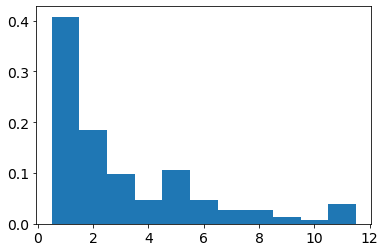

In [10]:
plt.hist(nclass,bins=np.arange(0.5,12.5,1),density=True)
plt.show()

In [11]:
#plot 3 per example, sorted according to how monotonic they are

kufactors=np.array([0.1,0.5,2.5,10])
allkufactors=np.logspace(-1,1,50)
msizes=[120,75,40,15]

44-1 0


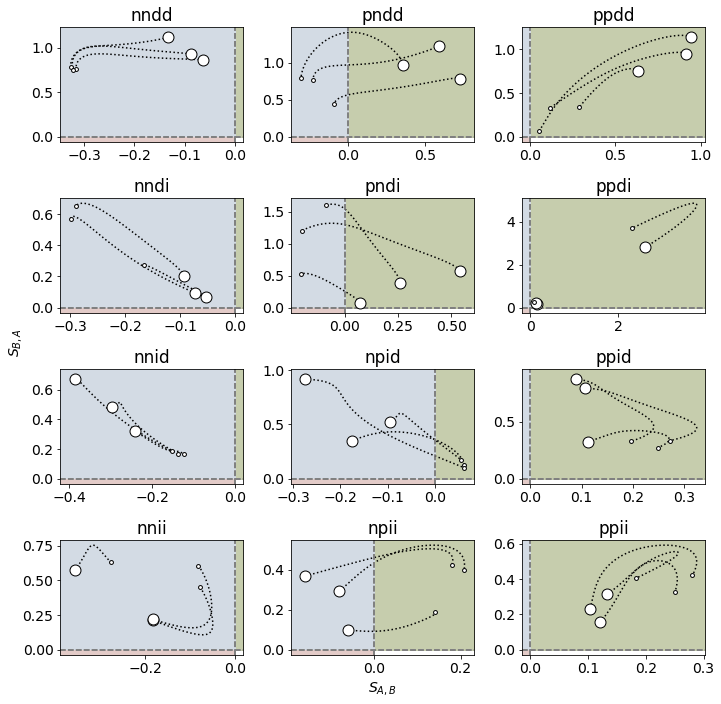

In [14]:
id_="44-1"
subset=df[df["id"]=="44-1"]
if True:
#for basalset in df.groupby(["id","npt1"]):
    #id_,npt1=basalset[0]
    #subset=basalset[1]
    classes=subset["class"].unique()
    if len(list(cset.intersection(classes)))==12:
        print(id_,npt1)
        fig,axes=plt.subplots(4,3,figsize=(10,10))
        for class_ in potential_classes:
        #for classdf in subset.groupby("class"):
            #class_=classdf[0]
            df_=subset[subset["class"]==class_]
            #if class_ in potential_classes:
            nplottedm=0
            nplottednm=0
            cl=potential_classes.index(class_)
            ax=axes[cl//3][cl%3]
            

            ax.set_title(class_)
            subset2=subset[subset["class"]==class_]

            #if len(subset)>20:
            #    subset=subset.sample(n=10,random_state=1)
            all_synergies=[]
            all_fullpars=[]
            breakpoints=[]
            for row in np.arange(len(subset2)):

                #(range(len(subset2)),size=len(subset2),replace=False):
                #if nplottedm<3 or nplottednm<3:
                fullpars=subset2.iloc[row].values[3:3+24]
                #print(len(fullpars))

                synergies=[]
                cont=True
                for i in range(len(allkufactors)):
                    parset2=fullpars.copy()
                    parset2[[13,15,17,19,21,23]]=parset2[[13,15,17,19,21,23]]*allkufactors[i]
                    #print(parset2)
                    syn0=compute_synergyb(parset2,PolAB_A_allpars.interface_GRF_PolAB_A_A,fcind=5,fcpair=5)
                    if syn0[0]==None:
                        cont=False
                        break
                    else:
                        synergies.append(syn0)
                if cont:
                    all_synergies.append([row,synergies])
                    all_fullpars.append(fullpars)
                    synar=np.array(synergies)
                    sab=synar[:,0]
                    #sba=synar[:,1]
                    dif=np.diff(sab)
                    sign=np.sign(dif)
                    uc=np.unique(sign)
                    if len(uc)==1:
                        breakpoints.append(len(sab))
                    else:
                        breakpoints.append(np.where(np.diff(sign)!=0)[0][0])
            argsort=np.argsort(breakpoints)
            for row in argsort[::-1]:
                synergies=all_synergies[row][1]
                fullpars=all_fullpars[row]

                synab=np.array([x[0] for x in synergies]) 
                synba=np.array([x[1] for x in synergies])
                difab=np.sign(np.diff(synab))
                difba=np.sign(np.diff(synba))
                if len(np.unique(difab)==1) and len(np.unique(difba)==1):
                    if nplottedm<3:
                        ax.plot(synab,synba,linestyle=":",color="k")
                        ax.axvline(x=0,color='grey',linestyle="--")
                        ax.axhline(y=0,color='grey',linestyle="--")
                        for i in [0,len(kufactors)-1]:
                            parset2=fullpars.copy()
                            #print(kufactors[i])
                            parset2[[13,15,17,19,21,23]]=parset2[[13,15,17,19,21,23]]*kufactors[i]
                            #print(parset2)
                            synabs,synbas,m=compute_synergyb(parset2,PolAB_A_allpars.interface_GRF_PolAB_A_A,fcind=5,fcpair=5,returnm=True)
                            ax.scatter(synabs,synbas,facecolor="white",edgecolor="k",s=msizes[i],zorder=3)

                        nplottedm+=1
                else:
                    if nplottem<3:
                        ax.plot(synab,synba,linestyle=":",color="k",zorder=3)
                        ax.axvline(x=0,color='grey',linestyle="--")
                        ax.axhline(y=0,color='grey',linestyle="--")
                        for i in range(len(kufactors)):
                            parset2=fullpars.copy()
                            #print(kufactors[i])
                            parset2[[13,15,17,19,21,23]]=parset2[[13,15,17,19,21,23]]*kufactors[i]
                            #print(parset2)
                            synabs,synbas,m=compute_synergyb(parset2,PolAB_A_allpars.interface_GRF_PolAB_A_A,fcind=5,fcpair=5,returnm=True)
                            ax.scatter(synabs,synbas,facecolor="white",edgecolor="k",s=msizes[i],zorder=3)

                        nplottednm+=1
            ax=tint_ax(ax)
        ax=axes[3,1]
        ax.set_xlabel("$S_{A,B}$")
        #ax.set_ylabel("$S_{B,A}$")
        fig.text(0,0.5,"$S_{B,A}$",rotation=90)
        plt.tight_layout()
        #plt.savefig("figs/Fig4suppl1_%s.pdf"%id_,bbox_inches="tight")
        plt.show()

                
        
    
    

In [15]:
import matplotlib as mpl
mpl.rcParams["font.size"]=16

**starting class pndi
['44-1', 2812]
**starting class npid
['65-1', 4957]
**starting class npii
['49-0', 23234]
**starting class ppii
['49-0', 5640]


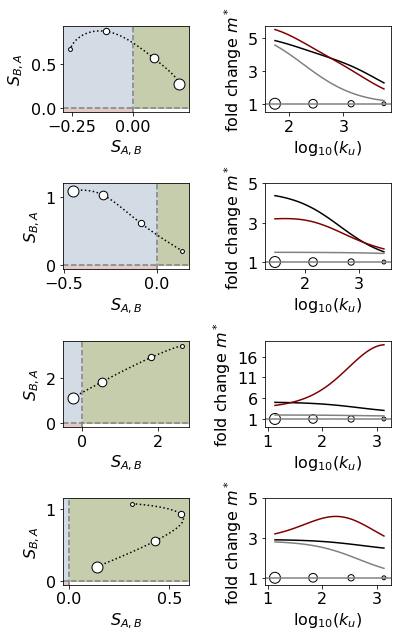

In [16]:
#Now select examples
fontsize=16
np.random.seed(3)
selected=[["44-1",2812],["65-1",4957],["49-0",23234],["49-0",5640]]
#classes_signs=[["ppii",[1,1]],["npii",[1,1]],["npid",[1,-1]],["pndi",[-1,1]],["ppdd",[-1,-1]],["ppdi",[-1,1]]]
classes_signs=[["pndi",[-1,1]],["npid",[1,-1]],["npii",[1,1]],["ppii",[1,1]]]
fig,axes=plt.subplots(4,2,figsize=(6,9))
for cs in range(len(classes_signs)):
    class_,signst=classes_signs[cs]
    item=selected[cs]
    print("**starting class",class_)
    print(item)

    #class_="ppdi"

    subset=df[df["class"]==class_]
    row=subset.iloc[item[1]]
    #print(row)
    
    nplottedm=0
    nplottednm=0
    fullpars=row.values[3:3+24]
    synergiesab=[]
    synergiesba=[]
    mlist=[]
    cont=True
    allkus=[]
    for i in range(len(allkufactors)):
        parset2=fullpars.copy()
        parset2[[13,15,17,19,21,23]]=parset2[[13,15,17,19,21,23]]*allkufactors[i]
        allkus.append(parset2[13])
        #print(parset2)
        out=compute_synergyb(parset2,PolAB_A_allpars.interface_GRF_PolAB_A_A,fcind=5,fcpair=5,returnm=True)
        if out[0]==None:
            cont=False
            break
        else:
            synab,synba,m=out
            synergiesab.append(synab)
            synergiesba.append(synba)
            mlist.append(m)
    if allkus[0]<10:
        cont=False
    if cont:
        executeplot=False
        synab=np.array(synergiesab)
        synba=np.array(synergiesba)
        difab=np.sign(np.diff(synab))
        difba=np.sign(np.diff(synba))
        
        ax=axes[cs,0]

        ax.plot(synab,synba,linestyle=":",color="k")
        kus=[]
        for i in range(len(kufactors)):
            parset2=fullpars.copy()
            #print(kufactors[i])
            parset2[[13,15,17,19,21,23]]=parset2[[13,15,17,19,21,23]]*kufactors[i]
            kus.append(parset2[13])
            #print(parset2)
            synabs,synbas,m=compute_synergyb(parset2,PolAB_A_allpars.interface_GRF_PolAB_A_A,fcind=5,fcpair=5,returnm=True)
            ax.scatter(synabs,synbas,facecolor="white",edgecolor="k",s=msizes[i],zorder=3)
        

        ax.axvline(x=0,color='grey',linestyle="--")
        ax.axhline(y=0,color='grey',linestyle="--")
        ax.set_xlabel("$S_{A,B}$")
        ax.set_ylabel("$S_{B,A}$")

        ax.tick_params(axis='both',labelsize=fontsize)
        ax=tint_ax(ax)

        ax=axes[cs,1]
        m0=np.array([m[0] for m in mlist])
        mA=np.array([m[1] for m in mlist])
        mB=np.array([m[2] for m in mlist])
        mAB=np.array([m[3] for m in mlist])
        mA=mA/m0
        mB=mB/m0
        mAB=mAB/m0

        ax.plot(np.log10(allkus),mA,color="k",label="2A")
        ax.plot(np.log10(allkus),mB,color="gray",label="2B")
        ax.plot(np.log10(allkus),mAB,color="maroon",label="AB")

        ax.set_xlabel(r'log$_{10}$($k_u$)',fontsize=fontsize)
        ax.set_ylabel(r"fold change $m^*$",fontsize=fontsize)
        ax.tick_params(axis='both',labelsize=fontsize)
        #ax.legend(loc='lower left',bbox_to_anchor=(0,1),ncol=3)
        ax.axhline(y=1,color='grey')
        ax.scatter(np.log10(kus),[1]*len(kufactors),s=msizes,edgecolors='k',facecolors='white')
        #ax.set_xticks(np.log10(kus))
        #ax.set_xticklabels(["%2.1f"%np.log10(kus))
        ymax=ax.get_ylim()[1]
        if ymax<7:
            ax.set_yticks(np.arange(1,ymax+1,2))
        else:
            ax.set_yticks(np.arange(1,20,5))
    
plt.tight_layout()
fig.subplots_adjust(left=0.2, wspace=0.6)
#plt.savefig("figs/Fig4modelselected.pdf",bbox_inches="tight")
plt.show()

            #makeplot(fullpars)


**starting class ppii
ppii 86-0 6201 3767


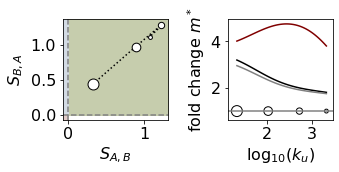

[6.462905630357634 6.735539947925498 4.078974339377941 1043.2088100950348]
[3801.409127240962 12.258381984848688 1.771616956006403 2186.7652400303614]
[11.18511051979809 4439.175415876084 2.2269418279542808 7174.460319130561]
28.500569059000274 212.8942481410222


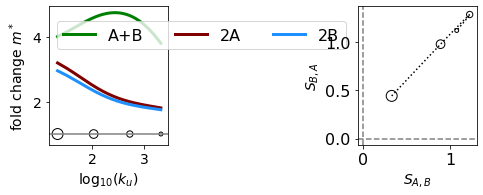

//anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):
//anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:585: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  and cb.iterable(edge_color) \
//anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:595: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]):
//anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:676: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if cb.iterable(node_size):  # many node sizes
//anaconda3/li

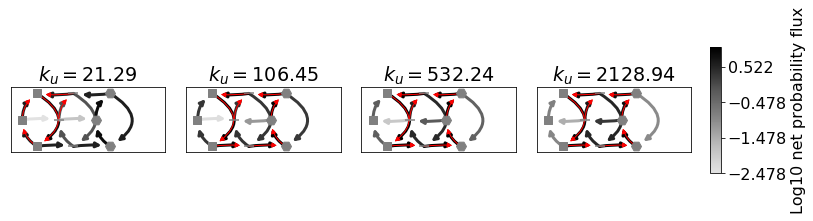

ppii 49-0 7672 5640


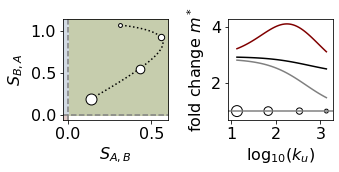

[15.99034461145826 9.733013546865411 5073.884071872861 3684.798578758336]
[3115.602876563645 11.699508871033323 32.16642474227129 7586.611490041857]
[16.182198253410036 38.9986561370595 34.02638284085205 5369.172301959576]
232.56990739697784 136.0721725943998


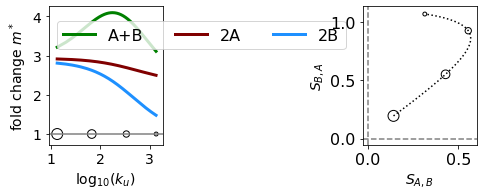

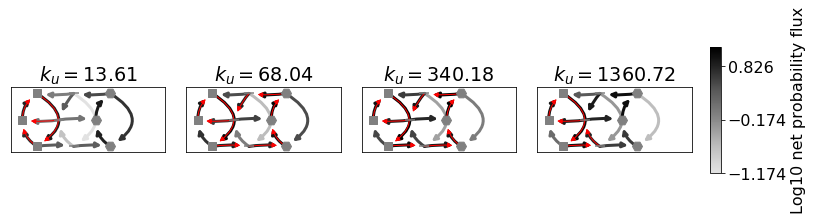

ppii 86-0 4421 3685


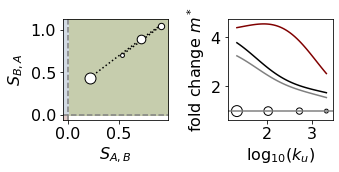

[6.462905630357634 6.735539947925498 4.078974339377941 1043.2088100950348]
[1877.546825255165 15.150640138911841 1.8757288770814249
 1060.4739759157949]
[12.743321883649086 808.7530688448718 2.7897253280431755 6783.924869773385]
28.500569059000274 212.8942481410222


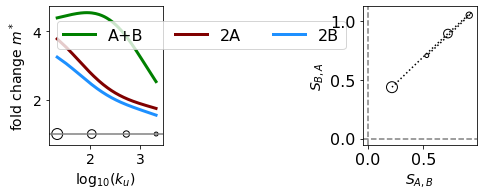

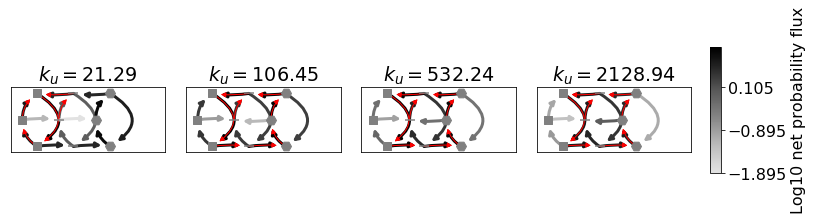

ppii 86-0 6752 3791


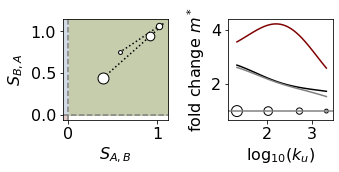

[6.462905630357634 6.735539947925498 4.078974339377941 1043.2088100950348]
[10.054690817468831 3852.4493235922278 2.49005725563232 4041.174978413649]
[654.4276616727833 9.73125236780044 1.9590684122551052 4586.988767704241]
28.500569059000274 212.8942481410222


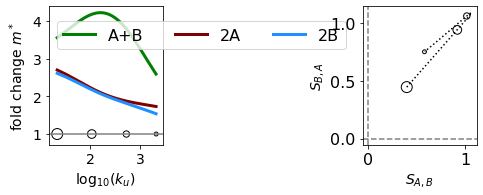

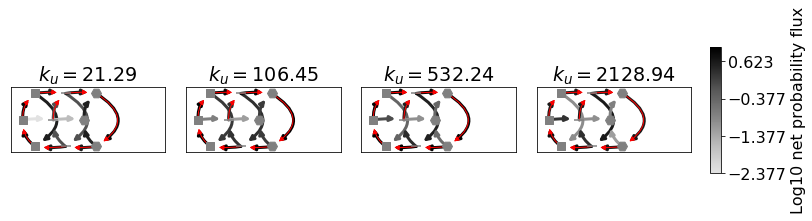

ppii 3-0 7681 111


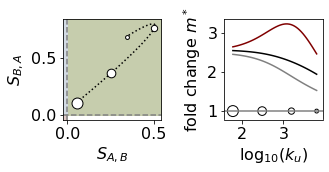

[159.6583402894029 680.1289958688553 14.575348768947391 110.48680645941988]
[159.94627230856312 2917.907444134272 6.3230959943856035
 4024.7306271833754]
[3480.217802393974 1163.2108059173206 3.065417638214719 170.0236653341822]
610.792799614582 620.2777143105826


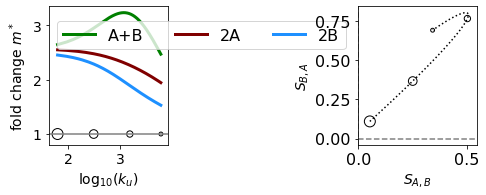

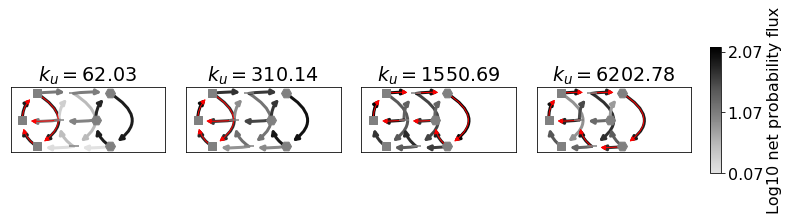

ppii 49-0 4350 5253


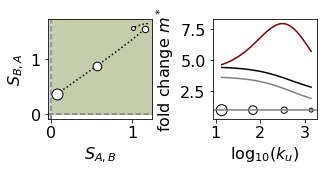

[15.99034461145826 9.733013546865411 5073.884071872861 3684.798578758336]
[1799.116802759279 18.091609361557477 154.48678504691856 4565.637302947973]
[16.959549022720818 174.93432694521428 566.1629681795101 9839.363960784303]
232.56990739697784 136.0721725943998


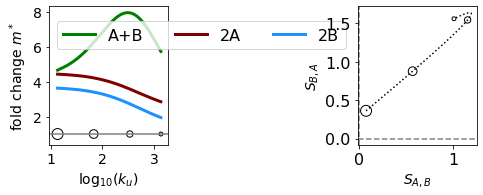

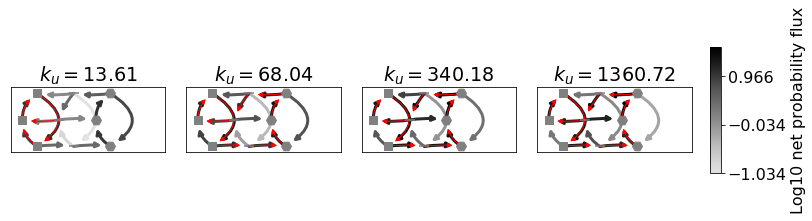

ppii 86-0 3763 3658


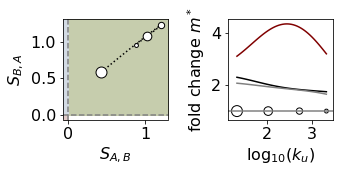

[6.462905630357634 6.735539947925498 4.078974339377941 1043.2088100950348]
[8.2712408819251 6634.316580125445 1.6894865919857924 1363.04130356756]
[1321.9446029132816 7.184900951683711 1.2602470994978745
 1179.0633067521526]
28.500569059000274 212.8942481410222


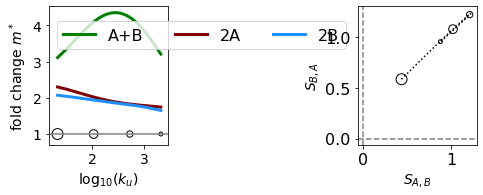

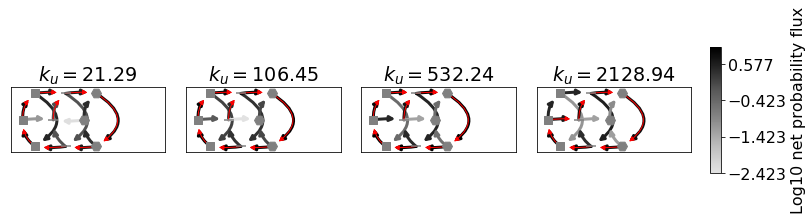

ppii 69-2 15275 1235


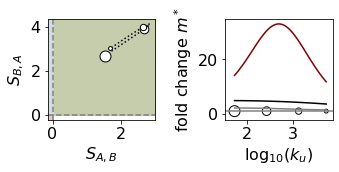

[223.81883242855736 1.271087335505975 31.385270306349195 4.425961026522288]
[507.932807619114 170.88715716110482 1.5015425656411108 4.897038296905555]
[961.9480195676582 2.122450610380066 2.7093988194244853 2384.670836796026]
444.4975833929587 541.1060349732925


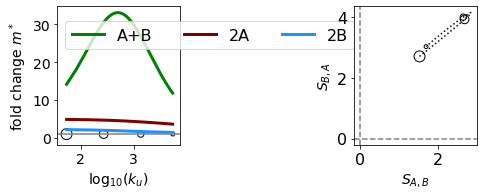

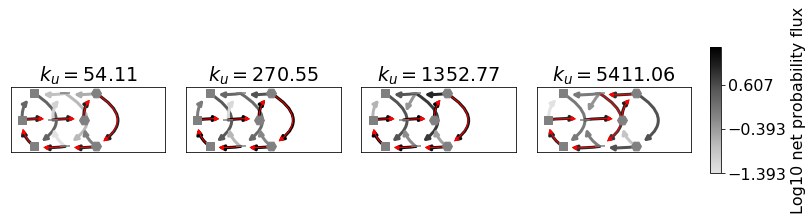

ppii 86-0 4513 3690


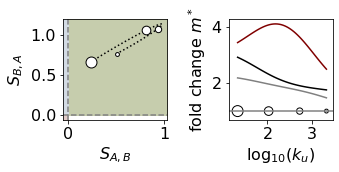

[6.462905630357634 6.735539947925498 4.078974339377941 1043.2088100950348]
[11.138858289663489 5684.043664094861 3.4026568035123503 1843.976610994198]
[513.0470699845405 7.798808019060265 2.340381864969041 2873.252817895388]
28.500569059000274 212.8942481410222


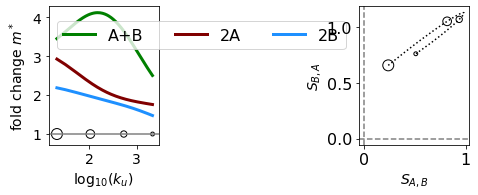

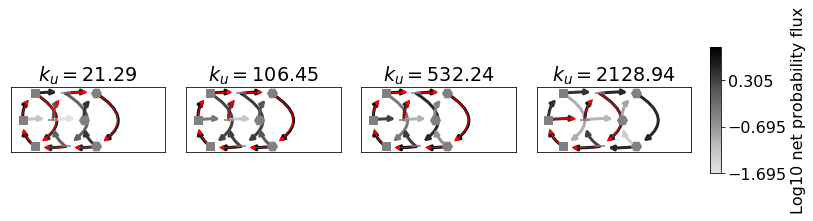

ppii 69-2 20475 1303


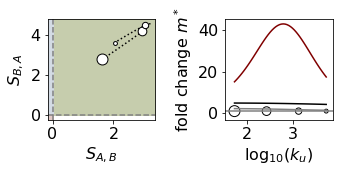

[223.81883242855736 1.271087335505975 31.385270306349195 4.425961026522288]
[3036.31331039528 811.3920112258804 24.77842653190919 4.7708925387661205]
[547.7965020149942 2.1730558335353023 12.990937840240194
 354.99642897859803]
444.4975833929587 541.1060349732925


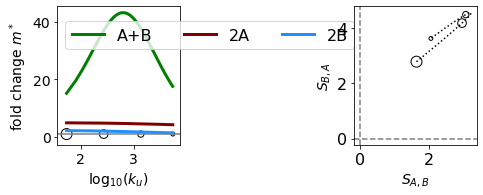

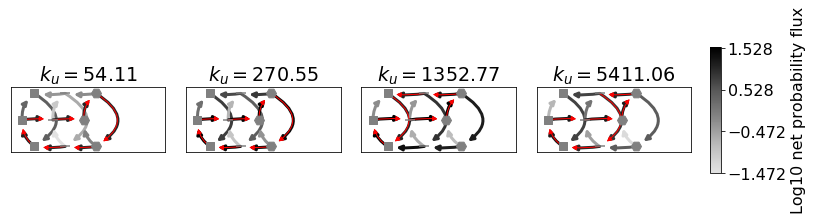

ppii 49-0 6217 5486


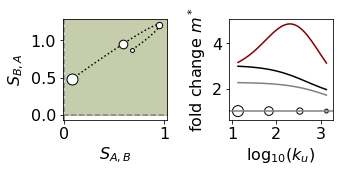

[15.99034461145826 9.733013546865411 5073.884071872861 3684.798578758336]
[21.413903217389915 901.4242196220747 4172.4501516703585 5552.835901758453]
[106.81327948831185 10.428789700264566 3966.038894096648
 7045.0756924498055]
232.56990739697784 136.0721725943998


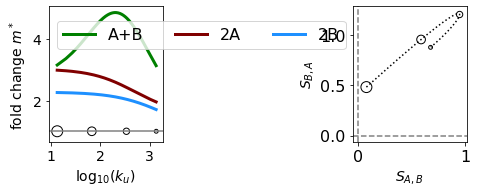

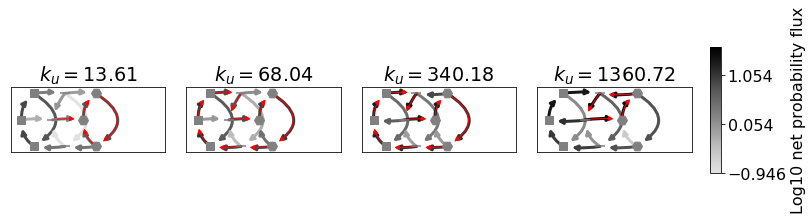

ppii 69-2 22716 1340


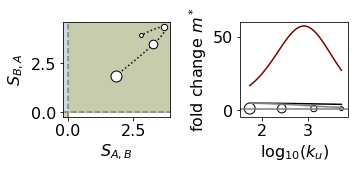

[223.81883242855736 1.271087335505975 31.385270306349195 4.425961026522288]
[301.1782052934821 469.559185745873 1.9459341496544595 4.64993821318991]
[6699.78450782469 4.6278176531793855 4.283674174234509 3739.230849151514]
444.4975833929587 541.1060349732925


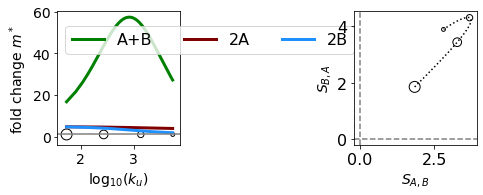

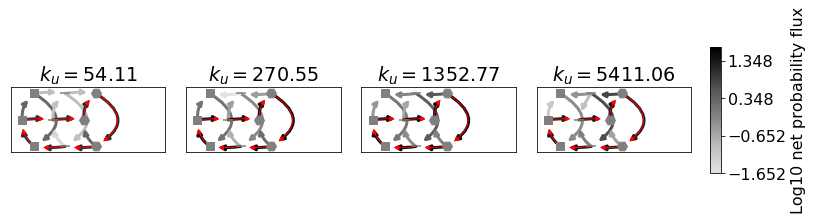

ppii 49-0 6461 5509


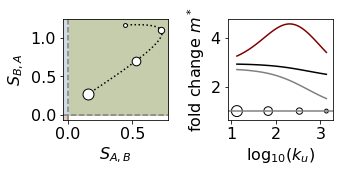

[15.99034461145826 9.733013546865411 5073.884071872861 3684.798578758336]
[4334.500370804601 11.713170021590454 851.5583562868692 6089.137852058965]
[19.05042902760046 50.38309911137278 3526.1982141317635 9549.972611275341]
232.56990739697784 136.0721725943998


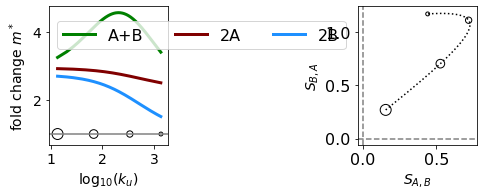

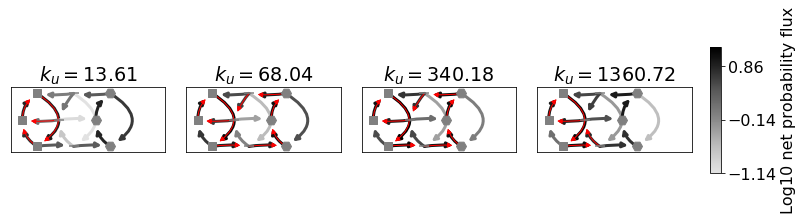

ppii 20-3 22918 20


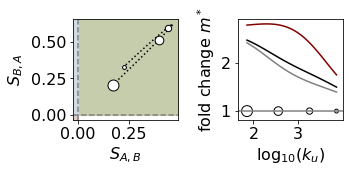

[375.3718540626825 55.013723540374244 7.6666940884719725
 42.497489962864755]
[1471.2583693318359 64.39735744733058 1.0250070279910302
 3572.6512168147137]
[5782.193834550153 6011.922789190636 3.3427166487772797 62.60162610981183]
98.12751898457708 716.2234686391505


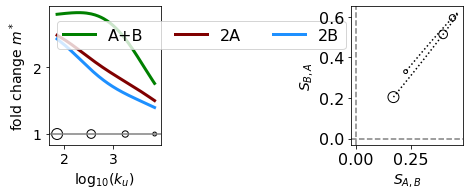

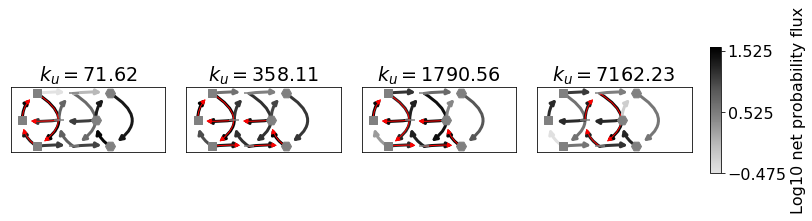

ppii 49-0 1169 4901


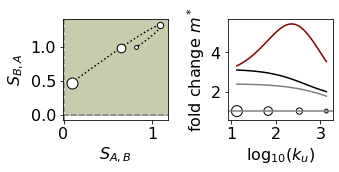

[15.99034461145826 9.733013546865411 5073.884071872861 3684.798578758336]
[16.30262959132457 2962.928087044961 1209.8544633098488 4099.0643929605785]
[82.85425830370507 10.766407907553186 29.896920207984568 5729.343602252254]
232.56990739697784 136.0721725943998


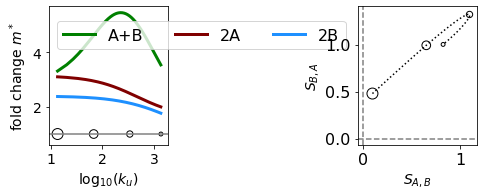

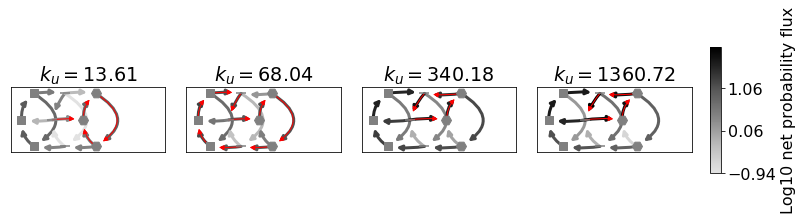

ppii 49-0 8289 5706


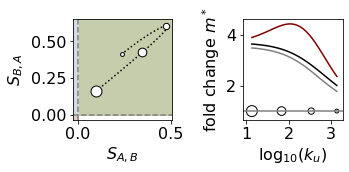

[15.99034461145826 9.733013546865411 5073.884071872861 3684.798578758336]
[90.84223316139685 17.701309643997075 89.39829006653042 5280.674516423787]
[21.98281850801558 97.63206974813512 1737.2277266561637 5363.672335143042]
232.56990739697784 136.0721725943998


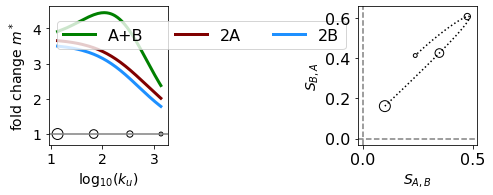

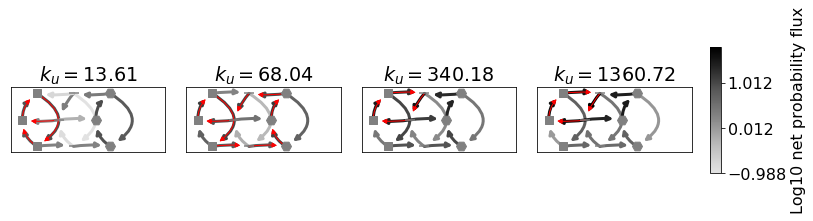

ppii 49-0 2186 5015


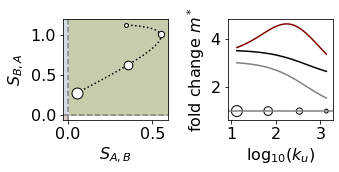

[15.99034461145826 9.733013546865411 5073.884071872861 3684.798578758336]
[5682.276801696942 14.18822639519387 4782.775038453936 7592.827254008614]
[21.38935394625236 46.317916133484275 1314.1223031816933 4585.664640162]
232.56990739697784 136.0721725943998


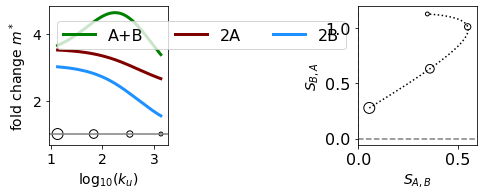

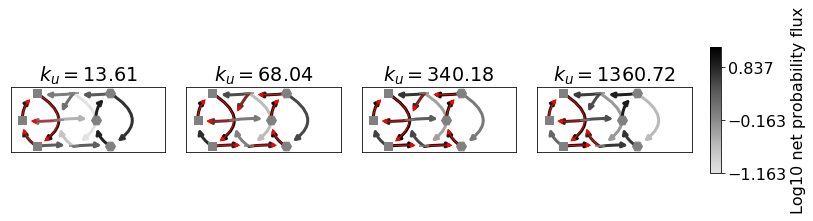

ppii 86-0 8127 3854


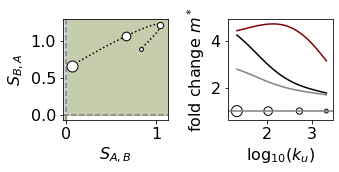

[6.462905630357634 6.735539947925498 4.078974339377941 1043.2088100950348]
[1966.9225601895926 17.113584736352742 2.4141201894710984
 3913.065628093592]
[10.467773109948967 2362.656816538697 1.19222426005905 5881.583175650854]
28.500569059000274 212.8942481410222


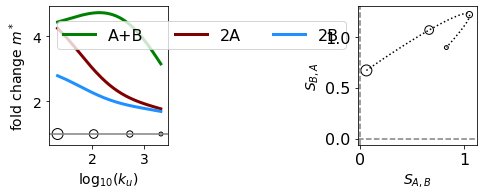

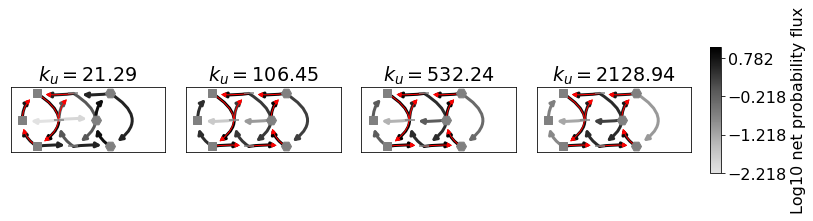

ppii 86-0 8121 3852


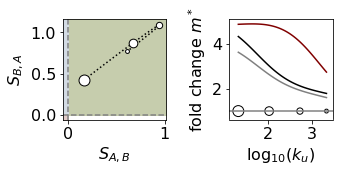

[6.462905630357634 6.735539947925498 4.078974339377941 1043.2088100950348]
[2163.205835447561 17.460466475171632 2.325775185662652 5896.799422759916]
[14.454112884933341 1030.6141720245394 1.062871965925673
 5437.0206187000185]
28.500569059000274 212.8942481410222


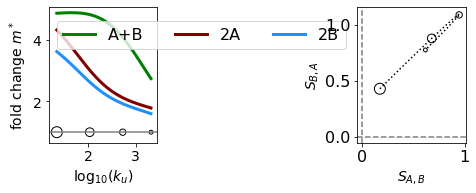

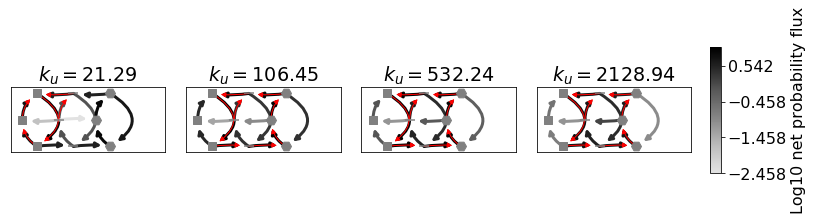

ppii 86-0 7730 3834


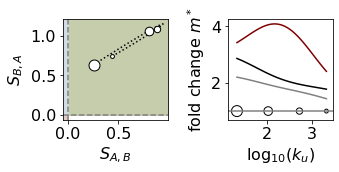

[6.462905630357634 6.735539947925498 4.078974339377941 1043.2088100950348]
[2952.3933653461504 10.720699675234828 1.7440370844897235
 4314.934140746585]
[7.976380584769221 518.3934551726676 1.1646544867016693 1646.8051994237485]
28.500569059000274 212.8942481410222


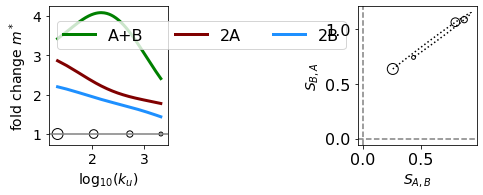

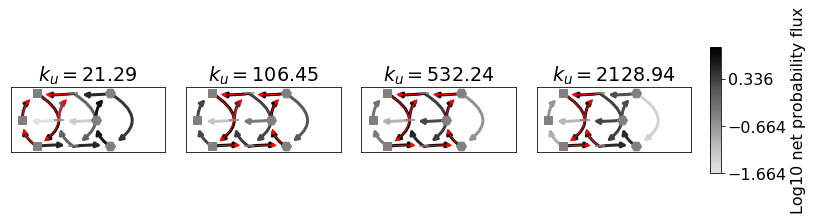

ppii 49-0 6697 5541


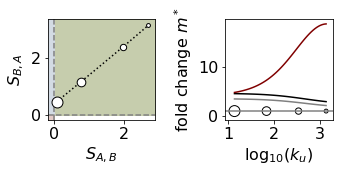

[15.99034461145826 9.733013546865411 5073.884071872861 3684.798578758336]
[5996.006435461991 18.58489660917846 21.285791468712173 6171.047080151746]
[18.74767141954955 9385.707017901948 2689.9050945983745 8231.801543398551]
232.56990739697784 136.0721725943998


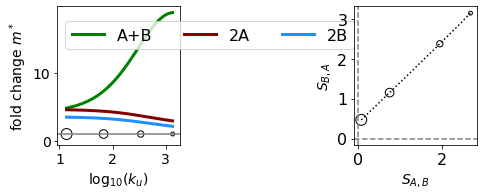

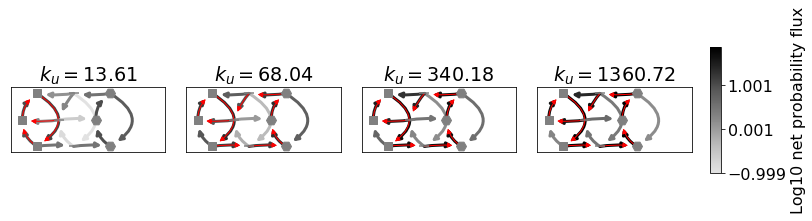

ppii 49-0 2037 4997


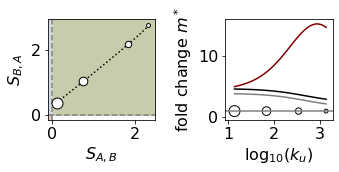

[15.99034461145826 9.733013546865411 5073.884071872861 3684.798578758336]
[4752.133947312763 18.64635171980461 9.488582239405408 6326.553364885094]
[16.239173442698547 1525.3499154580445 232.45192050963038
 6450.130173890721]
232.56990739697784 136.0721725943998


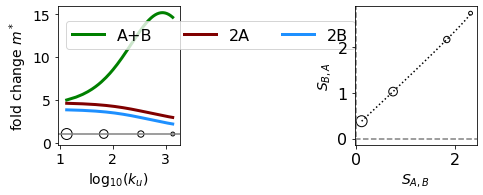

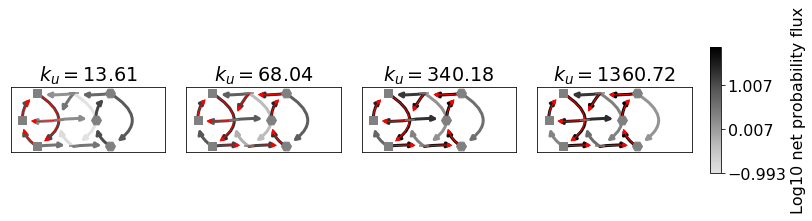

ppii 49-0 2016 4994


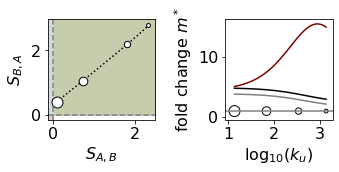

[15.99034461145826 9.733013546865411 5073.884071872861 3684.798578758336]
[2968.2059589690057 19.426938283899837 2084.798557543191 7734.257754165048]
[19.55841386884831 2515.8574380009068 1064.29835921491 4072.334718148935]
232.56990739697784 136.0721725943998


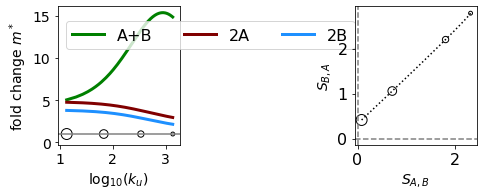

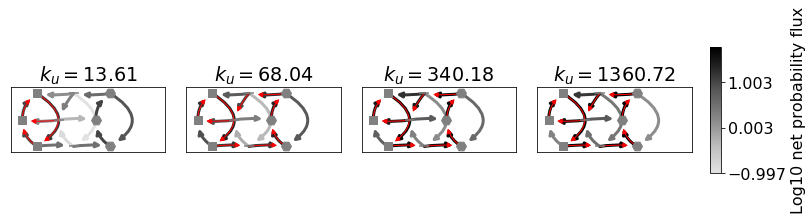

ppii 49-0 3798 5182


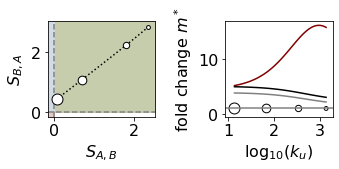

[15.99034461145826 9.733013546865411 5073.884071872861 3684.798578758336]
[3812.518632488821 20.03678781330687 122.64099924969648 6938.593686960386]
[25.423472985102315 2344.212370211404 2529.6895188904637
 3961.4972603728943]
232.56990739697784 136.0721725943998


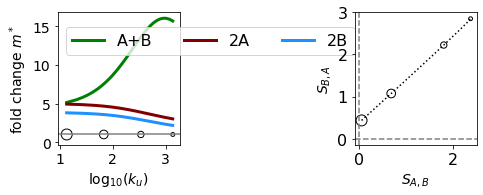

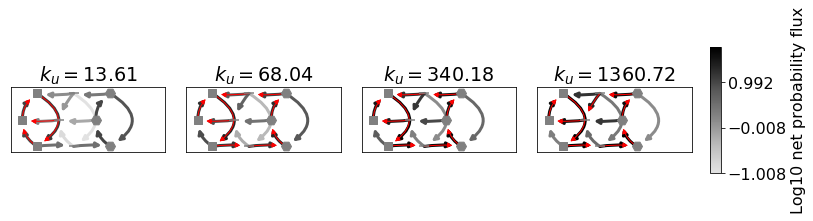

ppii 49-0 3740 5175


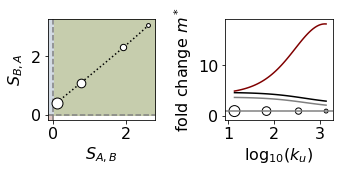

[15.99034461145826 9.733013546865411 5073.884071872861 3684.798578758336]
[8086.614009000766 18.7642573703194 217.33558572120225 9916.145193247154]
[28.33381915419678 3703.8798776685107 3878.819012484152 4386.5127369223355]
232.56990739697784 136.0721725943998


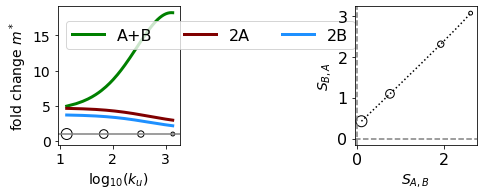

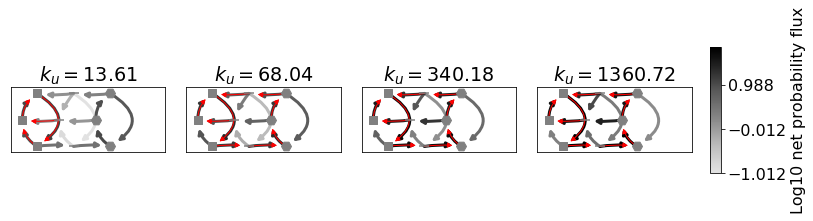

ppii 49-0 4538 5284


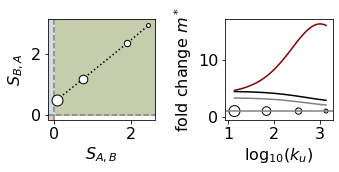

[15.99034461145826 9.733013546865411 5073.884071872861 3684.798578758336]
[3535.2974309252904 17.917855063977612 35.967894554768094
 8025.481821721045]
[18.663025857512626 2790.286393433932 2158.1893263068346
 5428.7151350410695]
232.56990739697784 136.0721725943998


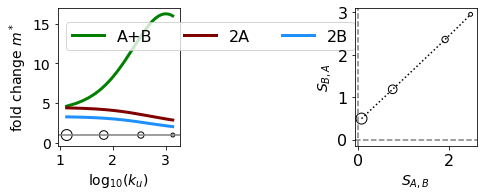

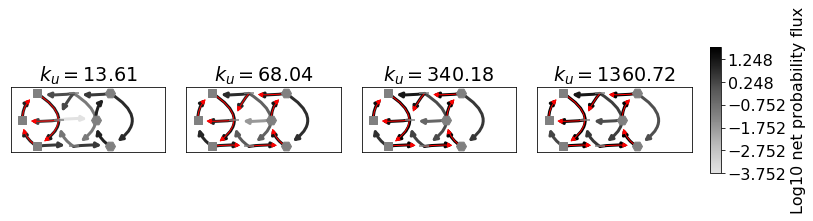

ppii 49-0 7803 5648


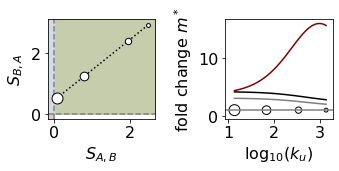

[15.99034461145826 9.733013546865411 5073.884071872861 3684.798578758336]
[1945.6101073683758 16.775486651212276 97.56056721922484 7639.585025761649]
[19.249450537706515 6493.866255324077 4886.113703607442 8522.07122955307]
232.56990739697784 136.0721725943998


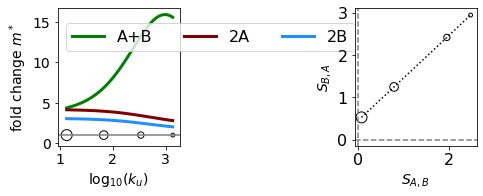

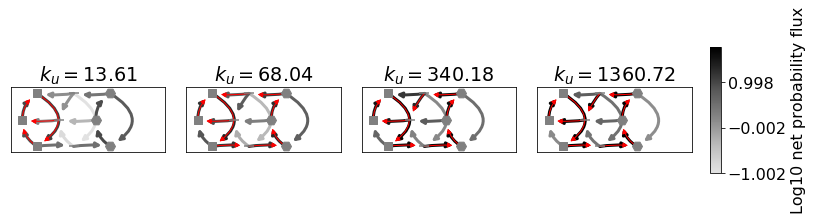

ppii 49-0 4508 5275


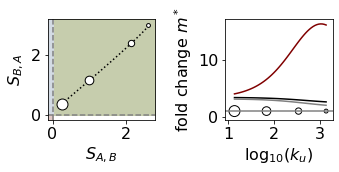

[15.99034461145826 9.733013546865411 5073.884071872861 3684.798578758336]
[3079.2723481255907 13.600740281001054 265.76835431546414
 9436.434615930955]
[26.02382991043973 3580.919796232288 4024.5894960047694 3773.2890460045282]
232.56990739697784 136.0721725943998


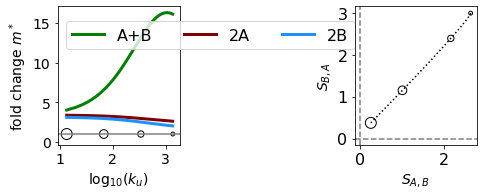

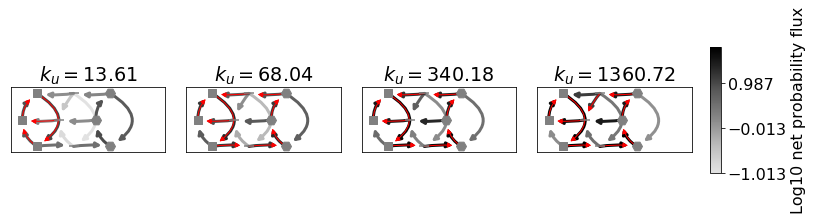

ppii 49-0 38 4767


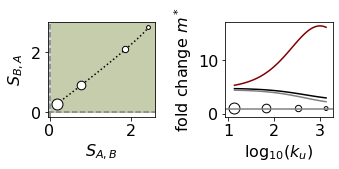

[15.99034461145826 9.733013546865411 5073.884071872861 3684.798578758336]
[8452.996215457166 19.12042212136336 13.873290922869773 5791.88965302493]
[18.565927497985452 1976.1283634697568 85.96836791873753
 4141.1122669363185]
232.56990739697784 136.0721725943998


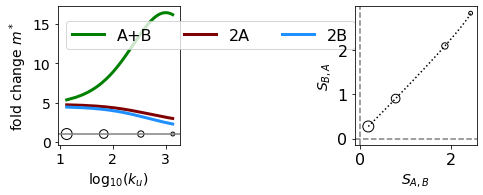

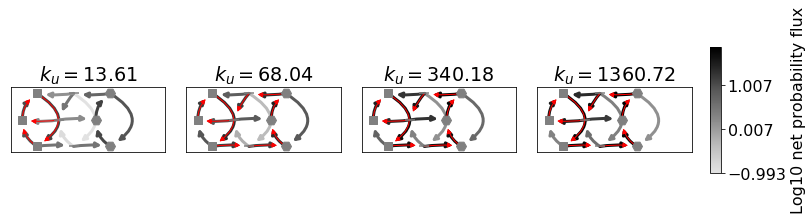

ppii 49-0 4275 5241


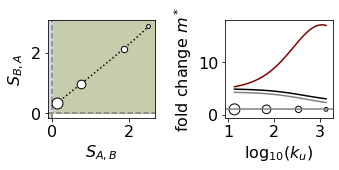

[15.99034461145826 9.733013546865411 5073.884071872861 3684.798578758336]
[9625.41304725984 19.75744164251136 19.1679442081386 6157.8618584411915]
[17.44683155885921 2471.2609147624867 20.882245503778453 9466.751069548976]
232.56990739697784 136.0721725943998


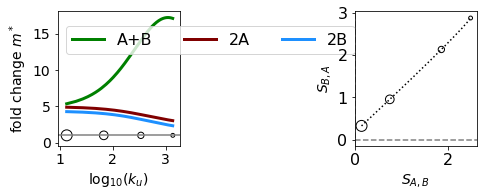

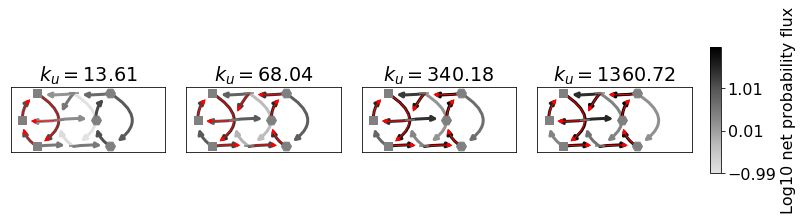

ppii 49-0 549 4825


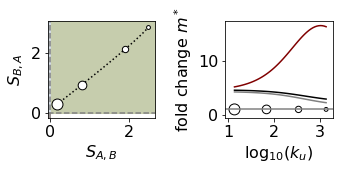

[15.99034461145826 9.733013546865411 5073.884071872861 3684.798578758336]
[6282.927109743528 18.564186292394226 2367.539031607777 3820.453003089122]
[17.363451274280234 3489.64290414094 6.100240144928641 4400.446886982588]
232.56990739697784 136.0721725943998


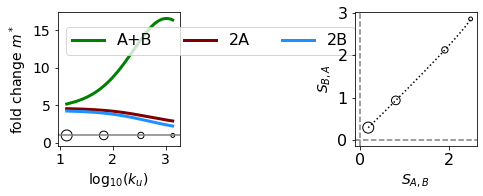

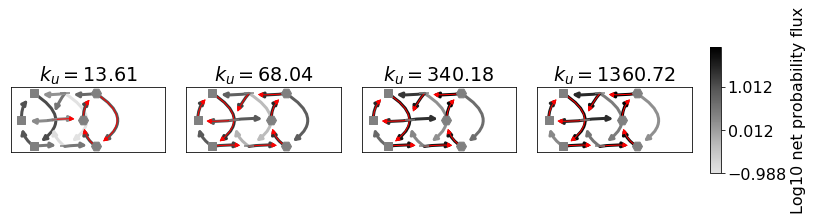

ppii 49-0 4968 5331


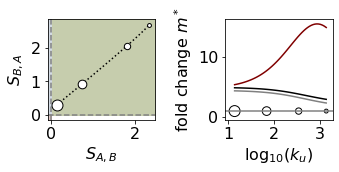

[15.99034461145826 9.733013546865411 5073.884071872861 3684.798578758336]
[1500.4388273318245 20.030832977292565 12.722399995470585
 8120.662834814639]
[17.831083573033634 7847.1685643456485 18.61906879249116 7921.32245920732]
232.56990739697784 136.0721725943998


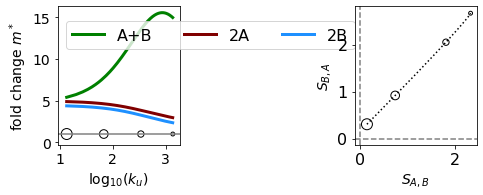

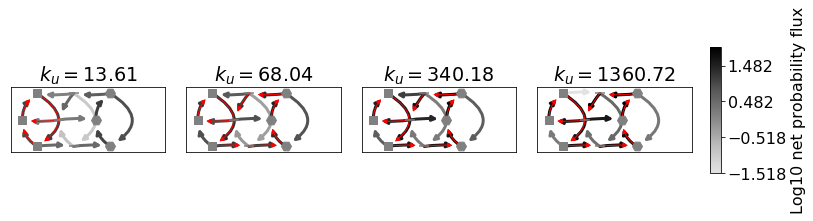

ppii 49-0 619 4837


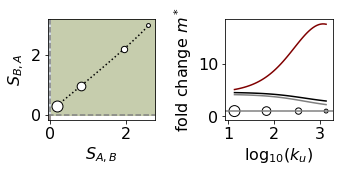

[15.99034461145826 9.733013546865411 5073.884071872861 3684.798578758336]
[5094.35227974286 18.34023744800844 399.36937039932855 6987.928774059408]
[16.90476128512232 4362.6538564908005 14.853657107711994 4836.797217322678]
232.56990739697784 136.0721725943998


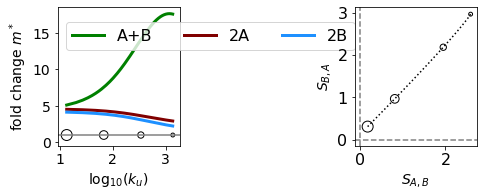

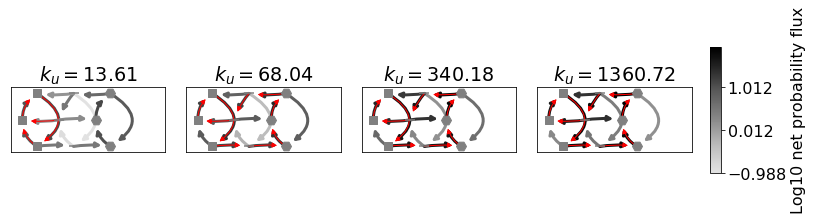

ppii 49-0 7100 5584


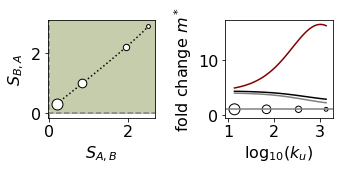

[15.99034461145826 9.733013546865411 5073.884071872861 3684.798578758336]
[2634.232434454043 17.443019841895563 8.736939947716646 9216.039492706375]
[16.22691878558363 4501.013539923585 41.39860347831945 4820.68856569005]
232.56990739697784 136.0721725943998


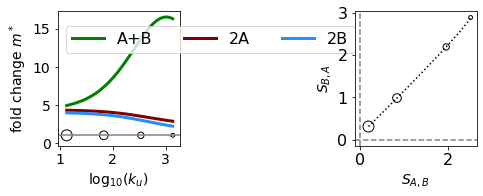

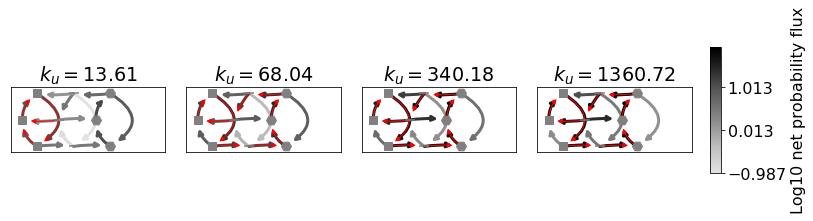

ppii 49-0 7605 5631


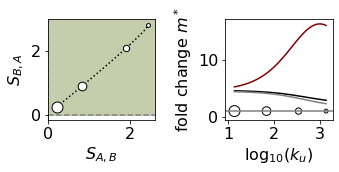

[15.99034461145826 9.733013546865411 5073.884071872861 3684.798578758336]
[4235.667463663381 18.560546173681907 4466.802910363903 5935.017813316988]
[18.48467235978452 4499.6417533512795 131.38202297057543 4676.651890121123]
232.56990739697784 136.0721725943998


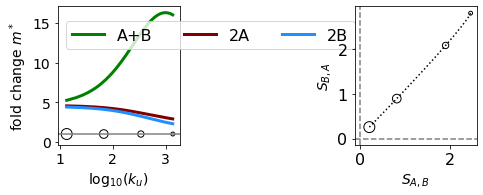

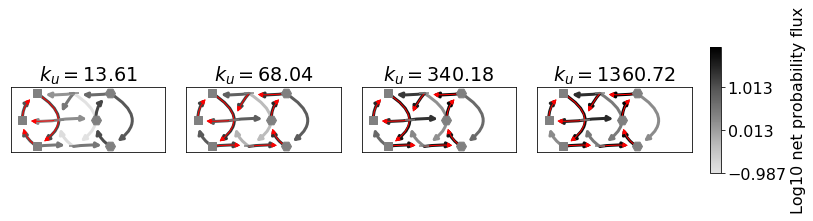

ppii 49-0 7469 5619


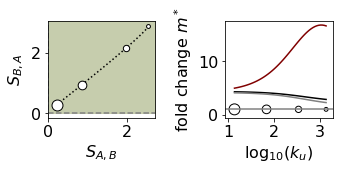

[15.99034461145826 9.733013546865411 5073.884071872861 3684.798578758336]
[6772.2142156014 17.403346130040354 34.71101907225093 4598.084839950906]
[20.91455740728255 2717.704063457144 1874.564890531392 7464.7811796838405]
232.56990739697784 136.0721725943998


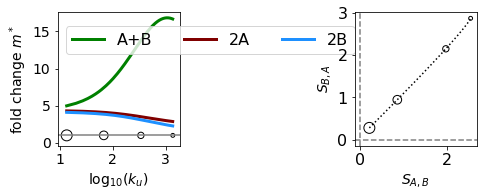

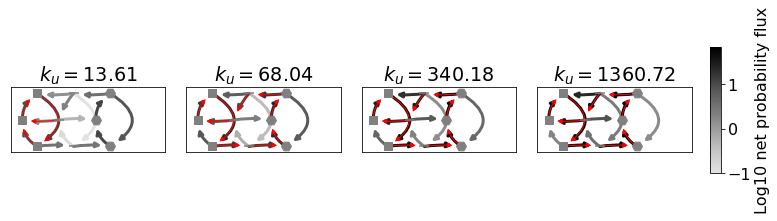

ppii 49-0 995 4888


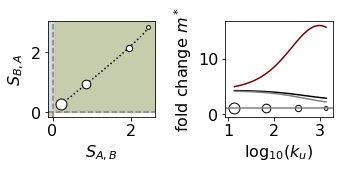

[15.99034461145826 9.733013546865411 5073.884071872861 3684.798578758336]
[8772.419865190908 17.089110550802086 2594.82192961926 7943.879382087631]
[17.009121885715473 1744.310678687042 28.821405381642922 3771.721600786615]
232.56990739697784 136.0721725943998


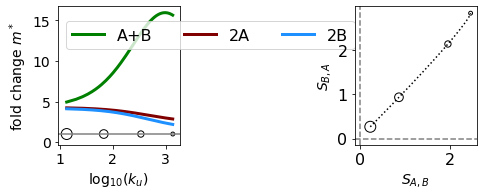

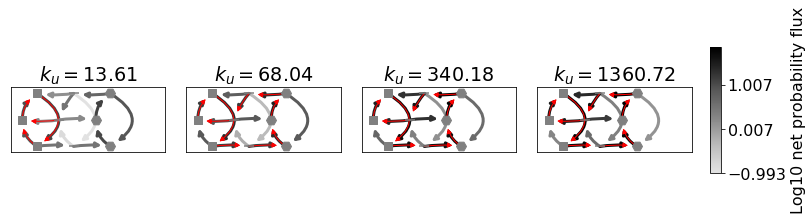

ppii 49-0 7134 5589


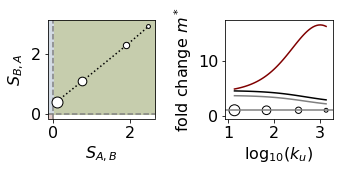

[15.99034461145826 9.733013546865411 5073.884071872861 3684.798578758336]
[2612.1361542976942 18.39134525271904 36.15511360271948 4291.526026423061]
[22.479632686784658 7427.6753779050705 3218.609923016353 6181.624999373979]
232.56990739697784 136.0721725943998


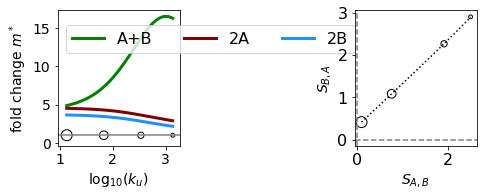

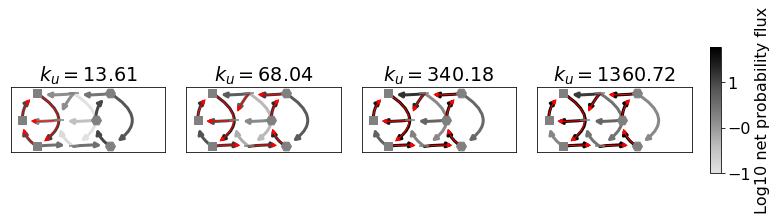

ppii 49-0 8322 5711


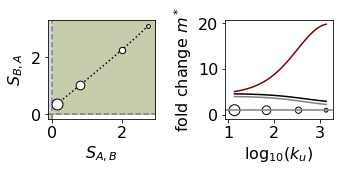

[15.99034461145826 9.733013546865411 5073.884071872861 3684.798578758336]
[8056.403240499631 18.45983261309551 197.60790985274258 9341.029998873697]
[17.292298341408053 9342.534077230091 545.2261397782406 7658.184469495855]
232.56990739697784 136.0721725943998


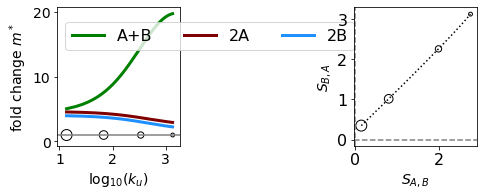

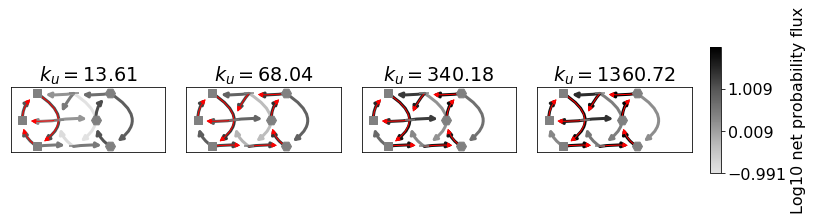

ppii 49-0 6561 5524


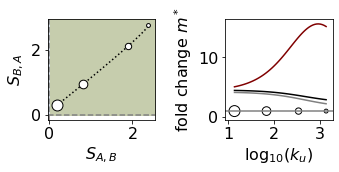

[15.99034461145826 9.733013546865411 5073.884071872861 3684.798578758336]
[6252.6233505818245 18.06920517382369 3936.9658571824148 8934.438840799838]
[21.54092048301041 1722.1788217036046 1206.6162440656133 4412.128713581538]
232.56990739697784 136.0721725943998


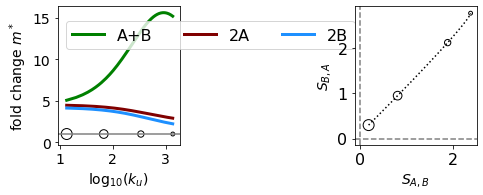

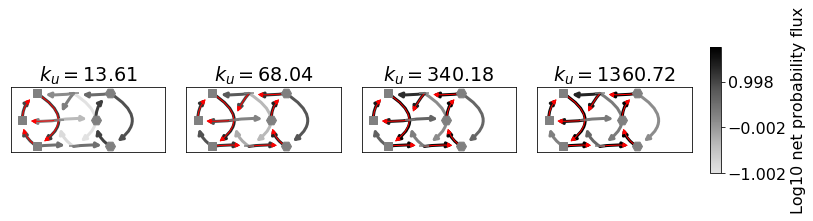

**starting class npii
npii 65-1 15021 25707


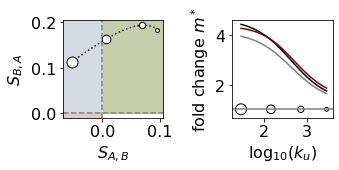

[12.35607549703114 1.3979302061719785 21.86755132210443 10.4312290289087]
[45.25647546541697 4.856462255769267 2.2195920467431383 3124.649871613862]
[1509.7321426226695 4.517892201929336 13.570775170386383 29.16907341230228]
210.9616868323976 286.2980802899199


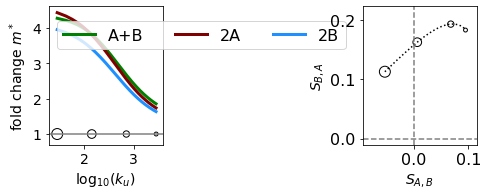

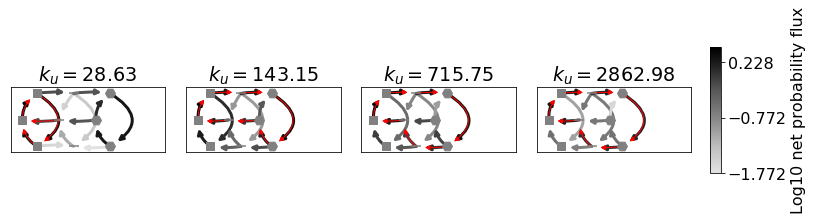

npii 49-0 7484 23364


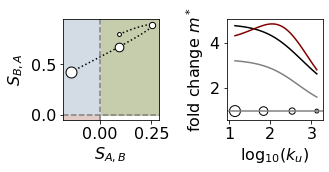

[15.99034461145826 9.733013546865411 5073.884071872861 3684.798578758336]
[273.49353447227435 20.706713530610834 337.5056916019352 8288.504094138403]
[17.594694433143594 52.96081587162132 162.20739549720165 7342.695538703141]
232.56990739697784 136.0721725943998


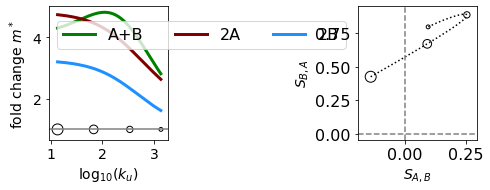

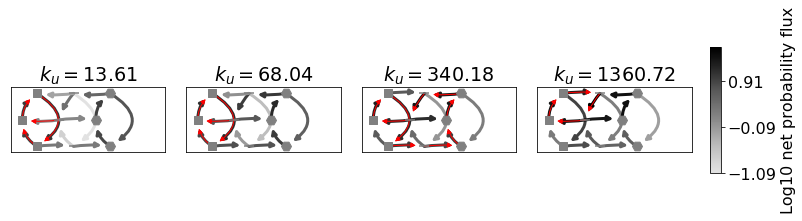

npii 49-0 3038 22964


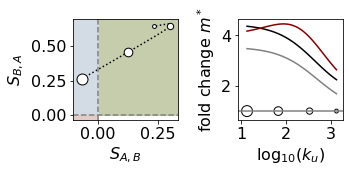

[15.99034461145826 9.733013546865411 5073.884071872861 3684.798578758336]
[17.972170129634485 2137.3880719112744 13.672326800752664
 3778.445733190083]
[35.930248188091326 23.413736339327173 116.44451786492844
 8660.849958170907]
232.56990739697784 136.0721725943998


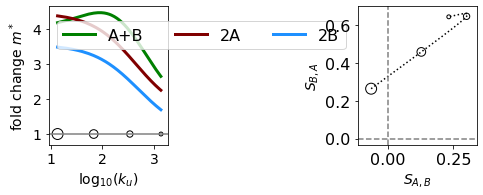

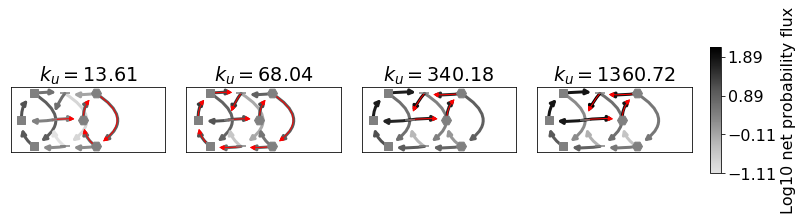

npii 49-0 2772 22939


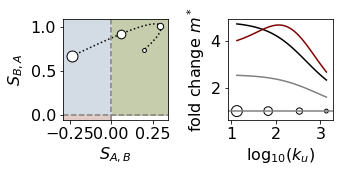

[15.99034461145826 9.733013546865411 5073.884071872861 3684.798578758336]
[22.786749324549323 500.17430439451243 1145.6158662079786
 7957.083616694468]
[45.8074759736233 13.059503384943941 14.962969396868033 7594.593270961671]
232.56990739697784 136.0721725943998


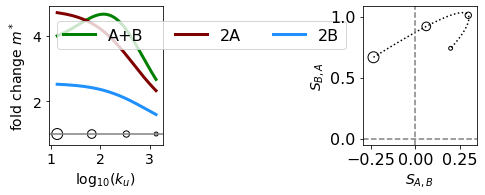

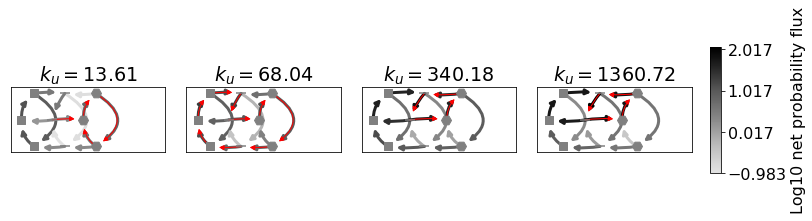

npii 57-1 14730 11278


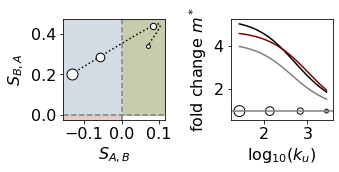

[1358.458335811412 77.08833696787266 2383.4238813899083 153.783432273482]
[2680.125237966372 199.67485118663654 535.4241565300929 1702.6587240837268]
[2028.4551195715064 1206.0386836850455 7.679428581409348 158.3639029180857]
229.4830751943937 275.95267337161494


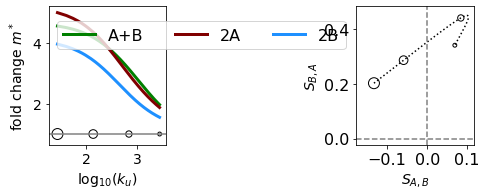

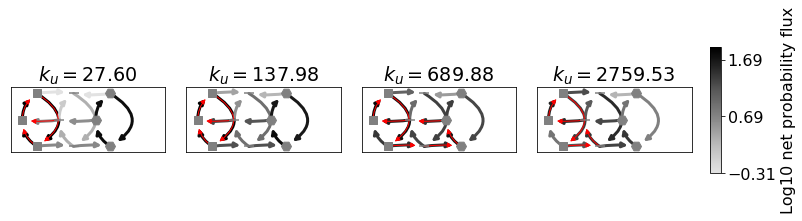

npii 3-0 4681 10580


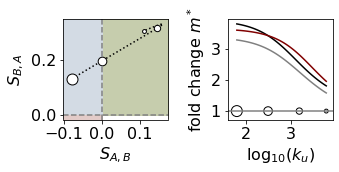

[159.6583402894029 680.1289958688553 14.575348768947391 110.48680645941988]
[6364.731403614291 1074.6255165319396 1.0279870516754537
 294.90224375170163]
[362.39340251127436 734.5179374321469 3.551384031477648 936.9902733263555]
610.792799614582 620.2777143105826


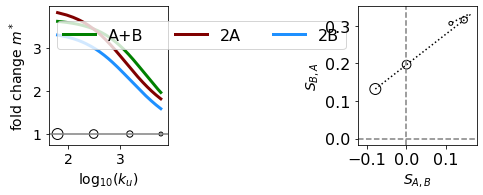

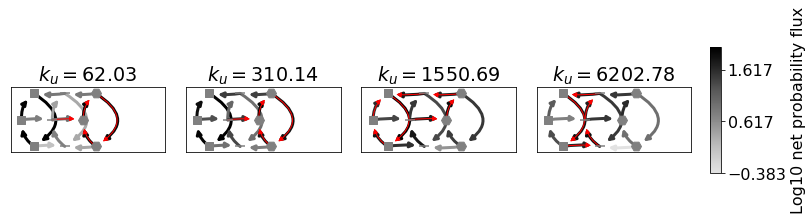

npii 0-4 34963 14815


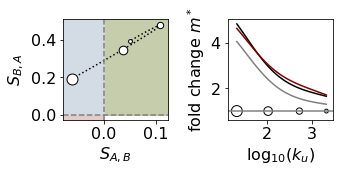

[21.252878538152878 13.205171636861243 22.89489579254537
 1060.2851680046958]
[55.3497427869378 3238.0630518383587 12.069846019288747 6474.672809158601]
[3483.3220461981878 46.98384529435366 22.57119420517675 6468.231122427739]
17.39281178354825 212.39575378694568


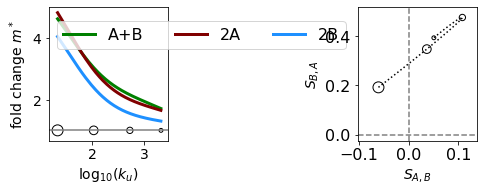

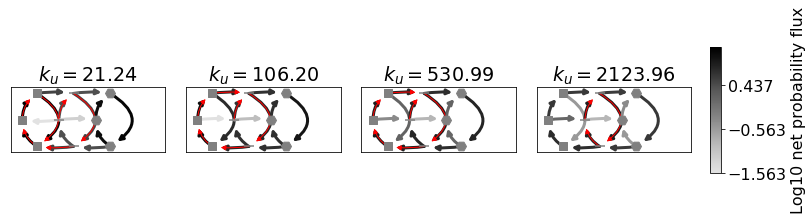

npii 3-0 4970 10605


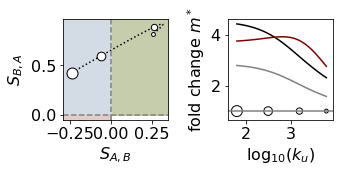

[159.6583402894029 680.1289958688553 14.575348768947391 110.48680645941988]
[283.9550482436976 7049.235861503523 1.0284394906339287 5242.011164652226]
[3308.0242179484108 1808.5399564364616 2.3867498081802423
 189.79282798671318]
610.792799614582 620.2777143105826


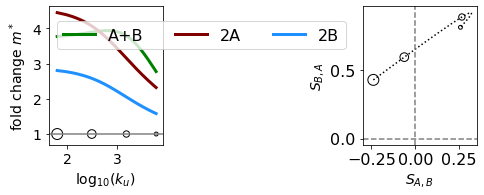

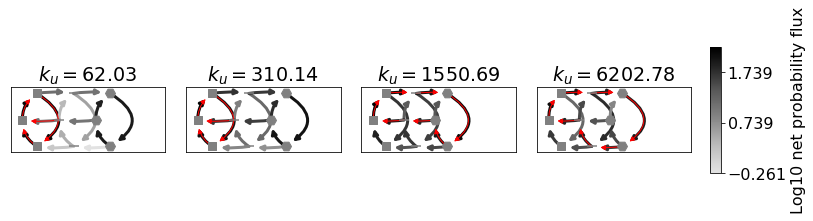

npii 57-1 7839 10980


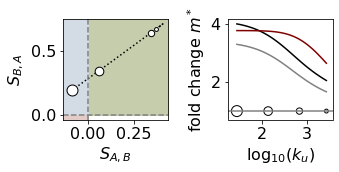

[1358.458335811412 77.08833696787266 2383.4238813899083 153.783432273482]
[1843.0448172886402 143.31687756008526 80.03113658804541 8783.600349731623]
[3152.058901955324 2922.072328887765 1823.456710351611 183.60814213581875]
229.4830751943937 275.95267337161494


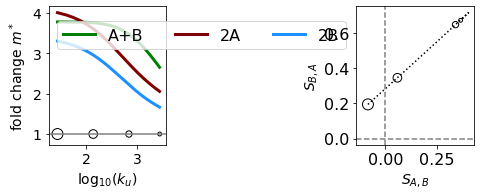

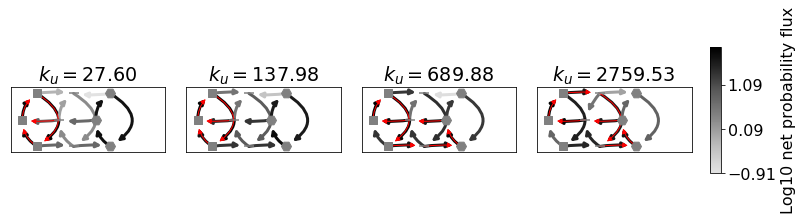

npii 49-0 2541 22920


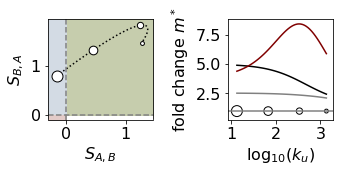

[15.99034461145826 9.733013546865411 5073.884071872861 3684.798578758336]
[20.299989543563193 1193.9545906585713 11.95272805005757 9312.70524358985]
[239.41586917603283 10.550907089255867 137.47523844715104
 6620.559118406355]
232.56990739697784 136.0721725943998


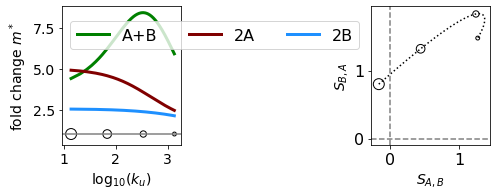

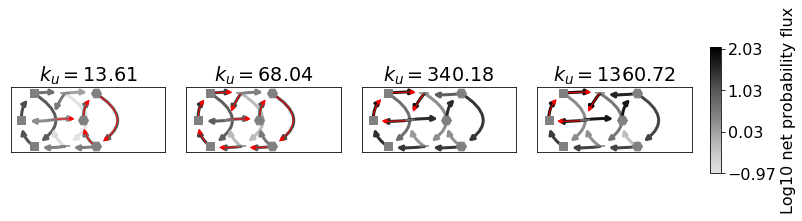

npii 49-0 627 22752


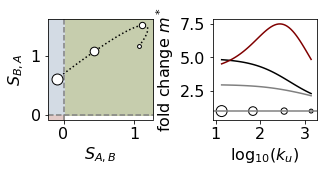

[15.99034461145826 9.733013546865411 5073.884071872861 3684.798578758336]
[21.100482825276906 673.5958020879107 171.9180791275079 4065.413354720587]
[192.03198950548386 12.629395475037295 143.78458430060184
 6103.699502533936]
232.56990739697784 136.0721725943998


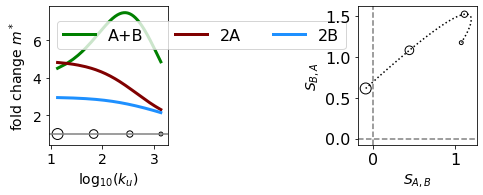

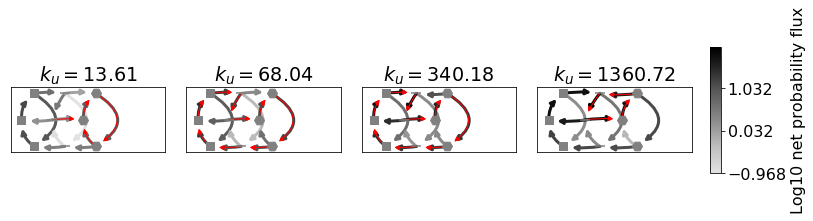

npii 49-0 3784 23040


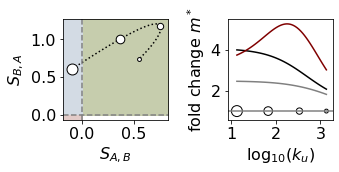

[15.99034461145826 9.733013546865411 5073.884071872861 3684.798578758336]
[18.59766326543853 275.2537975872091 506.45161280247385 6887.767466151062]
[101.03574726466816 10.997896088426002 79.72382276314708
 3767.1227103216333]
232.56990739697784 136.0721725943998


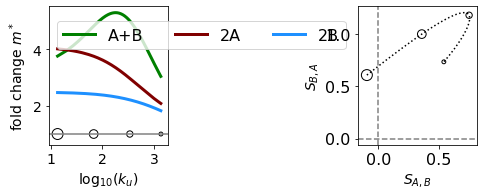

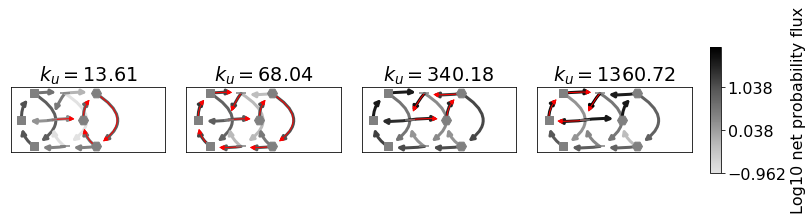

npii 49-0 1352 22806


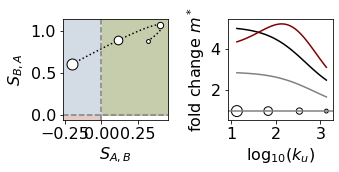

[15.99034461145826 9.733013546865411 5073.884071872861 3684.798578758336]
[20.377642367135845 2661.0704347591713 13.356135918565444 9070.11836406595]
[50.601401824397996 14.832644143633113 12.563103244876649
 7411.862903368944]
232.56990739697784 136.0721725943998


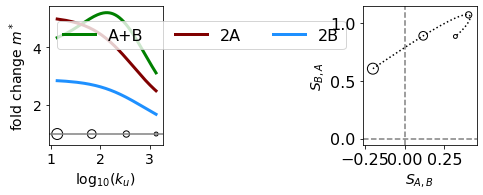

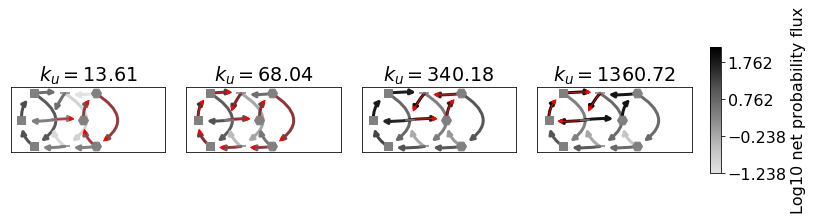

npii 57-1 7954 10990


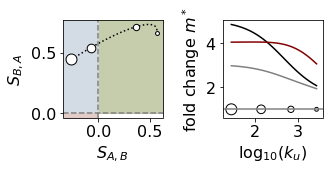

[1358.458335811412 77.08833696787266 2383.4238813899083 153.783432273482]
[9837.73970699609 8966.42716206167 742.3803505363893 177.4909994838723]
[2820.866000969373 101.44562662628609 787.3908980321584 6465.991605742185]
229.4830751943937 275.95267337161494


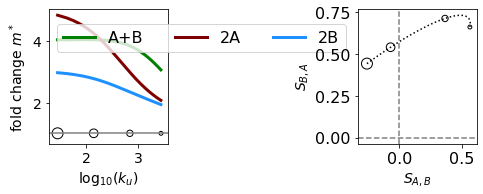

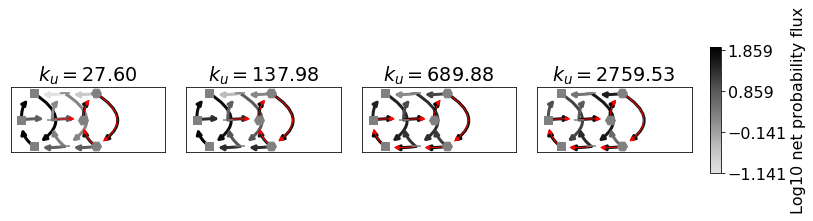

npii 3-0 2158 10356


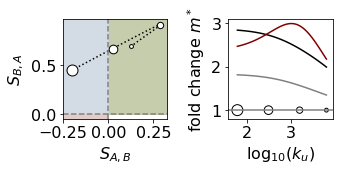

[159.6583402894029 680.1289958688553 14.575348768947391 110.48680645941988]
[175.776893855482 7514.336138017304 1.4306245211490354 3184.8729735823717]
[1761.935115696101 1121.8786313922294 1.407101719912473 122.630390661365]
610.792799614582 620.2777143105826


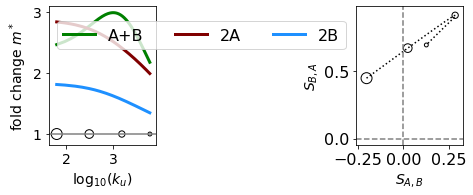

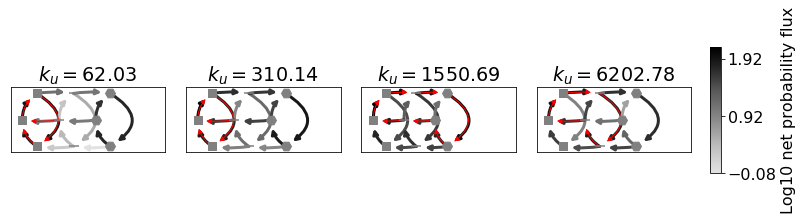

npii 49-0 4821 23126


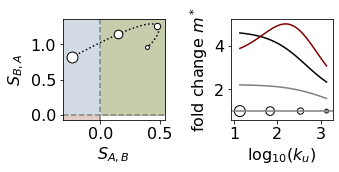

[15.99034461145826 9.733013546865411 5073.884071872861 3684.798578758336]
[18.94007759818755 4217.678255343786 27.77972173950025 4743.194115331062]
[51.51782804525088 10.709573566192773 71.58459884210221 8034.742066890225]
232.56990739697784 136.0721725943998


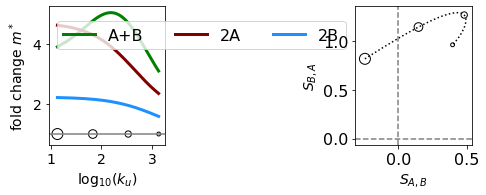

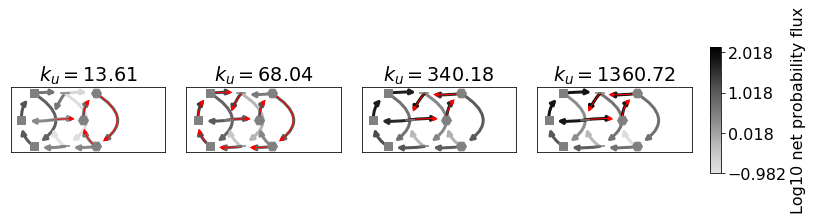

npii 3-0 5018 10607


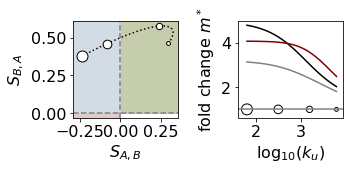

[159.6583402894029 680.1289958688553 14.575348768947391 110.48680645941988]
[9279.093347569722 1083.5081675566194 8.087319297960354 397.515906906485]
[210.05829487006423 9943.36216646 2.846032535386596 1578.5757245812588]
610.792799614582 620.2777143105826


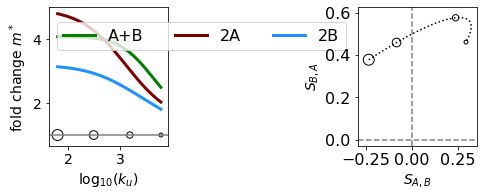

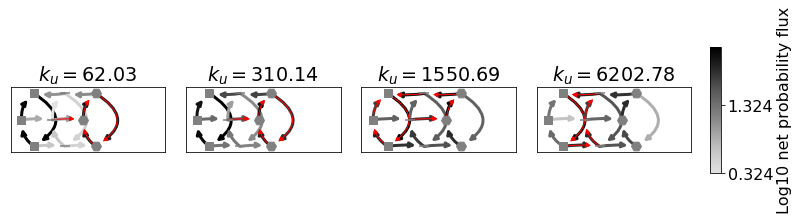

npii 49-0 6577 23270


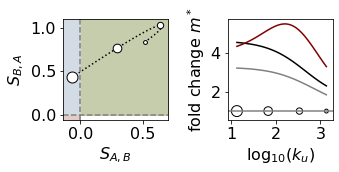

[15.99034461145826 9.733013546865411 5073.884071872861 3684.798578758336]
[21.74623556477005 1497.16258626457 649.4208313180519 3974.574628724209]
[66.26206021655054 16.156280710125287 17.030961427388025 7555.756500456111]
232.56990739697784 136.0721725943998


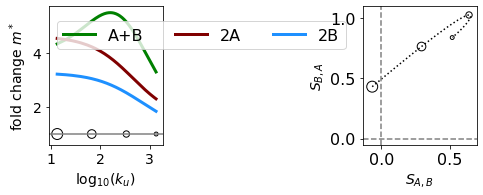

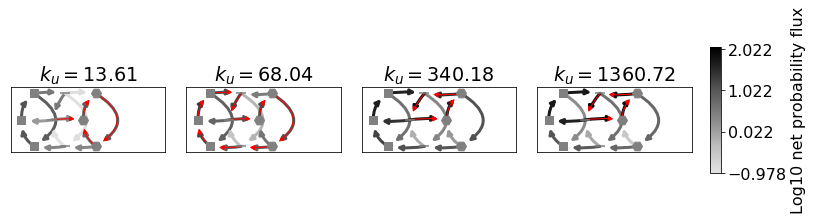

npii 49-0 2166 22881


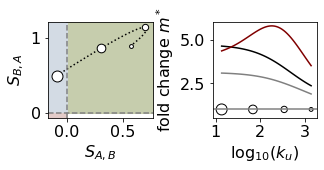

[15.99034461145826 9.733013546865411 5073.884071872861 3684.798578758336]
[19.325645854779538 1023.9178681444362 29.26966475687881 8268.030743625302]
[79.36752494643648 14.825195835261354 26.354421976739324 9544.936484673011]
232.56990739697784 136.0721725943998


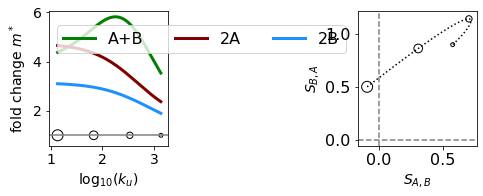

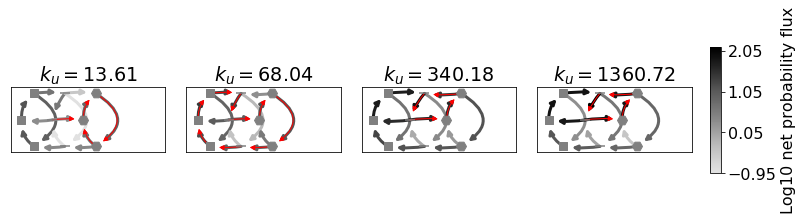

npii 49-0 2542 22921


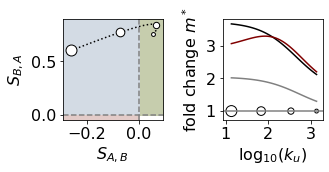

[15.99034461145826 9.733013546865411 5073.884071872861 3684.798578758336]
[16.51875168221928 3291.7792977008726 445.50272934731726 4119.301922454369]
[19.52719508720349 13.928447030783472 33.91445447724841 8908.194127504647]
232.56990739697784 136.0721725943998


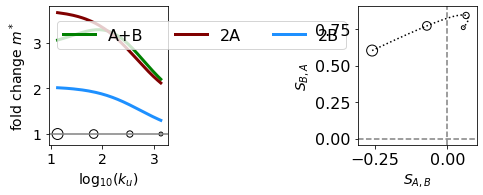

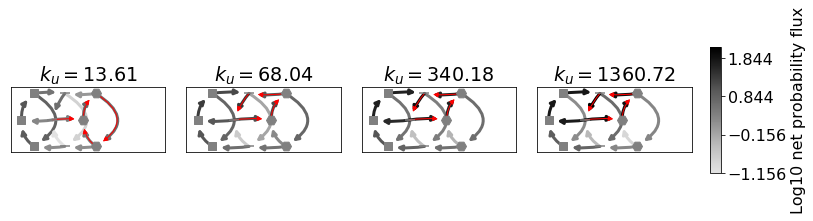

npii 28-0 4074 27152


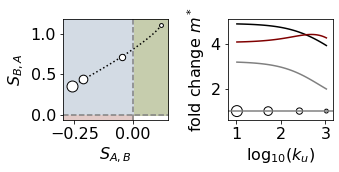

[824.2424337321793 175.77552725282766 3.1613193386668184 38.93762648792102]
[1549.2006710281669 183.4317933790885 1.4193008012246282
 1905.4824243966052]
[3044.760388701945 5871.061866624866 1.3011011322851296 103.94253847382912]
365.2720252250583 105.19278742476406


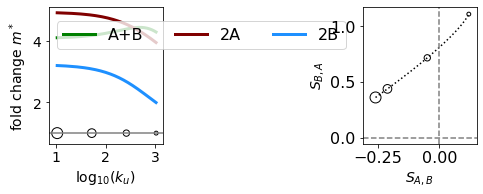

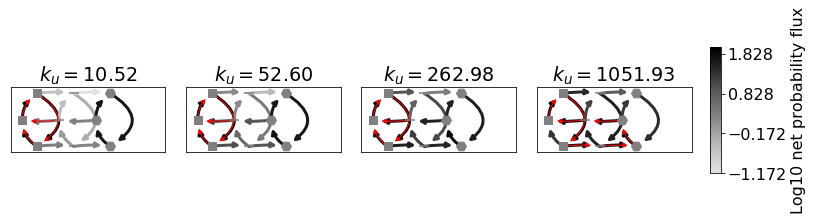

npii 57-0 2894 10948


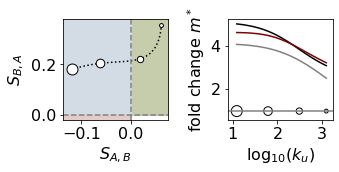

[2.2356230135775603 8.35426790656862 44.08027371158407 17.503737603355447]
[3.384730755629305 21.06948955363086 9.341257626083733 4346.147708194834]
[2.3738534761657832 6301.231624766372 1.6051046525648438
 343.14083876997745]
135.49141599373294 123.06297437292773


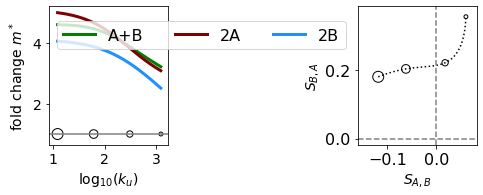

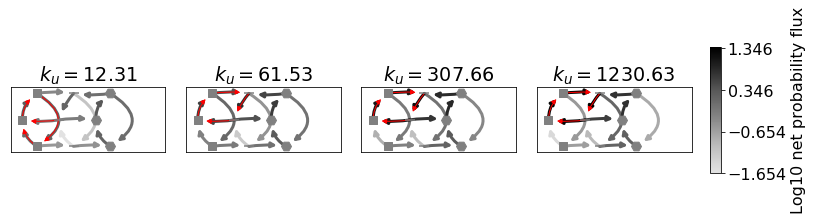

npii 80-0 3635 13797


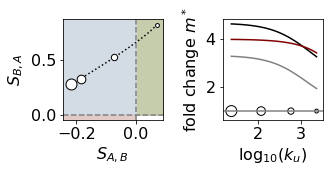

[122.3665923431942 627.5169600020164 12.008143917771585 498.8012104934616]
[7515.7510110564135 1363.2656145533108 1.339136896477585 590.2789477825028]
[301.7472117733645 5686.188752820108 9.896671759819037 9332.4065073828]
654.8535204969497 234.5850916186707


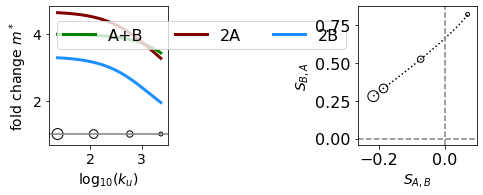

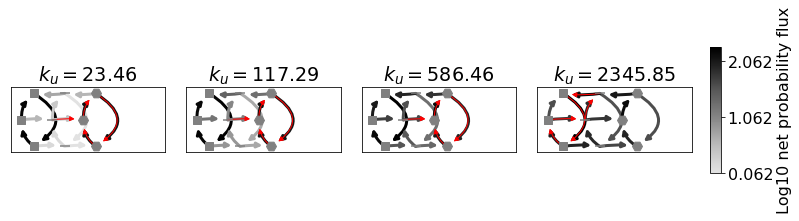

npii 28-0 2725 27141


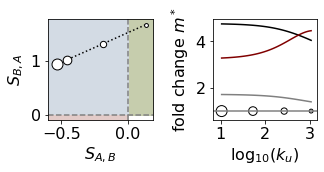

[824.2424337321793 175.77552725282766 3.1613193386668184 38.93762648792102]
[956.6389402191053 180.48908608022597 1.213105226012024 3743.699814559333]
[4793.232331409917 8049.006351618678 1.0492314616751373 53.61112309980869]
365.2720252250583 105.19278742476406


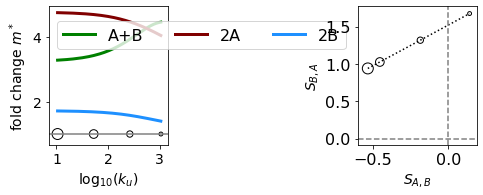

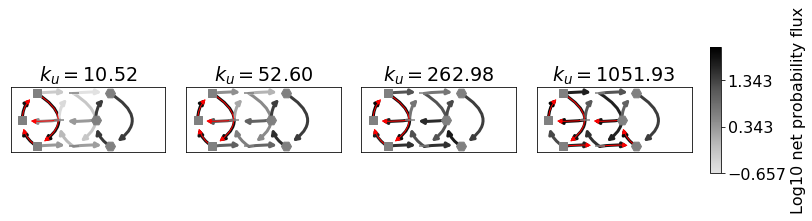

npii 49-0 6234 23234


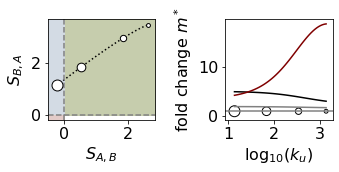

[15.99034461145826 9.733013546865411 5073.884071872861 3684.798578758336]
[8892.680078148438 20.24032342075429 869.4511678322674 5408.462646651302]
[16.909754689229437 7616.333933239666 5037.96528748152 4295.465922736809]
232.56990739697784 136.0721725943998


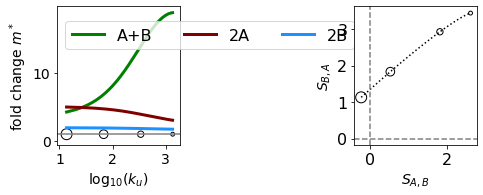

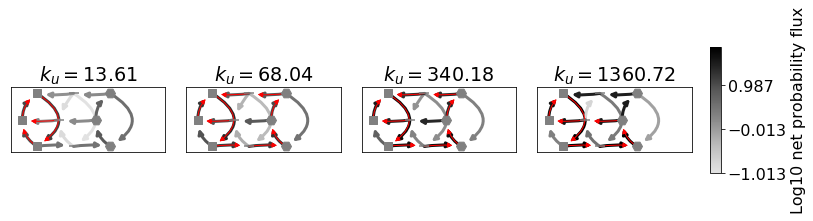

npii 28-0 4639 27158


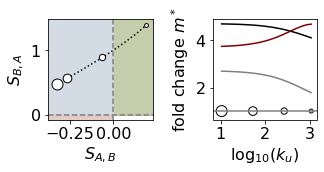

[824.2424337321793 175.77552725282766 3.1613193386668184 38.93762648792102]
[920.133130653822 176.0880163179646 2.422803131885834 5812.666330987099]
[2157.197560015683 5905.550211178679 2.137435374400183 87.75802661573547]
365.2720252250583 105.19278742476406


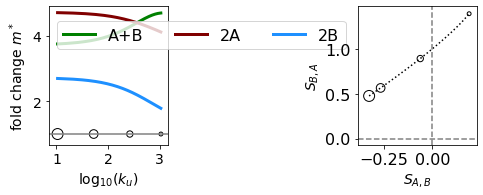

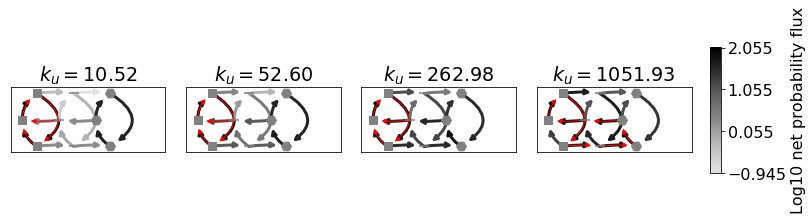

npii 28-0 3940 27150


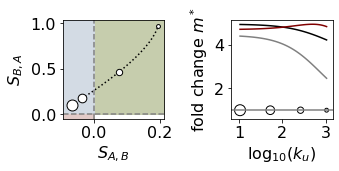

[824.2424337321793 175.77552725282766 3.1613193386668184 38.93762648792102]
[1391.798204111589 176.03174049647262 3.056628960658862 5232.6509449256]
[1756.4443446473178 3187.1294938683727 2.096902056093539
 155.16703892438275]
365.2720252250583 105.19278742476406


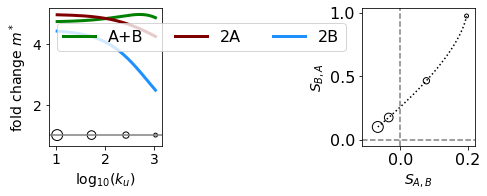

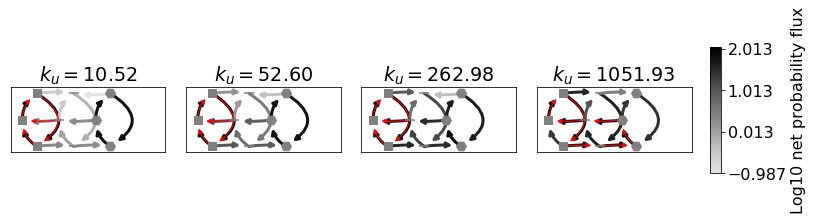

npii 28-0 5040 27163


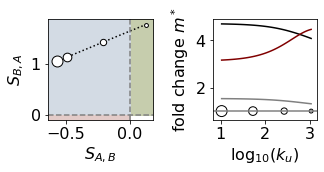

[824.2424337321793 175.77552725282766 3.1613193386668184 38.93762648792102]
[839.3507154623262 180.02495935160897 2.2050545315704264 5212.042124608249]
[1438.7837183889096 9413.844578167465 3.1284242806511253
 48.849873739001076]
365.2720252250583 105.19278742476406


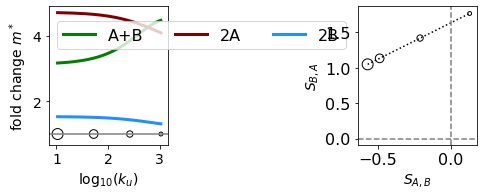

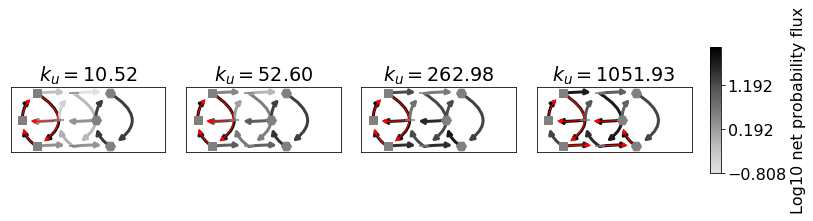

npii 28-0 946 27129


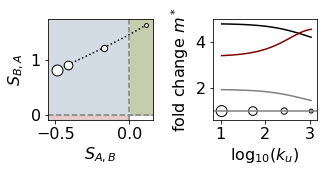

[824.2424337321793 175.77552725282766 3.1613193386668184 38.93762648792102]
[977.2410056795751 176.0823804959399 1.1239724226233354 9287.3320378918]
[2277.7990436020573 2705.0925262426667 1.1343332291468118
 62.42811253959322]
365.2720252250583 105.19278742476406


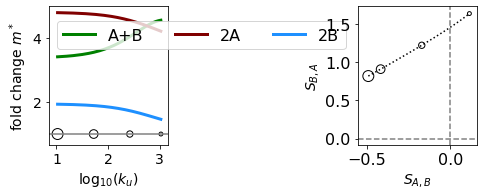

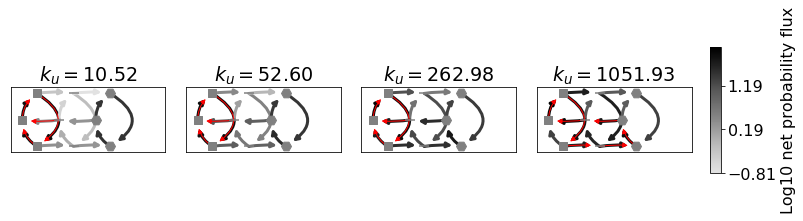

npii 80-0 290 13786


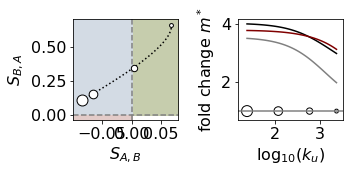

[122.3665923431942 627.5169600020164 12.008143917771585 498.8012104934616]
[6667.426895692119 692.9565721308528 6.3715442724306905 730.2169008079637]
[349.86285731183295 2553.366960472592 1.5498662903520173 8590.700664136279]
654.8535204969497 234.5850916186707


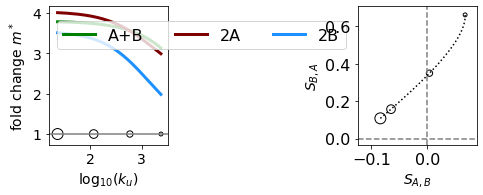

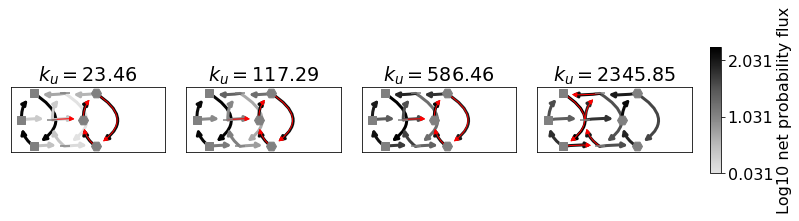

npii 28-0 5746 27173


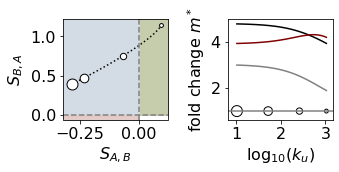

[824.2424337321793 175.77552725282766 3.1613193386668184 38.93762648792102]
[939.1459242574646 186.82954532632462 1.9234795319732647 2391.290238591852]
[4556.469074821336 2542.507556067604 1.230488087752898 97.74155340108533]
365.2720252250583 105.19278742476406


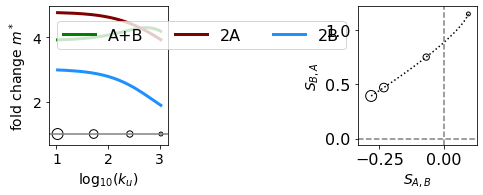

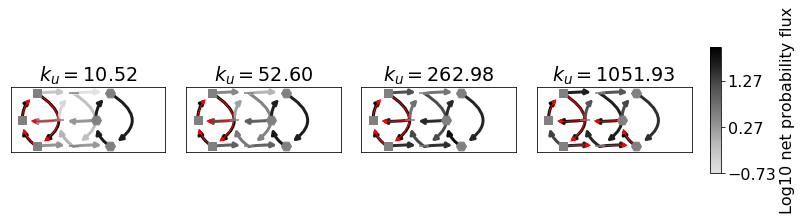

npii 28-0 1617 27134


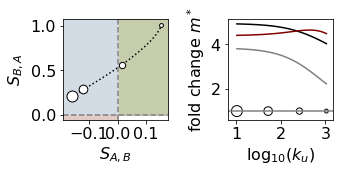

[824.2424337321793 175.77552725282766 3.1613193386668184 38.93762648792102]
[1015.4851052660052 189.65719634102376 1.321114357501754
 2773.9859149399967]
[6585.858250612505 2839.851396663924 1.5022972277908315 124.9708414244466]
365.2720252250583 105.19278742476406


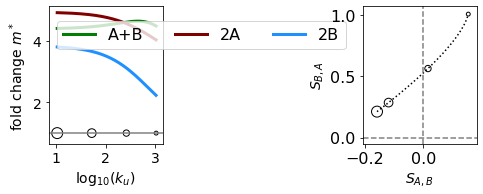

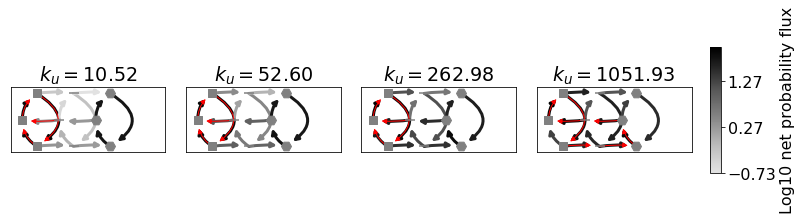

npii 28-0 6078 27175


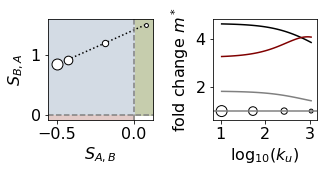

[824.2424337321793 175.77552725282766 3.1613193386668184 38.93762648792102]
[940.6457417433703 180.8460540284496 2.656517868754588 2268.0977450012742]
[1476.7318170008912 9882.86515027382 1.925627831671088 58.64822920228134]
365.2720252250583 105.19278742476406


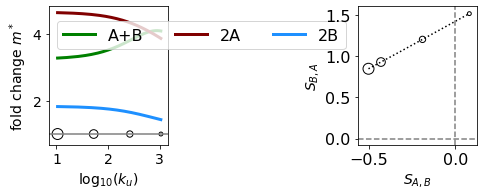

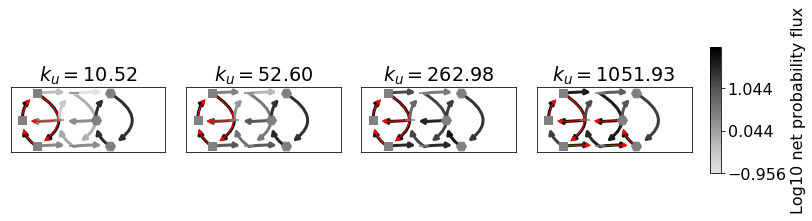

npii 28-0 7081 27180


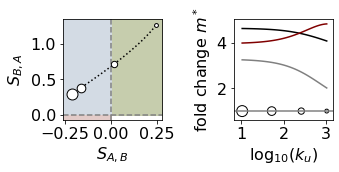

[824.2424337321793 175.77552725282766 3.1613193386668184 38.93762648792102]
[850.9886638431357 175.7948688276809 2.0232780428850514 6306.91472895774]
[3761.2239348846297 5826.031747326419 1.3651192892363038
 105.34660570253763]
365.2720252250583 105.19278742476406


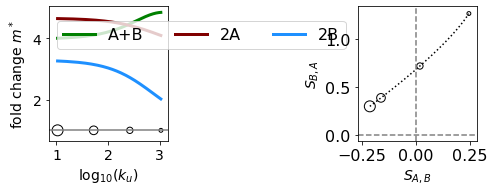

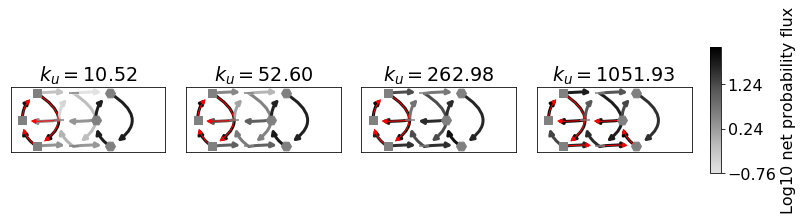

npii 80-0 7060 13807


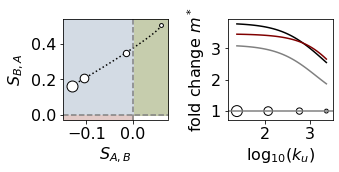

[122.3665923431942 627.5169600020164 12.008143917771585 498.8012104934616]
[1959.480555526388 1068.0948624087682 3.9951825622466735 593.3148815142345]
[281.6796931602093 6211.739171717959 10.715628038360586 8218.589521329377]
654.8535204969497 234.5850916186707


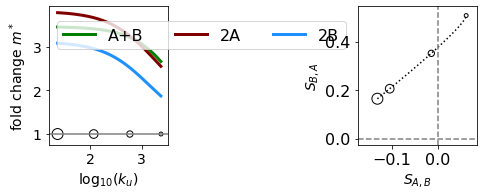

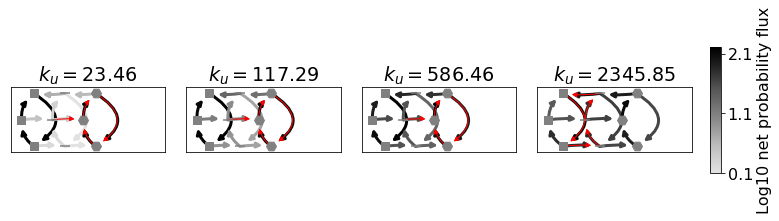

npii 28-0 7322 27181


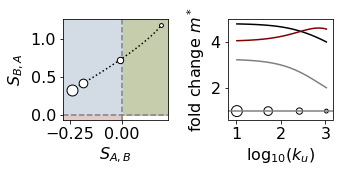

[824.2424337321793 175.77552725282766 3.1613193386668184 38.93762648792102]
[1156.854514225215 178.74459089177623 1.4021194254783158 2768.434810265068]
[9306.003051584317 5346.723228877522 3.0922547992182303 102.52798452171308]
365.2720252250583 105.19278742476406


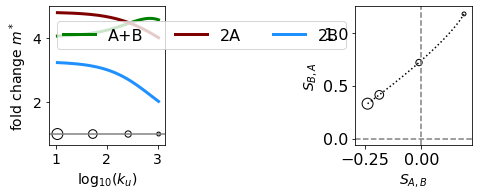

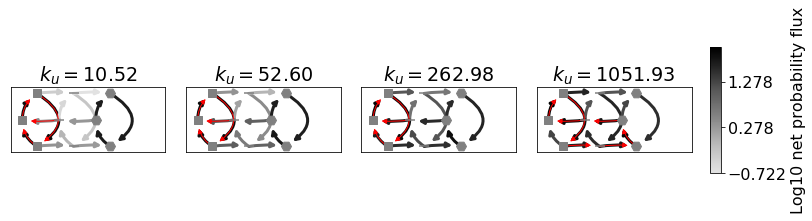

npii 80-0 2527 13793


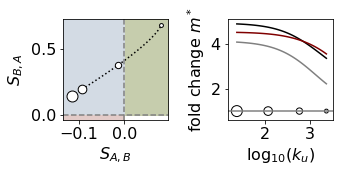

[122.3665923431942 627.5169600020164 12.008143917771585 498.8012104934616]
[6520.696354525071 1677.678691576948 7.536968938782186 595.692407122752]
[380.00603480551666 6983.429679605669 4.867655395572314 8064.1465411758045]
654.8535204969497 234.5850916186707


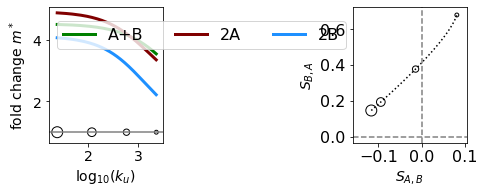

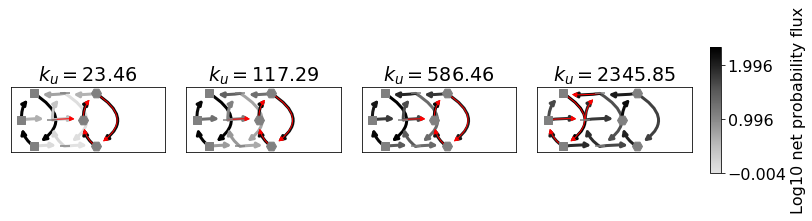

npii 28-0 2827 27142


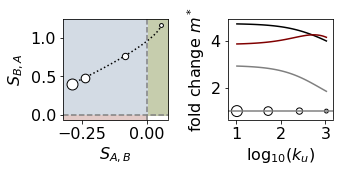

[824.2424337321793 175.77552725282766 3.1613193386668184 38.93762648792102]
[1024.0820997736016 178.80426523318837 2.1192003383647835
 3116.7069411497996]
[7700.196266615246 1433.7985140787866 2.6487614683057097 97.6368791578912]
365.2720252250583 105.19278742476406


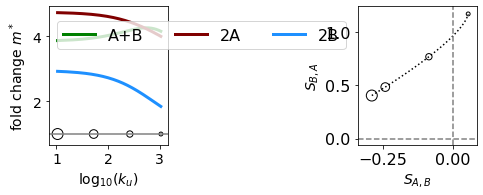

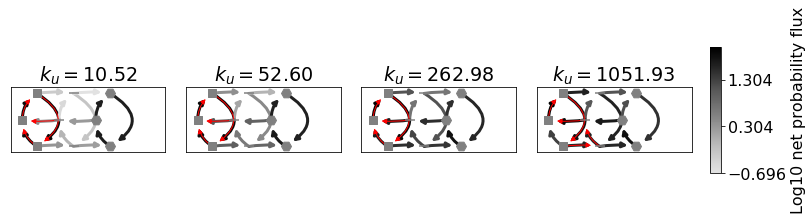

npii 80-0 6303 13805


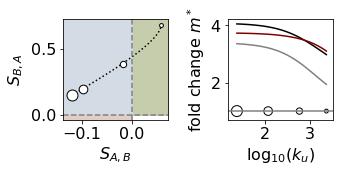

[122.3665923431942 627.5169600020164 12.008143917771585 498.8012104934616]
[5699.6081658339945 674.6590453546304 1.3809370105586185 785.7010611824414]
[326.5279958150834 2909.8000143320196 6.005826003566135 9041.915611618722]
654.8535204969497 234.5850916186707


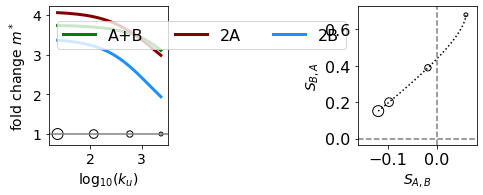

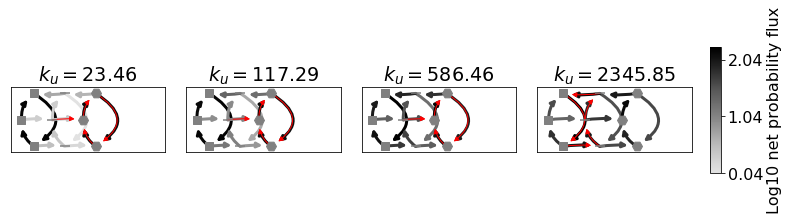

npii 28-0 321 27122


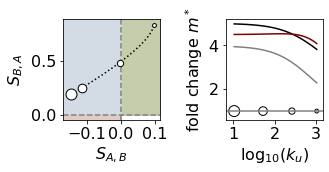

[824.2424337321793 175.77552725282766 3.1613193386668184 38.93762648792102]
[1295.1888157954295 197.65116762350644 1.8305345627680576
 1448.521673696568]
[1381.2988129397916 5076.383119166167 2.2712781351908893
 137.59355346217222]
365.2720252250583 105.19278742476406


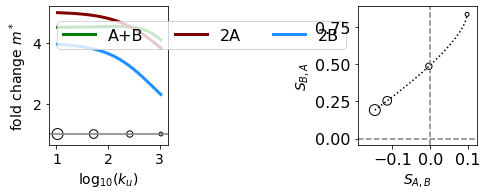

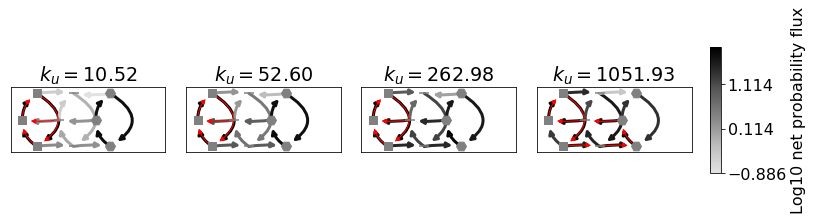

**starting class npid
npid 65-1 12445 4957


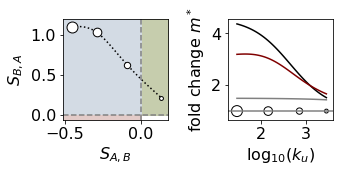

[12.35607549703114 1.3979302061719785 21.86755132210443 10.4312290289087]
[20.538969308509127 5.867674929000112 3.21816874841526 92.59047459564718]
[903.814801317213 1.4144972953481882 9.483428483140408 492.8962290700062]
210.9616868323976 286.2980802899199


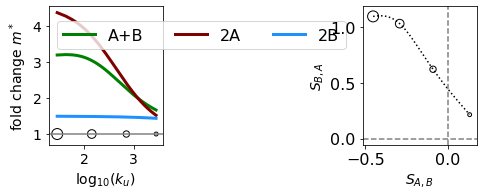

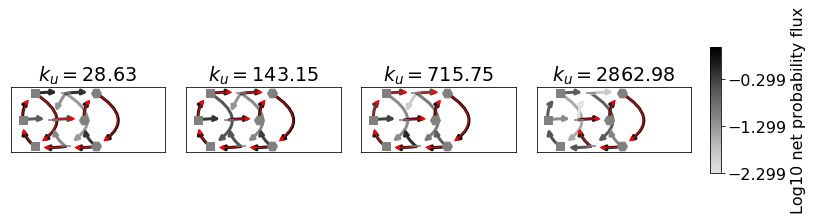

npid 17-0 3515 5812


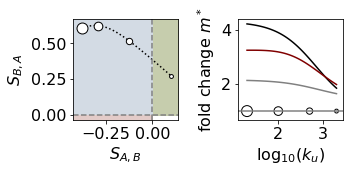

[15.08898444213308 132.5400171410308 5.835568183692679 1.8689661374796835]
[41.5052566112596 6495.5552852793335 2.645225866949402 6.471132321753402]
[1168.694378916029 4981.875913514817 5.138078869878225 2.660221434063025]
374.94789520322485 205.4315029799337


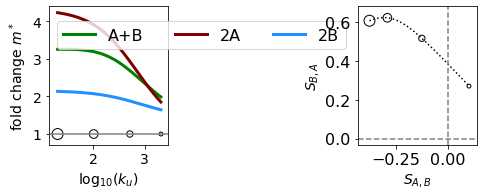

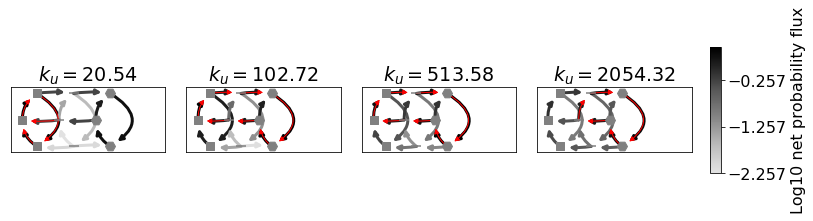

npid 57-1 10816 1016


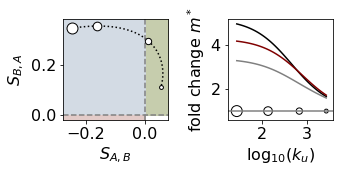

[1358.458335811412 77.08833696787266 2383.4238813899083 153.783432273482]
[7344.581536374945 651.7648947911539 254.14908983087662 232.4908347719011]
[5129.804844776391 126.89784532507065 78.83921334648876 789.7507094184888]
229.4830751943937 275.95267337161494


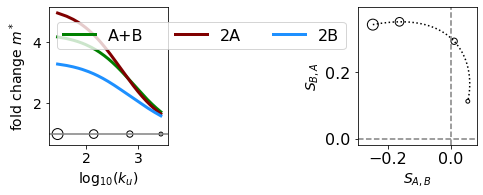

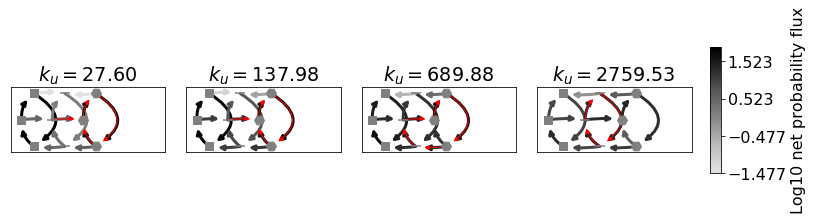

npid 20-3 25657 232


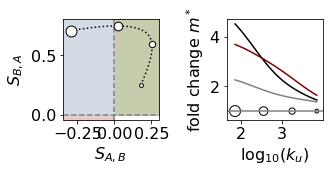

[375.3718540626825 55.013723540374244 7.6666940884719725
 42.497489962864755]
[3394.800512201997 136.4312948174111 2.6278529604443763 2175.086943170658]
[1025.834638654052 7143.703264330014 1.892601130630912 60.74866205057118]
98.12751898457708 716.2234686391505


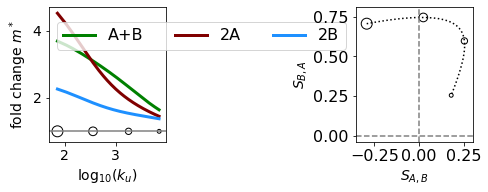

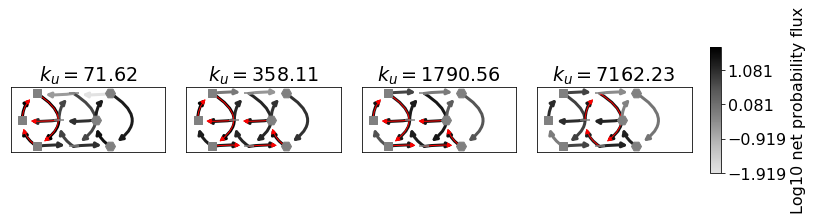

npid 3-0 5425 727


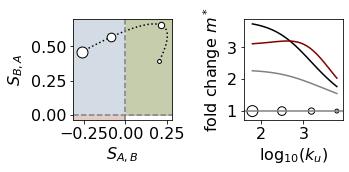

[159.6583402894029 680.1289958688553 14.575348768947391 110.48680645941988]
[297.53001266890163 1804.5645627222411 1.705148078319855
 1517.2904181005924]
[2793.9556183304862 9507.305668438688 1.8345574526661852 139.1745061647516]
610.792799614582 620.2777143105826


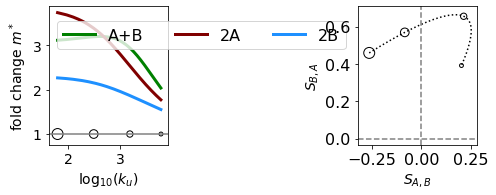

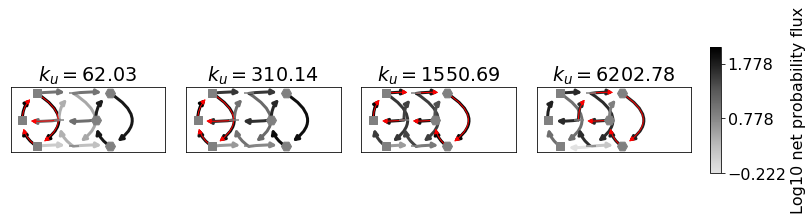

npid 69-2 18883 1467


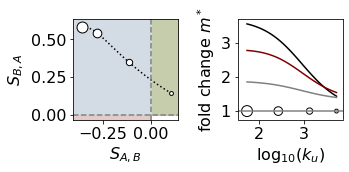

[223.81883242855736 1.271087335505975 31.385270306349195 4.425961026522288]
[523.5484129010758 3.9299661078344528 20.420495745016023
 39.476569342176674]
[396.24878135214635 1.8109533178220332 5.0419950407874055
 3401.5142899780217]
444.4975833929587 541.1060349732925


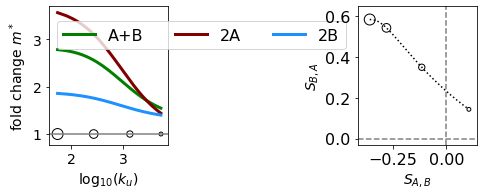

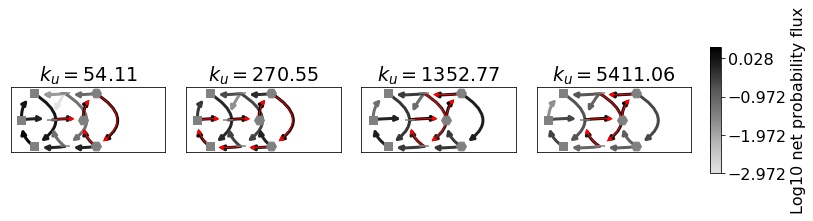

npid 49-0 4474 3505


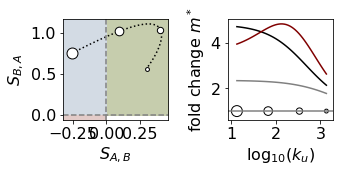

[15.99034461145826 9.733013546865411 5073.884071872861 3684.798578758336]
[25.362196337189378 149.6815792673597 1273.0606002926245 8224.521140586652]
[88.16369172675014 10.460976902246156 6.982818639867796 5162.791751074734]
232.56990739697784 136.0721725943998


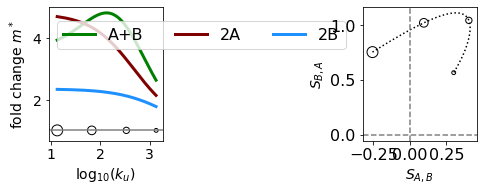

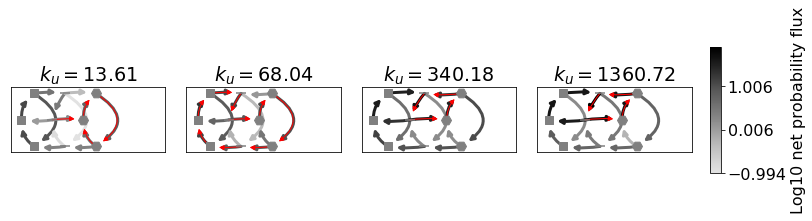

npid 17-0 2435 5730


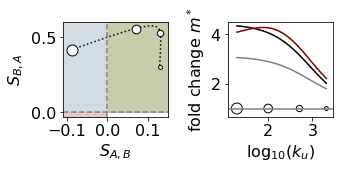

[15.08898444213308 132.5400171410308 5.835568183692679 1.8689661374796835]
[15.164359738267464 2195.615243056612 2.042188478150052 9.616999280767676]
[316.4468262812217 440.68410371044814 4.543944488321543 3.9459977584637262]
374.94789520322485 205.4315029799337


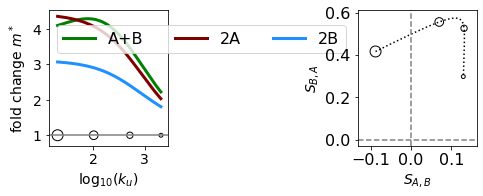

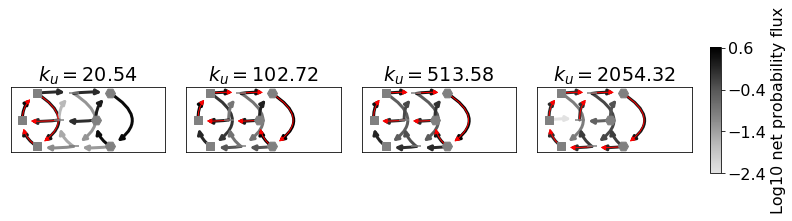

npid 17-0 1009 5595


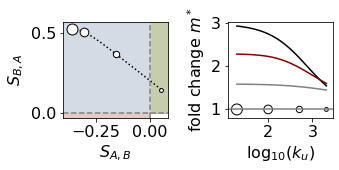

[15.08898444213308 132.5400171410308 5.835568183692679 1.8689661374796835]
[51.46785507612877 218.6748283175132 1.8524599816834382 4.1453713622971184]
[454.67316058362417 202.6279759100426 3.1831383592572475
 1.9878763326673408]
374.94789520322485 205.4315029799337


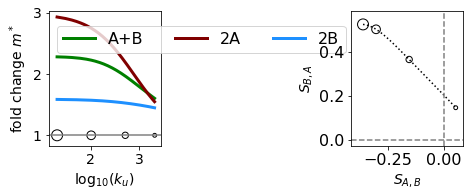

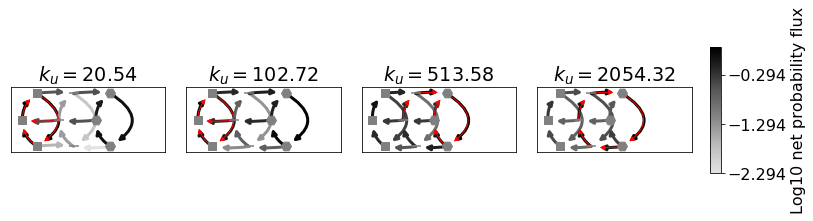

npid 3-0 4596 698


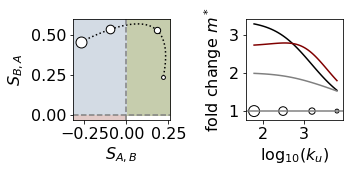

[159.6583402894029 680.1289958688553 14.575348768947391 110.48680645941988]
[282.33830115895887 2507.7033861329005 9.541140343495856 825.157696645605]
[4074.7620275362297 3379.3289941226885 4.6254194079320685
 121.9827343309082]
610.792799614582 620.2777143105826


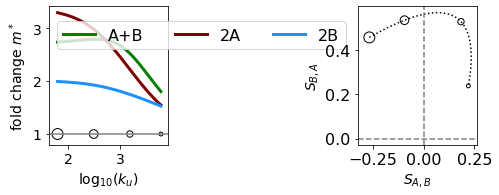

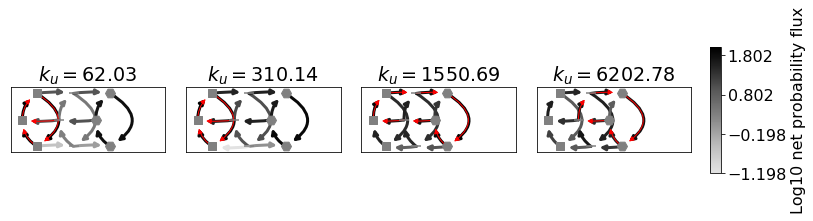

npid 3-0 6455 763


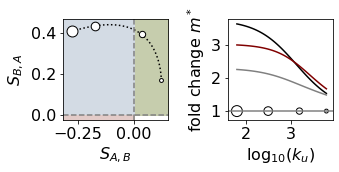

[159.6583402894029 680.1289958688553 14.575348768947391 110.48680645941988]
[349.2018199184262 9468.80353063958 2.170393617818626 582.1035811246178]
[3122.5645780968707 857.5370046833534 1.6843227178190991
 161.73842262883318]
610.792799614582 620.2777143105826


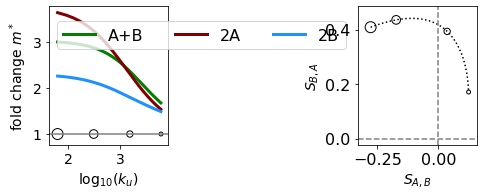

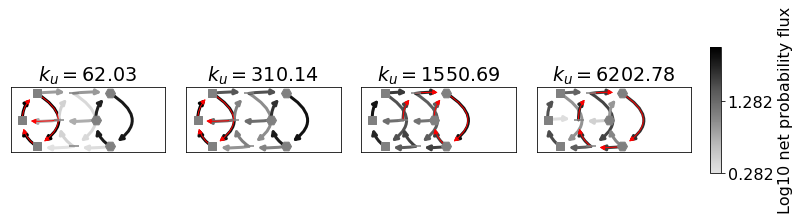

npid 49-0 2787 3471


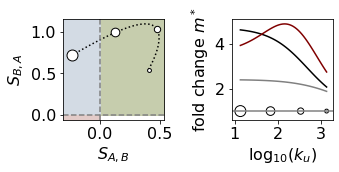

[15.99034461145826 9.733013546865411 5073.884071872861 3684.798578758336]
[22.262023419288735 127.21514761693103 18.576283323857396
 7795.948814548579]
[122.19231151736608 10.50933453187849 766.9125776012688 7992.904796525208]
232.56990739697784 136.0721725943998


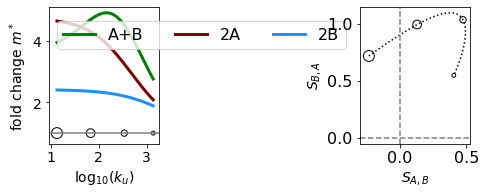

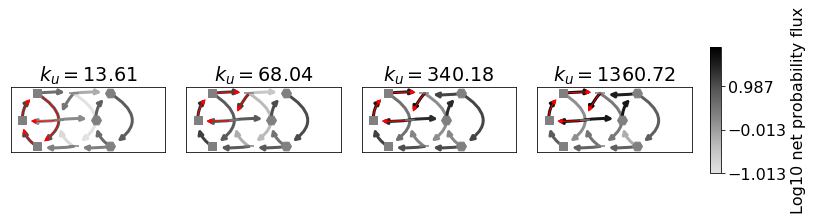

npid 17-0 5195 5969


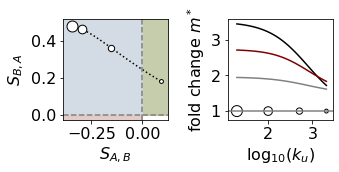

[15.08898444213308 132.5400171410308 5.835568183692679 1.8689661374796835]
[75.99275739415114 807.9354997656288 2.571592008972344 4.7326200384420005]
[4667.613728064655 1478.5269166817875 3.4007439592397164
 2.4010752267082967]
374.94789520322485 205.4315029799337


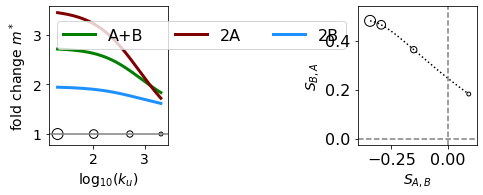

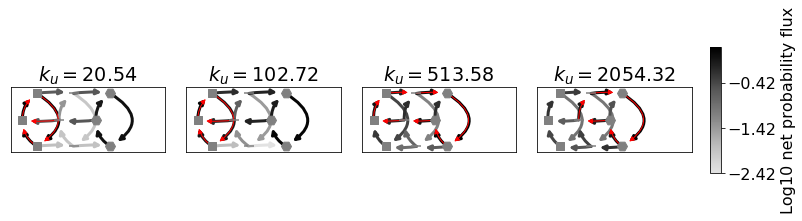

npid 17-0 7501 6144


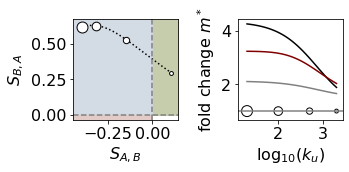

[15.08898444213308 132.5400171410308 5.835568183692679 1.8689661374796835]
[56.509680473659685 5554.183099966587 5.1880948884918086 6.436108507112549]
[6576.458122201743 440.3844327294628 1.0393932970594348 2.617698247671696]
374.94789520322485 205.4315029799337


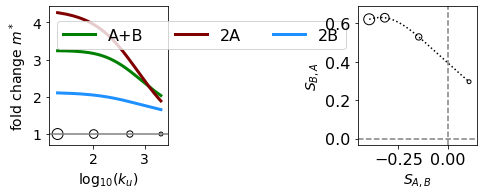

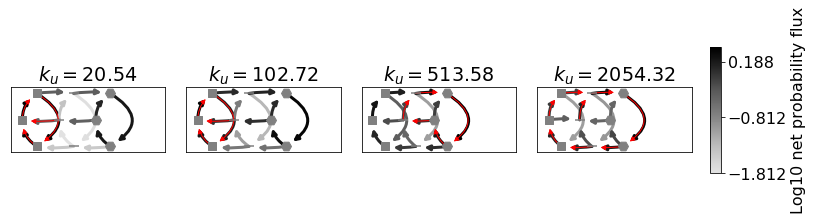

npid 3-0 5078 711


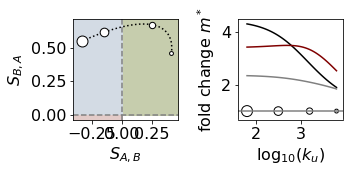

[159.6583402894029 680.1289958688553 14.575348768947391 110.48680645941988]
[4831.704447209757 831.8783409853488 4.027393957027487 391.9687248319112]
[161.32674521749502 1010.3883977039212 1.0460499353570063
 3808.205679794309]
610.792799614582 620.2777143105826


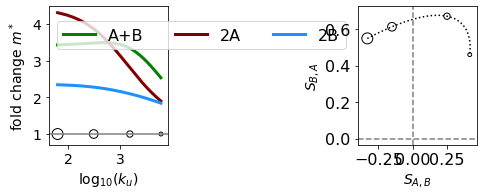

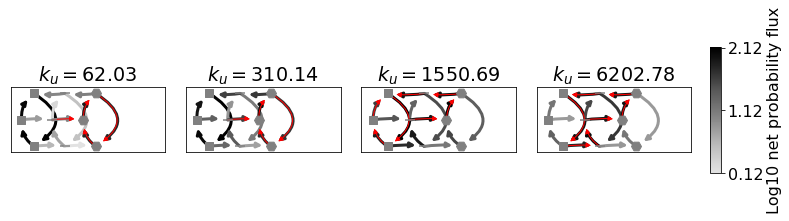

npid 65-1 10154 4744


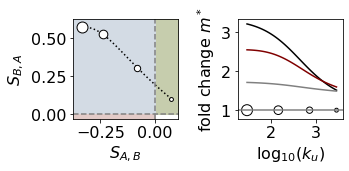

[12.35607549703114 1.3979302061719785 21.86755132210443 10.4312290289087]
[23.75159916286764 3.6665582116225424 18.26543297472423 489.9374910528808]
[775.5167754914047 1.6295262665502208 18.397338334031733 3169.275362138349]
210.9616868323976 286.2980802899199


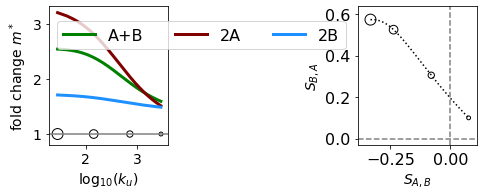

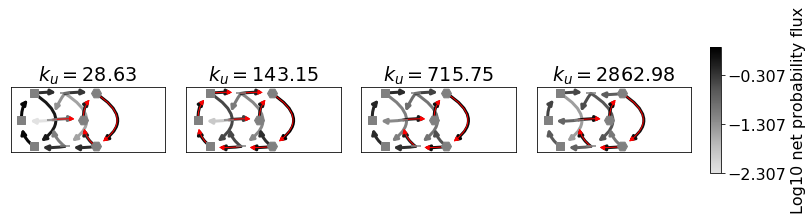

npid 86-0 7624 2732


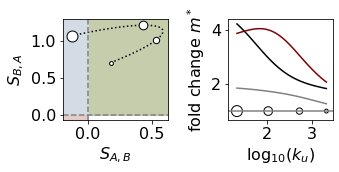

[6.462905630357634 6.735539947925498 4.078974339377941 1043.2088100950348]
[3719.2624710270597 17.0932357570045 2.1139181667354183 1709.6475626303568]
[6.488355184206027 229.04490568230796 3.008556569520162 2729.5232013119853]
28.500569059000274 212.8942481410222


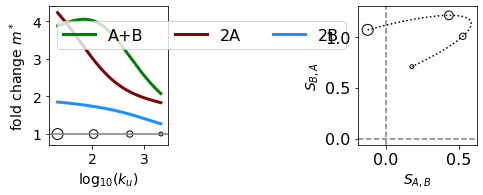

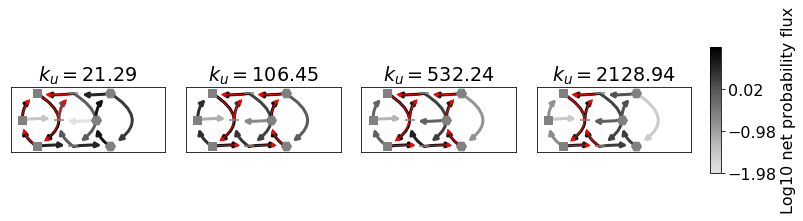

npid 57-1 8672 944


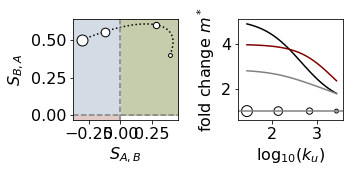

[1358.458335811412 77.08833696787266 2383.4238813899083 153.783432273482]
[2554.679777451194 2821.3322403854545 149.06823033793606 195.6655761074937]
[6659.343729489783 96.85089642577341 42.567730996827706 1782.7776224583579]
229.4830751943937 275.95267337161494


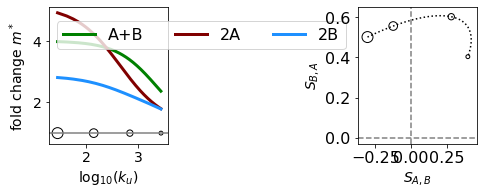

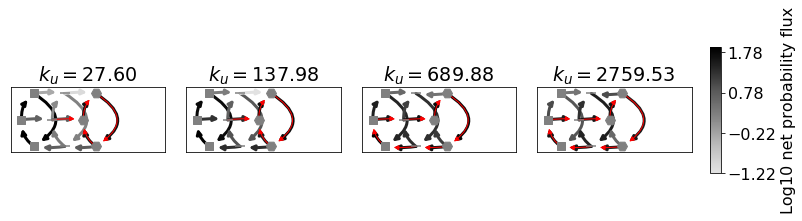

npid 17-0 7232 6119


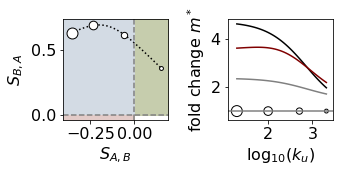

[15.08898444213308 132.5400171410308 5.835568183692679 1.8689661374796835]
[37.12928806818189 264.258571303967 5.311065443260778 8.091779287131493]
[3299.7762087598 139.16322598686557 2.495672376709786 2.9763814697472517]
374.94789520322485 205.4315029799337


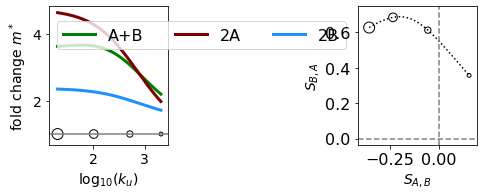

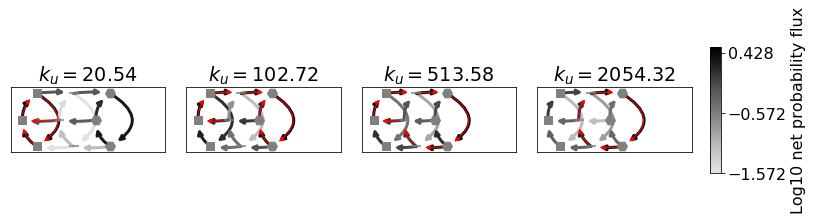

npid 3-0 3485 652


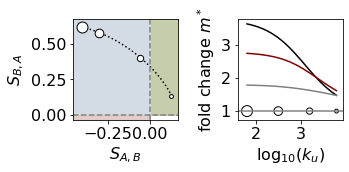

[159.6583402894029 680.1289958688553 14.575348768947391 110.48680645941988]
[458.6430081616594 8434.988794390118 1.055055195430462 418.6598229716992]
[4431.62697430851 1339.2660352481273 1.0724122996803702 113.07256881236984]
610.792799614582 620.2777143105826


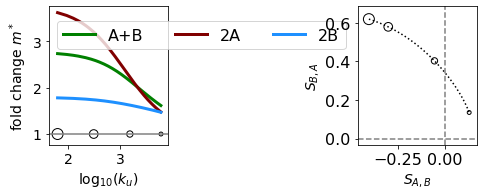

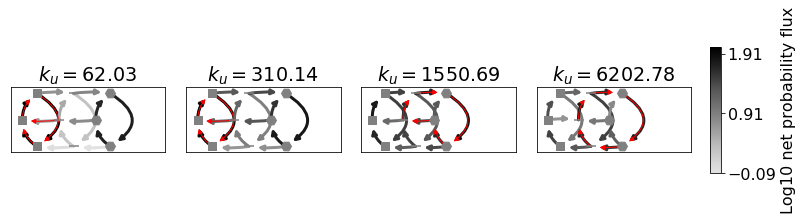

npid 57-1 13104 1099


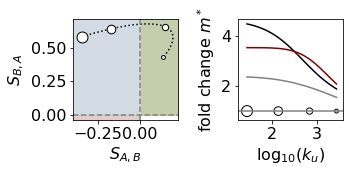

[1358.458335811412 77.08833696787266 2383.4238813899083 153.783432273482]
[8420.474931773593 2655.139285237783 158.37376096384028 161.63265873395304]
[1764.023742655743 84.12424590693793 7.771681929133706 1339.7969344570654]
229.4830751943937 275.95267337161494


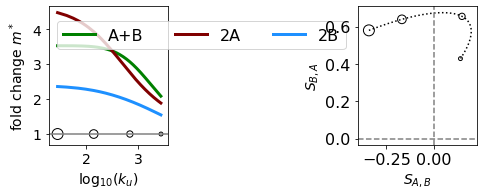

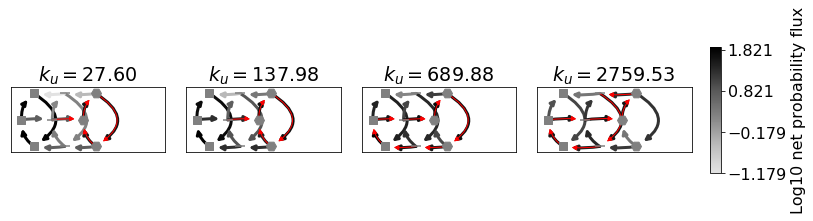

npid 17-0 784 5574


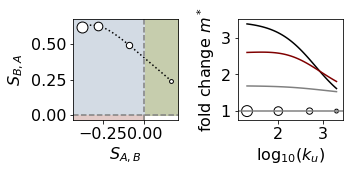

[15.08898444213308 132.5400171410308 5.835568183692679 1.8689661374796835]
[32.09353392748503 2588.7223961473333 1.4173265079942208 5.080899871995733]
[1745.3842877116892 582.4656901424657 1.1715735980502742 2.081772766564578]
374.94789520322485 205.4315029799337


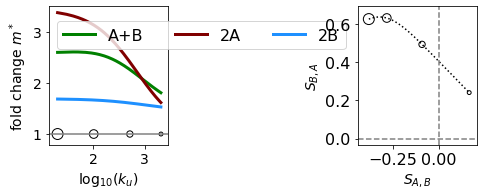

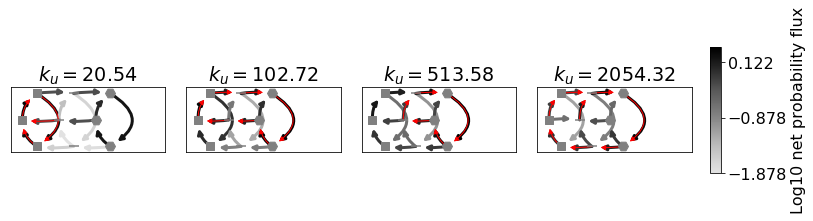

npid 17-0 6407 6058


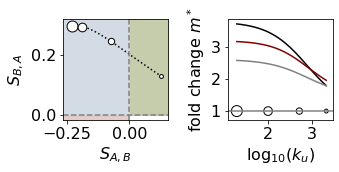

[15.08898444213308 132.5400171410308 5.835568183692679 1.8689661374796835]
[79.97761895440053 356.34343187256036 1.8715137771960155 5.106173299921973]
[3515.731669033786 9459.239887622223 4.033553442492724 3.200054844754681]
374.94789520322485 205.4315029799337


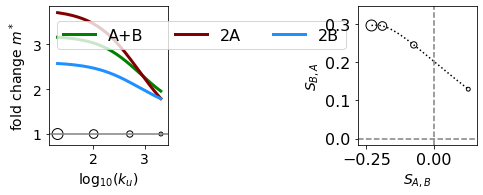

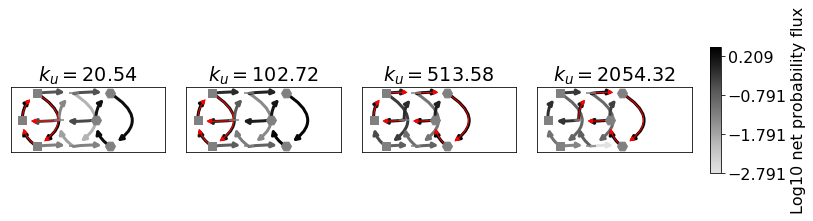

npid 44-1 12588 2455


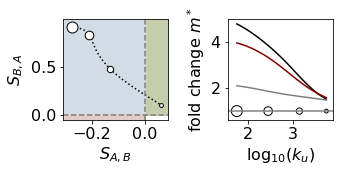

[60.11120726075199 1.3981207549974348 158.79121958532002
 1.8287308339817336]
[228.06682276658412 2.0683146133067805 2.394600355600544 50.49909177298744]
[7875.687492471197 1.4103971215903304 5.8448016546208015 1.985727688424604]
72.68140493286859 553.5104711089572


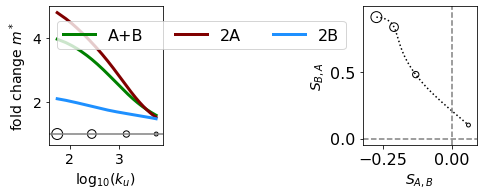

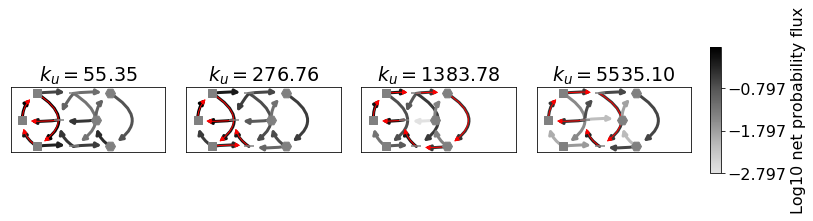

npid 65-1 10812 4808


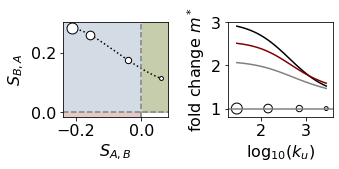

[12.35607549703114 1.3979302061719785 21.86755132210443 10.4312290289087]
[6309.804705725095 3.076823634835539 7.46977425867336 37.20594214464821]
[133.775393756401 2.0171936784224016 6.842253654397397 1230.9529332780585]
210.9616868323976 286.2980802899199


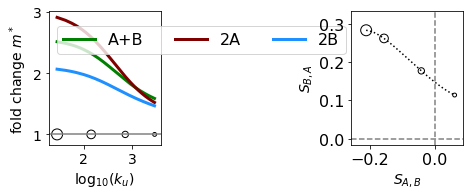

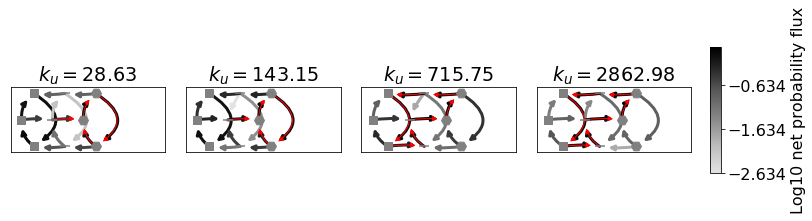

npid 65-1 14923 5189


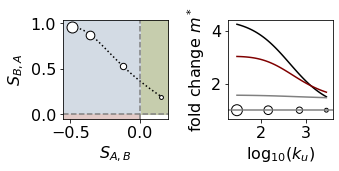

[12.35607549703114 1.3979302061719785 21.86755132210443 10.4312290289087]
[125.10315235124494 5.0787993755250005 1.193715002517297
 30.727977627594573]
[3419.973662762322 1.4846287829902032 5.9272990149632365
 1103.0641201444216]
210.9616868323976 286.2980802899199


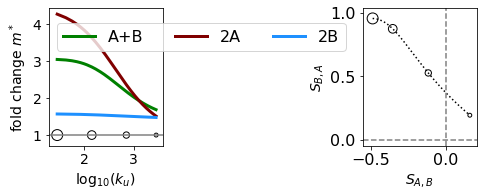

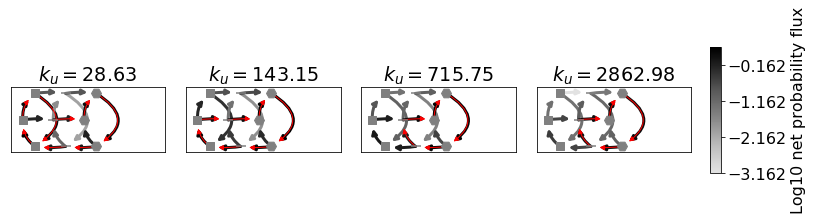

npid 0-4 35449 1765


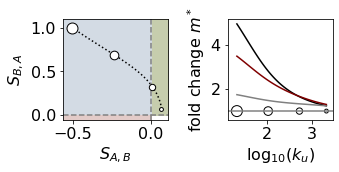

[21.252878538152878 13.205171636861243 22.89489579254537
 1060.2851680046958]
[67.88213782039155 404.5127668912721 7.518668297776233 3293.235188446935]
[2685.751788032609 16.258351872426864 11.851325760139394 6951.682871483047]
17.39281178354825 212.39575378694568


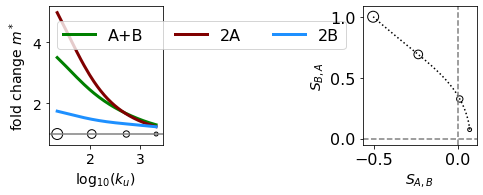

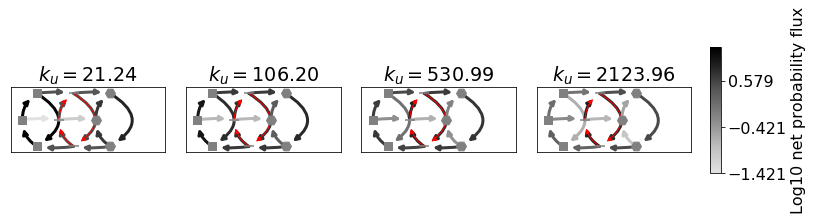

npid 0-4 40340 1914


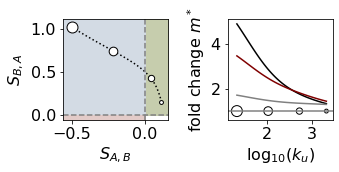

[21.252878538152878 13.205171636861243 22.89489579254537
 1060.2851680046958]
[62.87540292939785 676.5465294993157 3.3032406499809133 1657.5416369272455]
[9618.688816293039 15.720694818463116 5.143921343560692 3666.0966663216973]
17.39281178354825 212.39575378694568


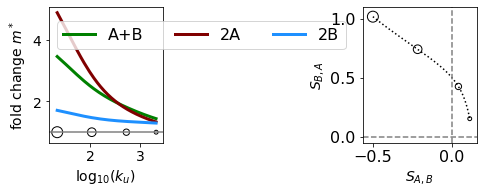

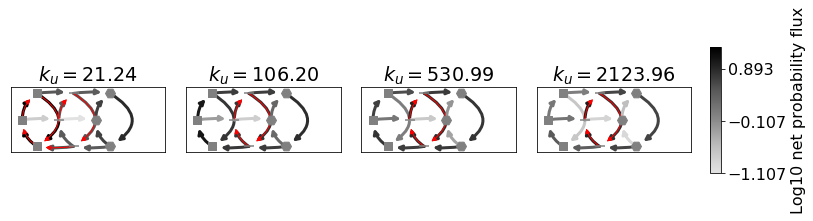

npid 49-0 4379 3499


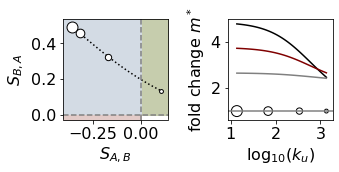

[15.99034461145826 9.733013546865411 5073.884071872861 3684.798578758336]
[172.65397145748454 21.901886527794318 55.594355070591895
 4577.819430578323]
[3200.0612416958024 10.604721142222925 61.67962886899869 4209.019228843637]
232.56990739697784 136.0721725943998


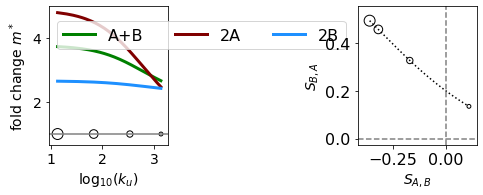

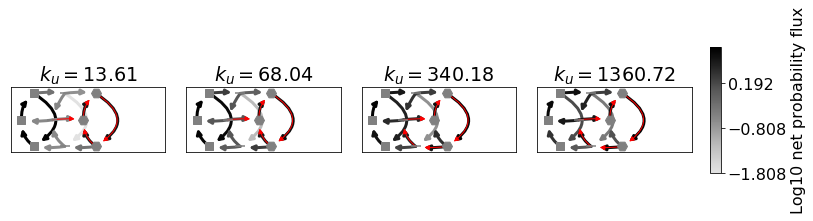

npid 17-0 962 5591


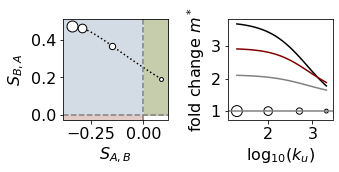

[15.08898444213308 132.5400171410308 5.835568183692679 1.8689661374796835]
[74.84195856942826 302.3694594454259 2.7987893137061546 5.177446175007803]
[3746.9457702557147 264.17890933632214 4.126166968100608
 2.6292864808404133]
374.94789520322485 205.4315029799337


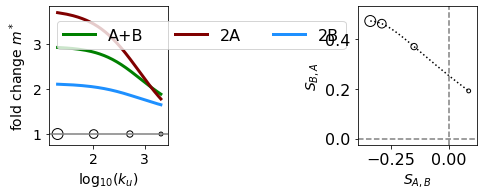

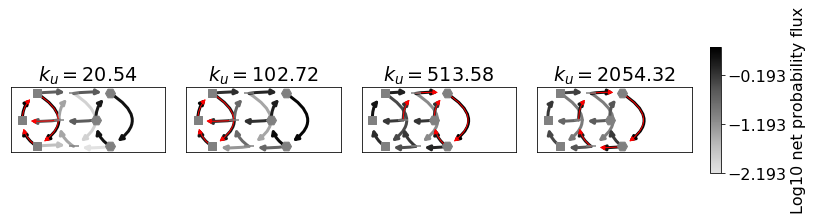

npid 3-0 3315 644


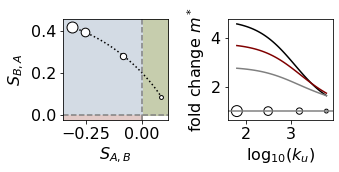

[159.6583402894029 680.1289958688553 14.575348768947391 110.48680645941988]
[887.7384218720059 1835.12435590865 13.119658752217992 499.9627850852269]
[4726.49531639785 2567.153907463747 5.120725641785412 177.46943956700542]
610.792799614582 620.2777143105826


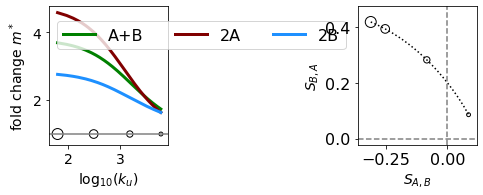

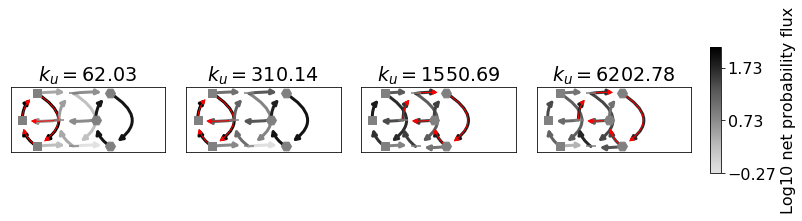

npid 65-1 11250 4848


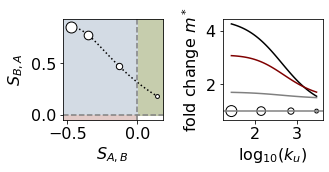

[12.35607549703114 1.3979302061719785 21.86755132210443 10.4312290289087]
[196.2644830796536 4.9136216214656905 6.93156999743738 36.05298066929585]
[6779.517160945913 1.618597080016835 1.5506029146292797 4312.132603790429]
210.9616868323976 286.2980802899199


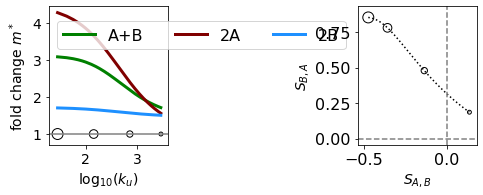

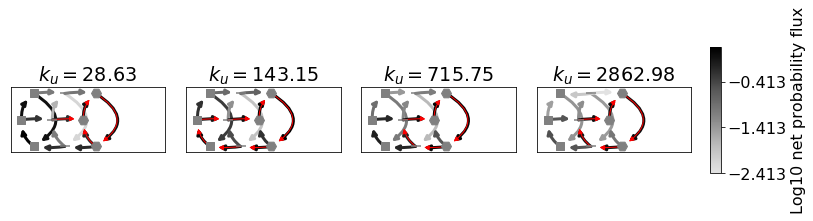

npid 17-0 7402 6136


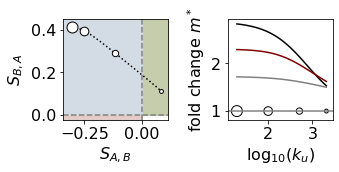

[15.08898444213308 132.5400171410308 5.835568183692679 1.8689661374796835]
[52.170092524818706 9671.01913304696 1.4366514559221428 3.8822157027276534]
[520.3228812184337 3455.5300187825483 4.0808487461450556
 2.1386013630809018]
374.94789520322485 205.4315029799337


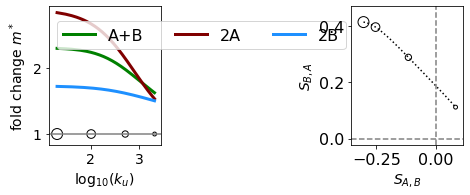

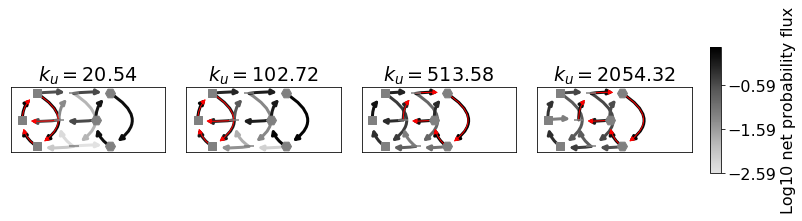

npid 1-0 6138 1986


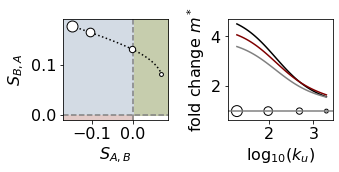

[156.7667719550606 725.7005721594275 257.6638574613588 151.19336467640997]
[6391.26107446097 4623.111870494608 148.76277749799723 215.82984118228345]
[170.8126341995471 1926.1767002157815 1.4904000195938842 8934.982298310415]
70.35737028722146 195.78897201213002


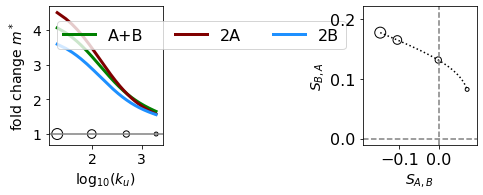

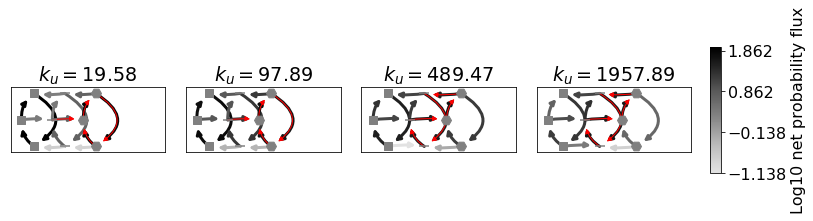

npid 17-0 7641 6155


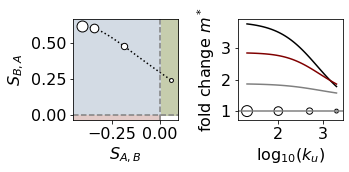

[15.08898444213308 132.5400171410308 5.835568183692679 1.8689661374796835]
[65.08769298657685 5977.068030311013 4.0586156485221565 5.3954186245827565]
[1588.1950544815795 478.30647014838587 1.0415494037387871
 2.3084737183350086]
374.94789520322485 205.4315029799337


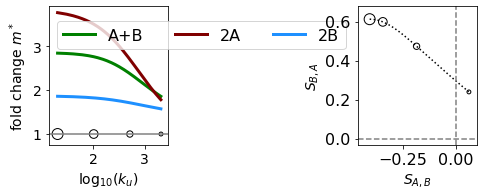

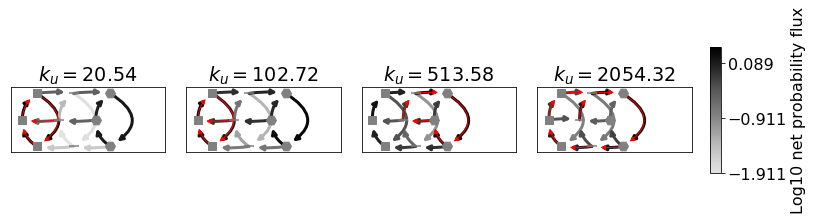

npid 65-1 9868 4724


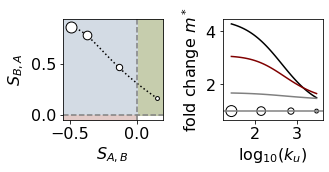

[12.35607549703114 1.3979302061719785 21.86755132210443 10.4312290289087]
[53.107381450276314 4.89256210728999 1.9183649510473024 78.71695009892375]
[5786.148779197005 1.6009992466383038 6.018819857634537 530.2093492561464]
210.9616868323976 286.2980802899199


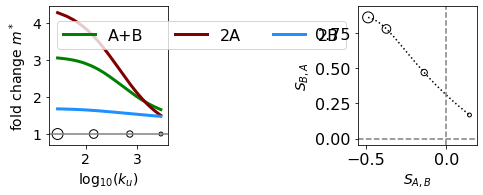

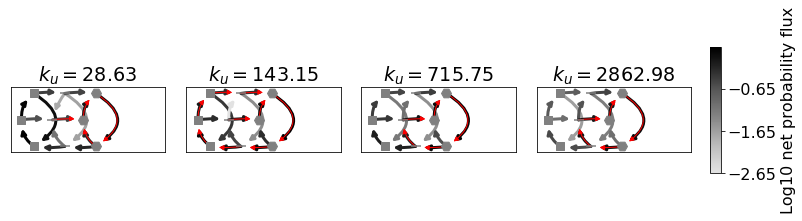

npid 0-0 6138 1696


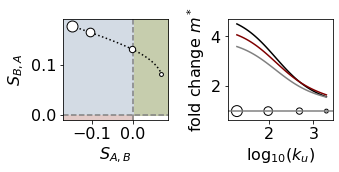

[156.7667719550606 725.7005721594275 257.6638574613588 151.19336467640997]
[6391.26107446097 4623.111870494608 148.76277749799723 215.82984118228345]
[170.8126341995471 1926.1767002157815 1.4904000195938842 8934.982298310415]
70.35737028722146 195.78897201213002


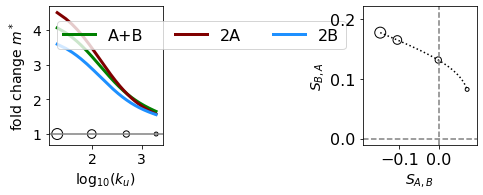

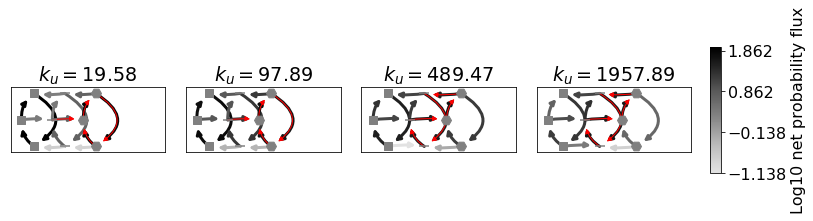

npid 17-0 3516 5813


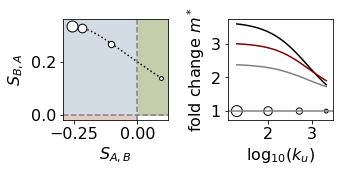

[15.08898444213308 132.5400171410308 5.835568183692679 1.8689661374796835]
[93.91969137865802 1883.782514802595 5.198395840317973 4.965833483394055]
[2790.973649121319 1192.8082427054433 4.366369004164169 2.9502518633822663]
374.94789520322485 205.4315029799337


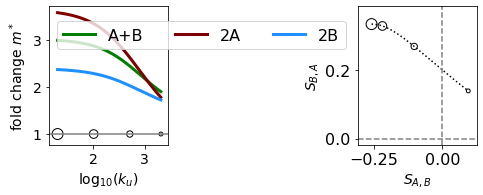

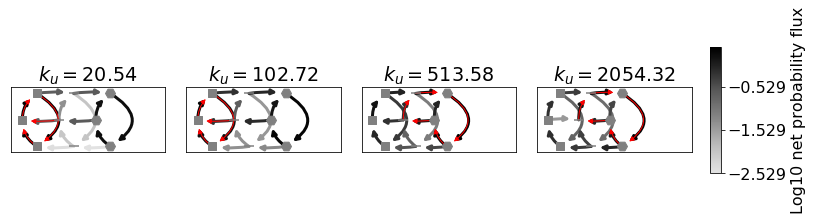

npid 1-1 11833 1995


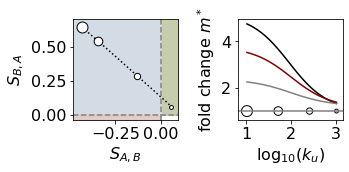

[55.91201312854115 320.89812119887375 22.628496411718153 4.325466272276062]
[65.62710097102307 6093.881415317054 2.1306629657017613 20.123736203299714]
[5683.947100852513 366.6819647649727 11.194272491194873 6.9859315687786605]
47.74921806447126 102.71816172486342


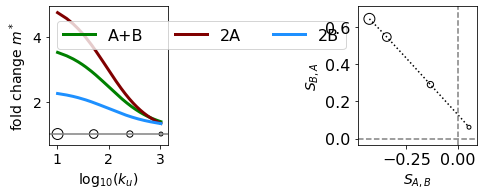

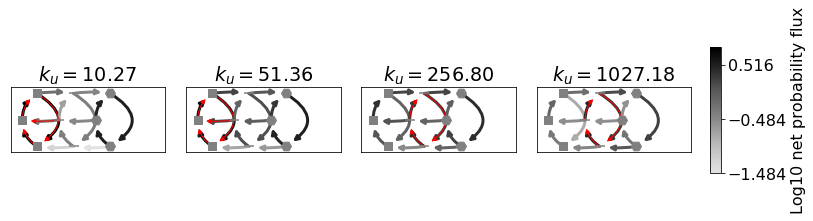

npid 0-1 12291 1706


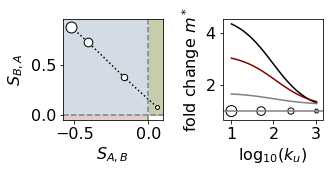

[55.91201312854115 320.89812119887375 22.628496411718153 4.325466272276062]
[59.35424089366425 660.5629915703132 6.650355660128925 20.076399885581147]
[9717.79516952073 3911.667477210159 2.258066402818764 4.9126690296223074]
47.74921806447126 102.71816172486342


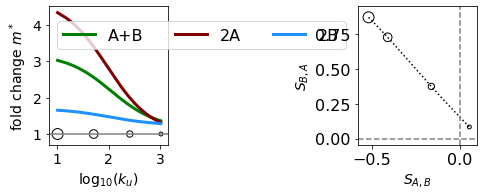

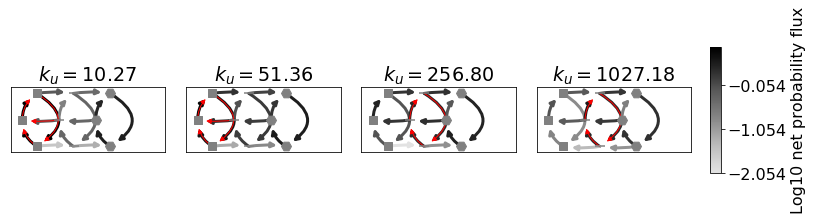

**starting class pndi
pndi 44-1 10761 2778


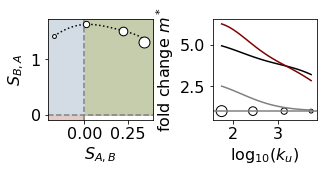

[60.11120726075199 1.3981207549974348 158.79121958532002
 1.8287308339817336]
[655.70016566967 2.001989673334872 7.8075553371068835 808.7093992809137]
[245.2531047262444 4.019153820058508 124.08191261532156 2.361250526885992]
72.68140493286859 553.5104711089572


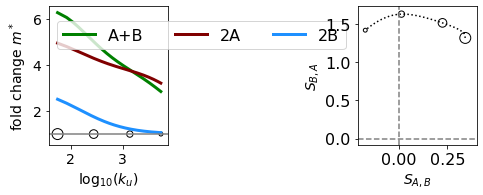

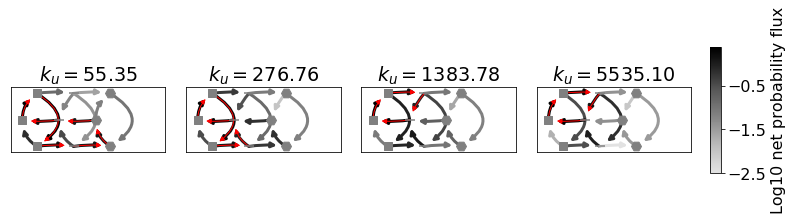

pndi 53-3 33201 4382


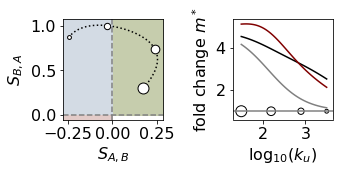

[10.185629006075253 46.362514275936114 34.847417938865576
 13.329225986790846]
[11.037195506105167 599.0538600919821 5.7518235120305885
 2029.7233876435198]
[53.652814455784295 119.40069317309298 7.705305031069588
 17.634893521653797]
65.77531304890938 315.1399130141604


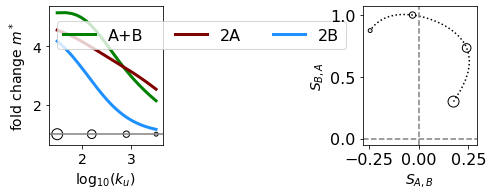

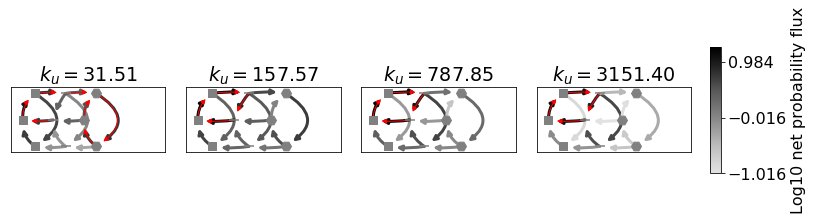

pndi 53-3 32066 4301


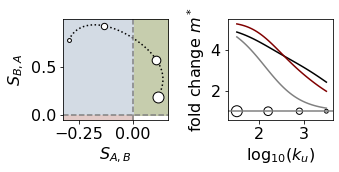

[10.185629006075253 46.362514275936114 34.847417938865576
 13.329225986790846]
[11.787892129682273 5823.902845713808 6.1385633859336926
 1270.6030975141105]
[37.31771360757372 46.73733140179793 3.443004943816782 32.0581059478838]
65.77531304890938 315.1399130141604


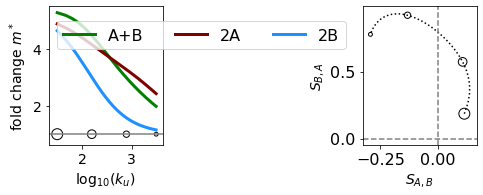

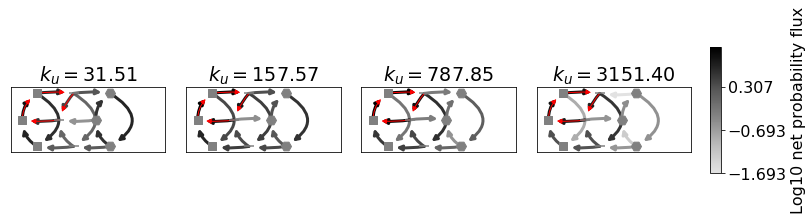

pndi 44-1 10891 2788


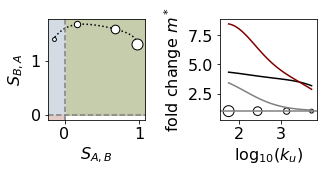

[60.11120726075199 1.3981207549974348 158.79121958532002
 1.8287308339817336]
[1085.7618377463803 1.685804528902058 2.757805072172588 645.4447761098644]
[221.88590339782502 7.877215187054973 2.200242269338104 2.0534399146254647]
72.68140493286859 553.5104711089572


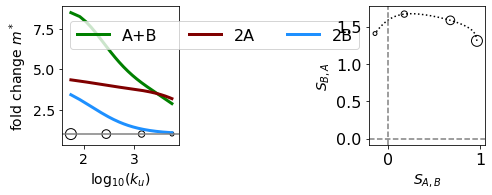

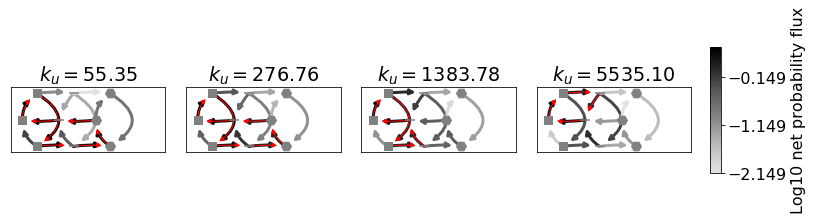

pndi 95-0 5034 619


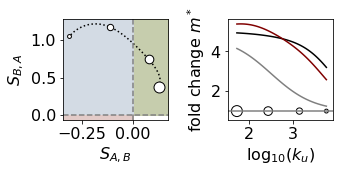

[8.226478182114565 5.79098012614909 3511.0634990184826 751.1100662452675]
[350.4373954150721 5.8947845601694935 739.906209353102 8229.287569589504]
[12.36279490081484 9.831699843309721 14.153880227393994 7073.163635815648]
116.40369514343895 548.181279240817


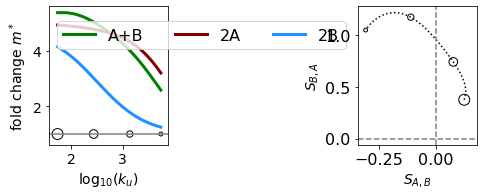

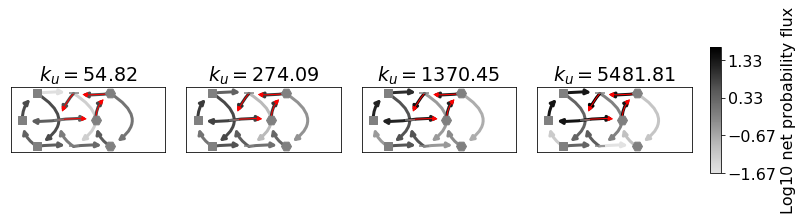

pndi 43-0 783 1135


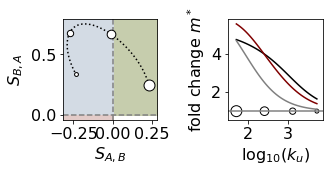

[2.8854813096126035 273.06507478234016 3.4163617966936117 9.16977078566482]
[162.90061639072348 8130.028704059817 1.8572524708866225 9.380710963314476]
[19.581685671053354 474.69717075641955 2.584953005445291 33.96758971192845]
45.11054890486431 522.7270589225136


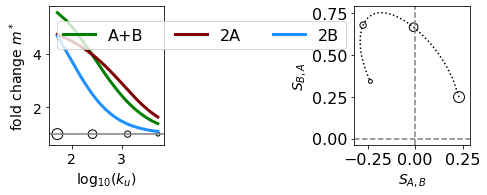

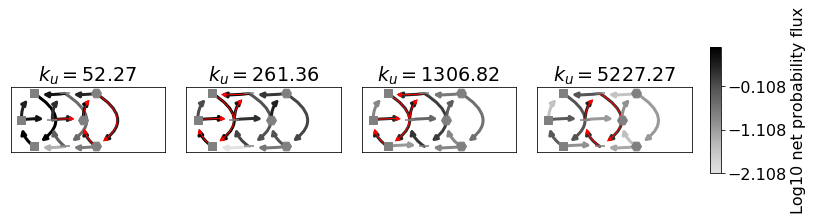

pndi 91-0 1492 4617


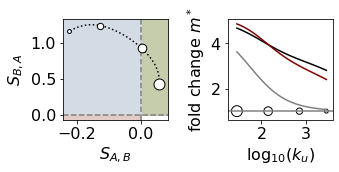

[6.3681661286130895 20.70531614171354 15.346125827992346
 2.3622979546163783]
[2846.5048508235577 326.93303421474604 4.739239431339288
 3.1467220554623885]
[7.97146679797058 413.20069885145404 1.1414637560968652 5.576136108261782]
46.36151559905765 282.127539453282


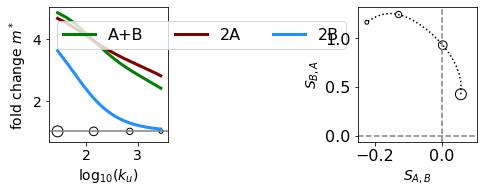

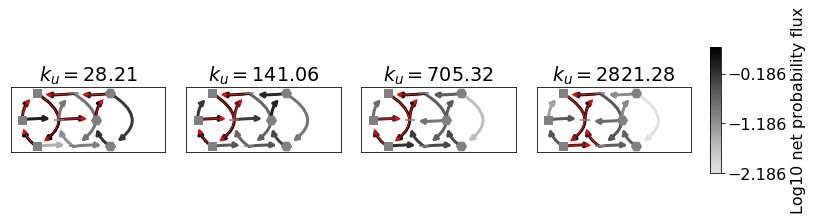

pndi 91-0 3618 4788


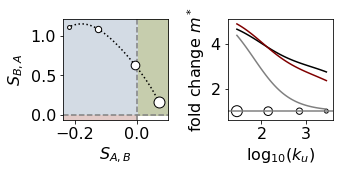

[6.3681661286130895 20.70531614171354 15.346125827992346
 2.3622979546163783]
[2960.098069639177 40.84151733497698 3.6698729015803235 3.411915945230977]
[15.649000837196493 45.22732183860919 1.7437427062872404 5.614513495147572]
46.36151559905765 282.127539453282


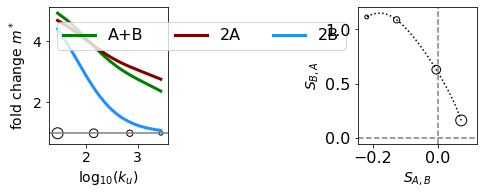

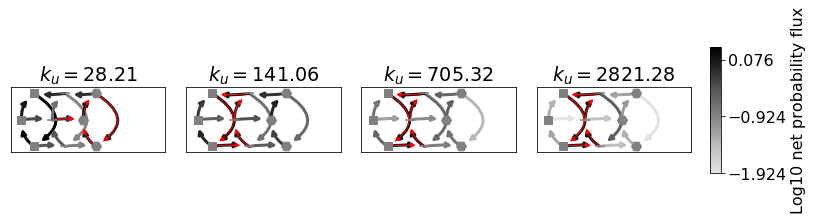

pndi 53-3 29722 4147


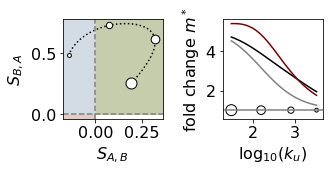

[10.185629006075253 46.362514275936114 34.847417938865576
 13.329225986790846]
[12.314663770228407 227.8490072104723 4.807377148587526 701.1873837728463]
[72.2759502223947 5092.04102759264 24.565869296695404 18.630071579473423]
65.77531304890938 315.1399130141604


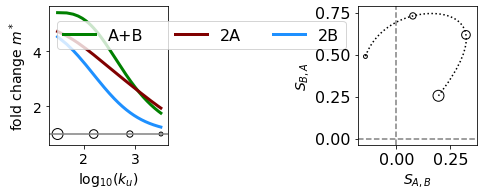

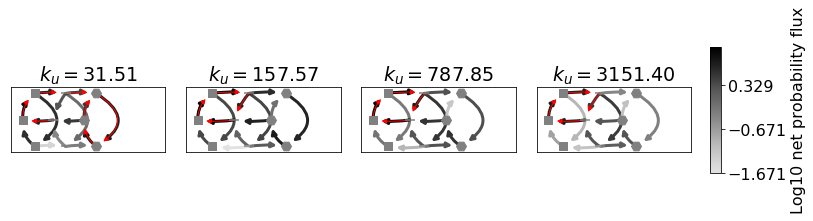

pndi 44-1 11136 2812


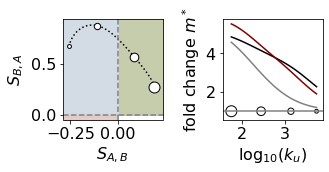

[60.11120726075199 1.3981207549974348 158.79121958532002
 1.8287308339817336]
[270.66060328835226 1.9929833268629544 25.203457216783704
 194.43179096834567]
[651.1607754402357 3.135876005761726 121.90910404995188 7.372355796511912]
72.68140493286859 553.5104711089572


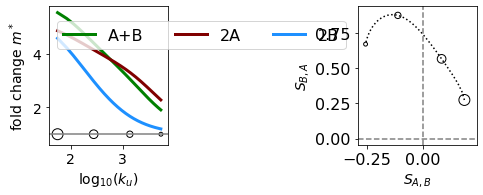

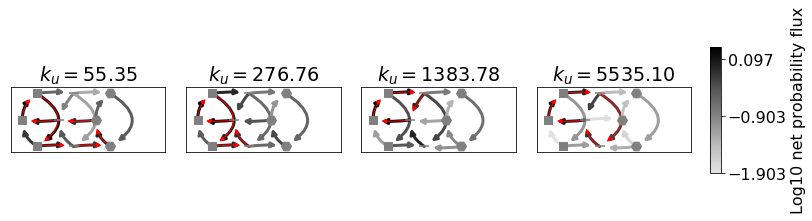

pndi 69-2 17842 1303


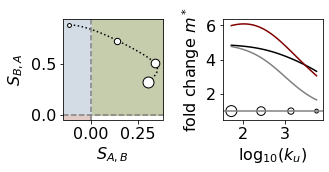

[223.81883242855736 1.271087335505975 31.385270306349195 4.425961026522288]
[456.9023790850875 100.36687081139368 9.09120689857089 5.0573504478111735]
[1004.8891129984979 8.938795559570686 3.2298140159324418
 10.252389581283207]
444.4975833929587 541.1060349732925


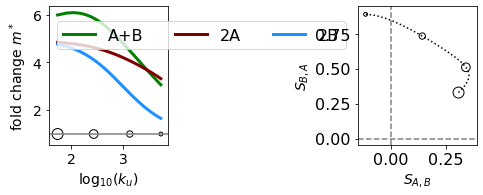

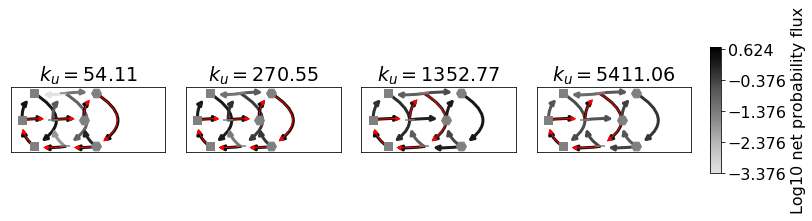

pndi 95-0 8745 861


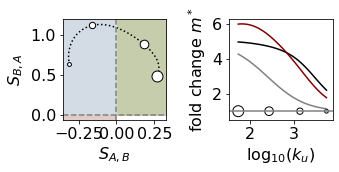

[8.226478182114565 5.79098012614909 3511.0634990184826 751.1100662452675]
[266.1973850265277 6.029296612612059 11.626283725323242 942.3756291353833]
[9.944475895840764 13.932669070713404 3.570026687306082 2617.444393747331]
116.40369514343895 548.181279240817


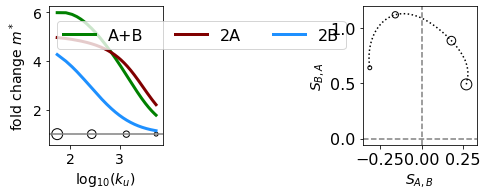

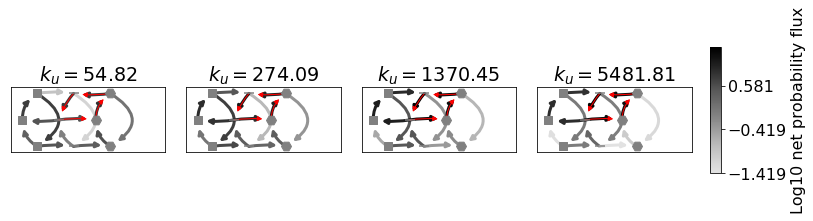

pndi 44-1 9583 2654


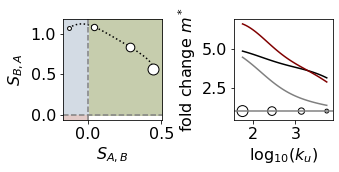

[60.11120726075199 1.3981207549974348 158.79121958532002
 1.8287308339817336]
[643.6371427939233 1.9625690127645128 80.28991926493084 710.0104423186552]
[2628.085083754558 4.500461169142026 87.49341575373171 3.9244908514127768]
72.68140493286859 553.5104711089572


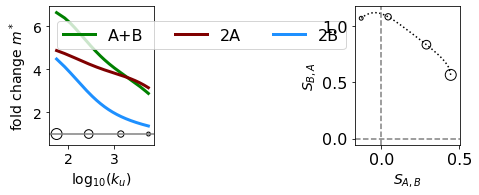

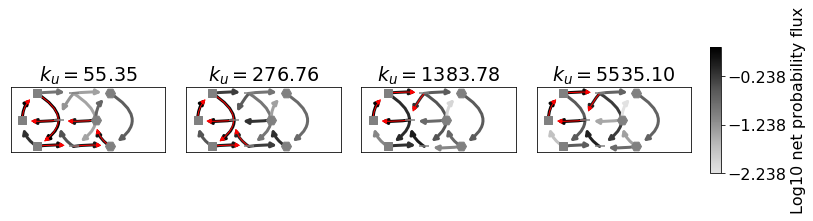

pndi 50-0 4787 2550


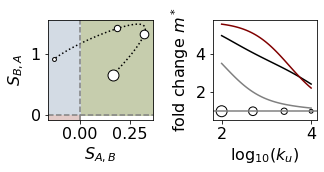

[95.14951570700359 8.172076393193757 10.517092533498722 38.48749441510813]
[502.3097162756205 3068.502397793105 1.7909512432810313 39.72468950378056]
[9511.570710709351 34.1923055964945 1.2618765931966862 3242.56241217914]
56.836875498743346 984.3475400732224


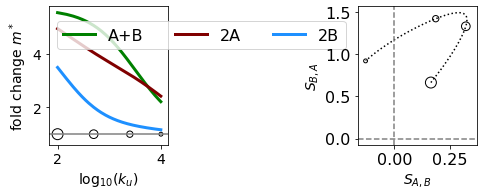

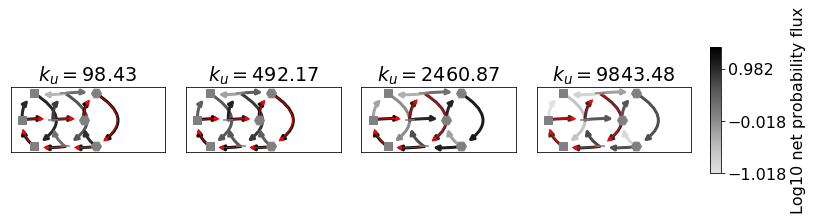

pndi 57-0 3801 1085


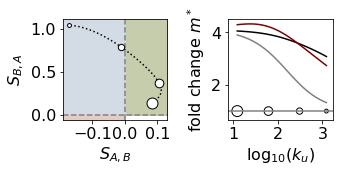

[2.2356230135775603 8.35426790656862 44.08027371158407 17.503737603355447]
[2.3739599714516486 179.70236929232638 3.316991180398219
 1758.4245534138986]
[3.897671433871396 8.800333527987368 1.4071819050236432 24.49638738909857]
135.49141599373294 123.06297437292773


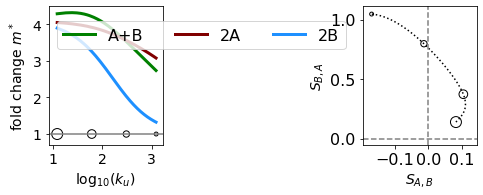

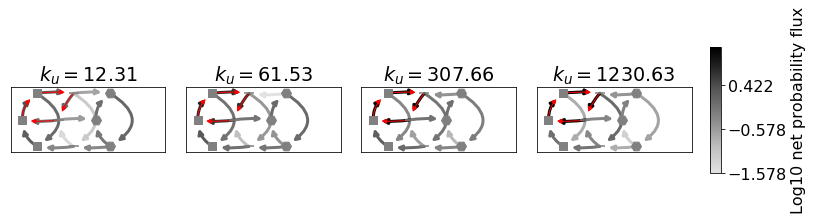

pndi 91-0 1191 4593


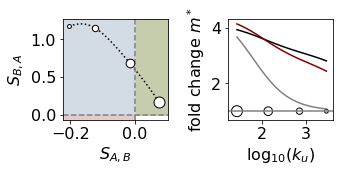

[6.3681661286130895 20.70531614171354 15.346125827992346
 2.3622979546163783]
[3762.549129540593 108.5713410304588 12.299477958526404 2.5939365437372692]
[14.38034138051637 351.33950052242807 2.281859421682773 4.269695291352075]
46.36151559905765 282.127539453282


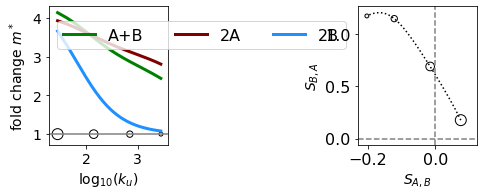

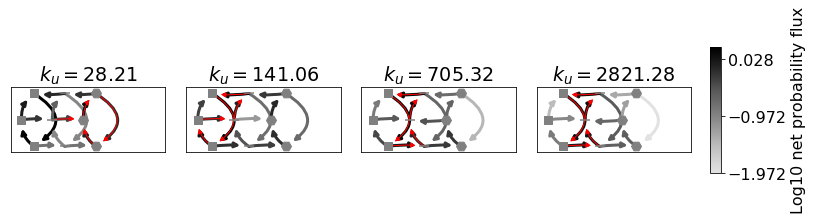

pndi 95-0 1115 354


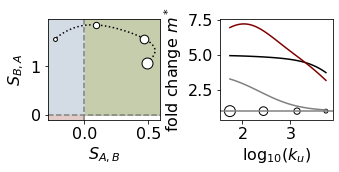

[8.226478182114565 5.79098012614909 3511.0634990184826 751.1100662452675]
[925.5351041664642 5.838547588307826 5.331277572932113 3247.6467117739207]
[10.611466245797844 20.856488955513765 1168.3994007096535
 1359.8392256385907]
116.40369514343895 548.181279240817


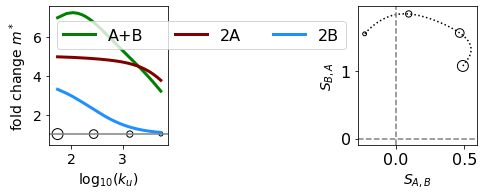

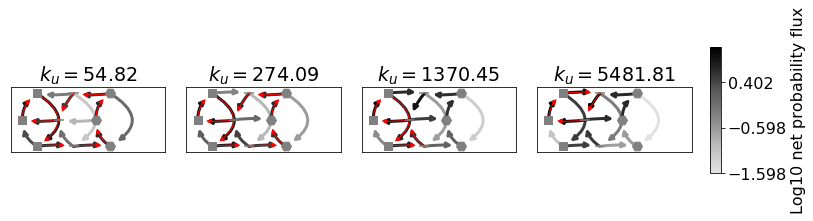

pndi 95-0 5774 661


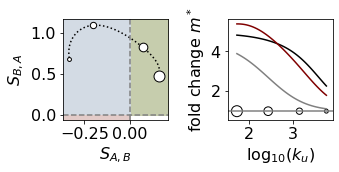

[8.226478182114565 5.79098012614909 3511.0634990184826 751.1100662452675]
[135.40366468734643 5.961648091642151 243.94843413320496 5897.938033237513]
[9.63407995170368 11.514690605563796 4.683964518981743 2182.951725588815]
116.40369514343895 548.181279240817


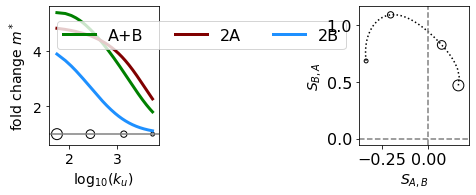

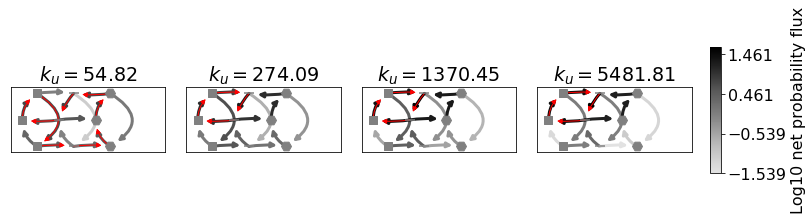

pndi 91-0 5286 4932


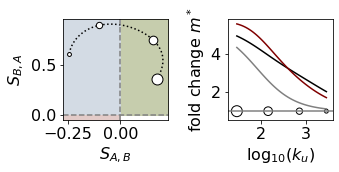

[6.3681661286130895 20.70531614171354 15.346125827992346
 2.3622979546163783]
[511.67750458076927 182.63837458676812 2.1754277397262665
 3.4757481586894237]
[10.135990859425947 410.9448369375441 8.898081281653422 9.568789742076753]
46.36151559905765 282.127539453282


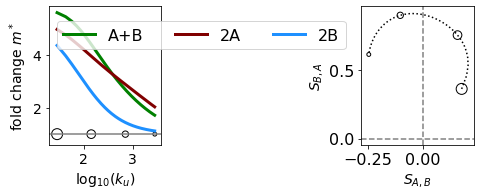

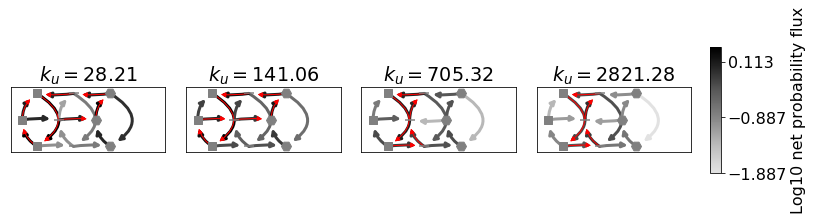

pndi 95-0 3543 515


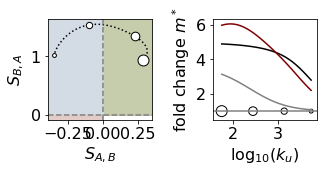

[8.226478182114565 5.79098012614909 3511.0634990184826 751.1100662452675]
[414.308153706186 5.8611697238823846 937.0842582617188 2174.447168991419]
[12.323467083642994 14.790616609760274 1403.5313443819055
 1304.239240210783]
116.40369514343895 548.181279240817


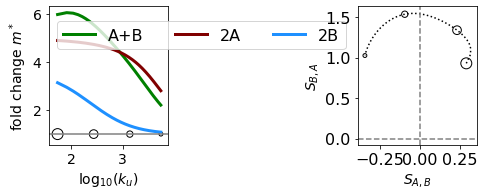

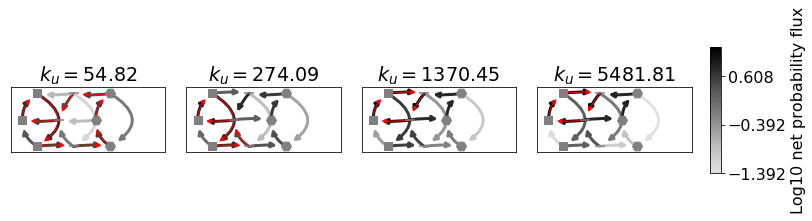

pndi 44-1 11831 2882


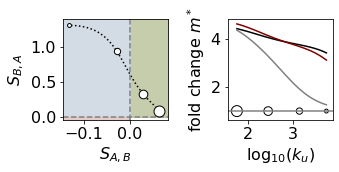

[60.11120726075199 1.3981207549974348 158.79121958532002
 1.8287308339817336]
[2812.733597852298 1.7332987860167384 110.13291340689095 916.7880146296577]
[272.1111552441541 2.09867310558325 101.5238874189853 21.433867936532334]
72.68140493286859 553.5104711089572


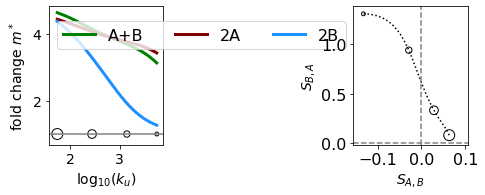

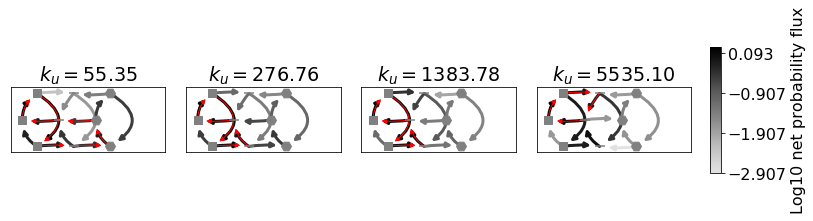

pndi 44-1 9281 2622


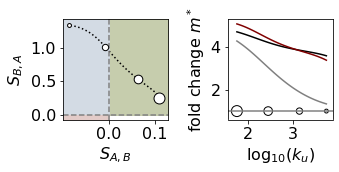

[60.11120726075199 1.3981207549974348 158.79121958532002
 1.8287308339817336]
[7390.764385374691 1.8545777502181464 15.986408148580686 1131.444751521315]
[1591.5479122491834 2.4745631738555693 18.936612168243197
 7.532821880668582]
72.68140493286859 553.5104711089572


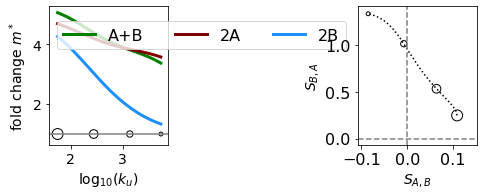

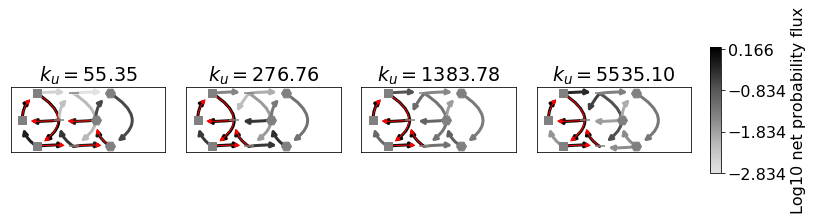

pndi 44-1 15494 3265


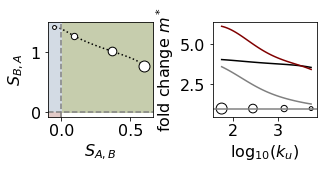

[60.11120726075199 1.3981207549974348 158.79121958532002
 1.8287308339817336]
[2867.0386902972564 1.5322381139017671 2.235974694585684
 1748.5240513690726]
[1737.3535533182949 4.32977611587578 50.52804241663543 2.6689911008911915]
72.68140493286859 553.5104711089572


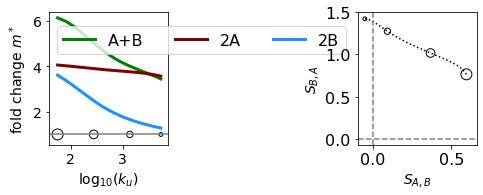

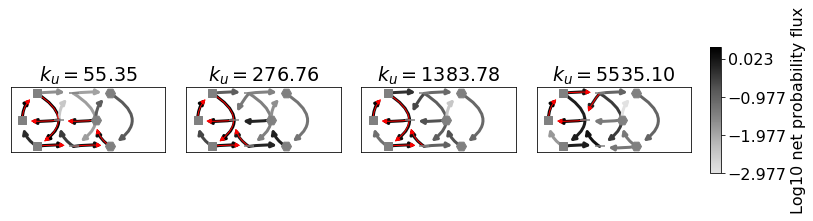

pndi 44-1 9843 2686


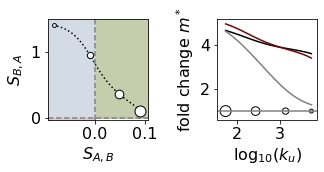

[60.11120726075199 1.3981207549974348 158.79121958532002
 1.8287308339817336]
[3960.6019017715007 1.8287095732352796 22.120079946702813
 1587.402459746214]
[670.2299112244273 2.3232566960313834 53.41771028906386 14.158724203902107]
72.68140493286859 553.5104711089572


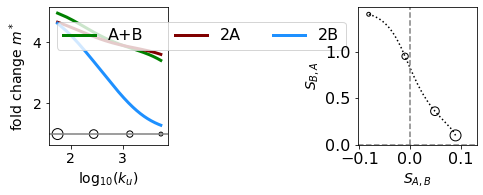

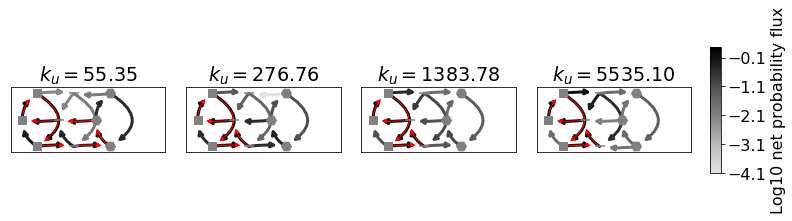

pndi 44-1 14765 3191


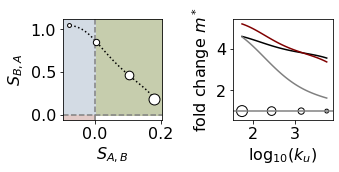

[60.11120726075199 1.3981207549974348 158.79121958532002
 1.8287308339817336]
[6638.233070302462 1.8098058880674992 111.7515522395718 1097.2402743870655]
[9336.96143619035 2.7000954676779987 9.343141104436231 7.887587968421023]
72.68140493286859 553.5104711089572


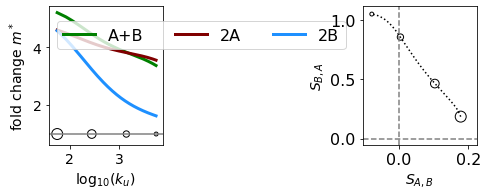

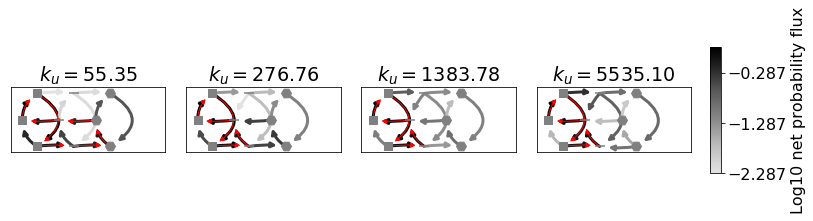

pndi 44-1 14157 3122


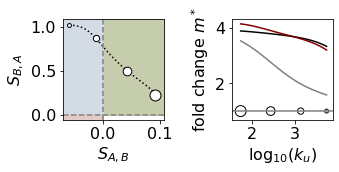

[60.11120726075199 1.3981207549974348 158.79121958532002
 1.8287308339817336]
[339.4302471279624 1.4602489961116931 11.218152200731604
 1571.0832729584604]
[8612.249813405231 1.887986751542094 19.206389246881677 6.5783856561800285]
72.68140493286859 553.5104711089572


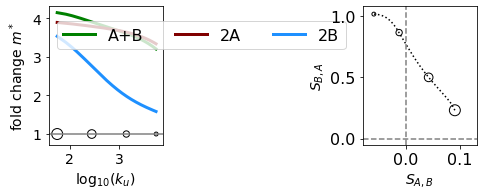

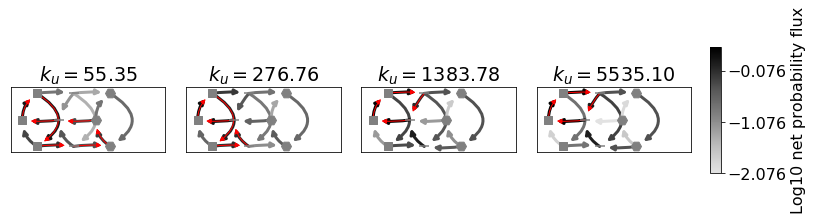

pndi 44-1 13708 3072


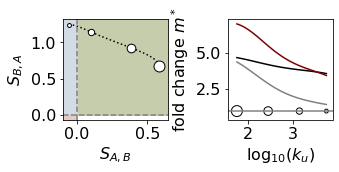

[60.11120726075199 1.3981207549974348 158.79121958532002
 1.8287308339817336]
[9125.67680192807 1.843524922569084 52.44941813872985 1067.0549037781475]
[4239.861541264886 5.0779407957694636 2.6141681303373385 3.291595627087004]
72.68140493286859 553.5104711089572


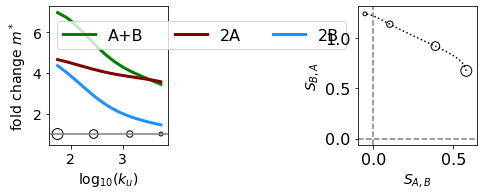

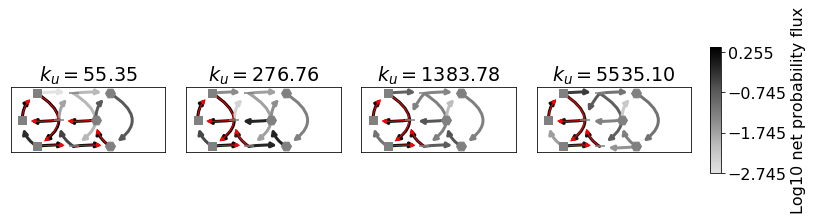

pndi 44-1 15117 3226


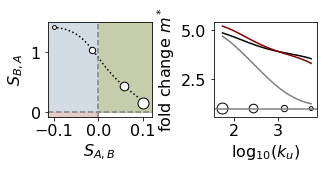

[60.11120726075199 1.3981207549974348 158.79121958532002
 1.8287308339817336]
[9089.882208367044 1.940419119334309 1.6823706639559082 900.7780509858716]
[603.6550415998506 2.5318969150585517 2.5898434076664754 10.84221832486054]
72.68140493286859 553.5104711089572


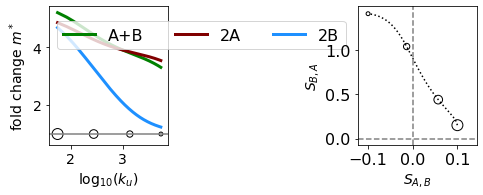

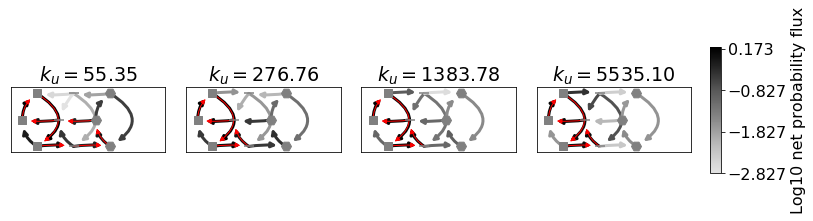

pndi 44-1 13834 3091


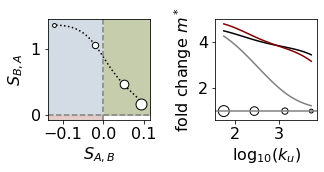

[60.11120726075199 1.3981207549974348 158.79121958532002
 1.8287308339817336]
[1885.2683132963812 1.752120196368096 13.807928969319992
 1111.2564378990692]
[653.1871695799093 2.2652455670968497 2.766862191591278 9.56363507592934]
72.68140493286859 553.5104711089572


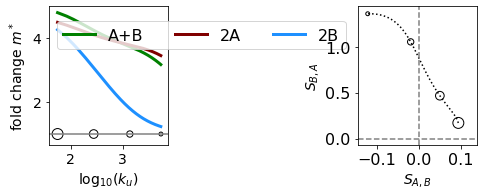

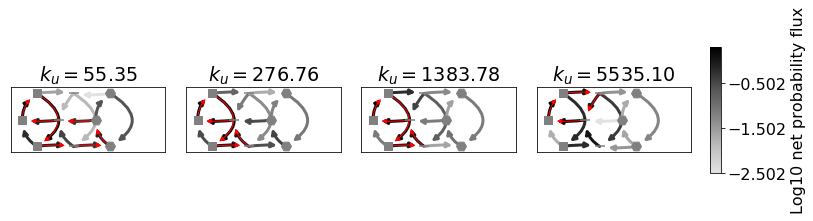

pndi 44-1 9556 2651


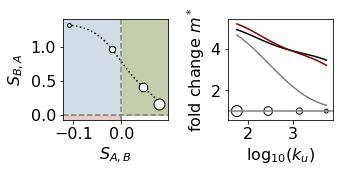

[60.11120726075199 1.3981207549974348 158.79121958532002
 1.8287308339817336]
[844.8668989913826 1.9863352073350176 1.4068266780702583 1626.310402655792]
[806.170779595774 2.495185893747073 42.97562341585951 11.615695526987365]
72.68140493286859 553.5104711089572


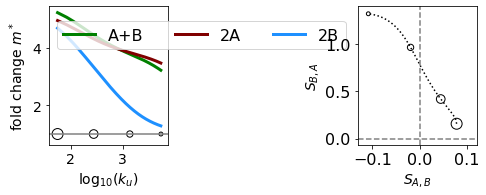

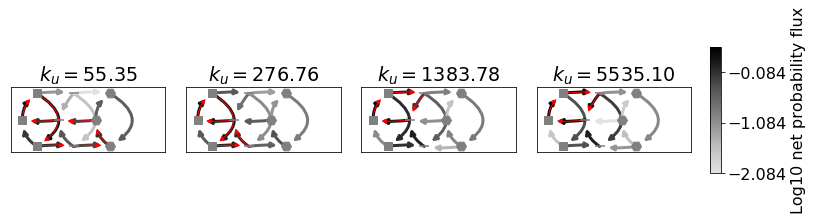

pndi 44-1 11811 2881


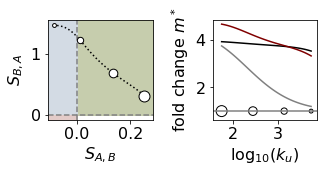

[60.11120726075199 1.3981207549974348 158.79121958532002
 1.8287308339817336]
[3929.254906822801 1.4704486803737238 1.0371285414643916
 1321.0214784529085]
[814.1794728597198 2.4882219978506424 136.7240254078471 5.7796369190974675]
72.68140493286859 553.5104711089572


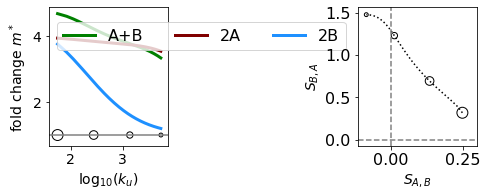

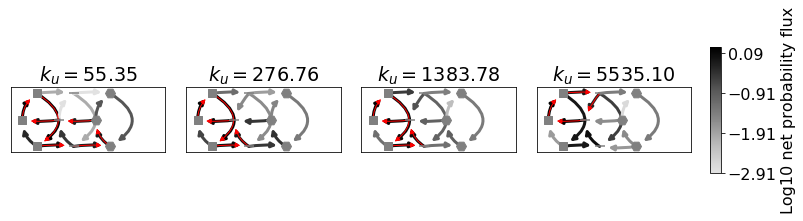

pndi 44-1 9097 2601


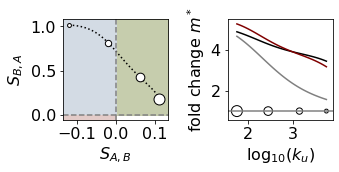

[60.11120726075199 1.3981207549974348 158.79121958532002
 1.8287308339817336]
[7651.7955634800455 1.9522226543978909 21.76320547990566 623.9002969282734]
[5211.021505800113 2.6009122086927685 94.94327407483763 9.391231518529114]
72.68140493286859 553.5104711089572


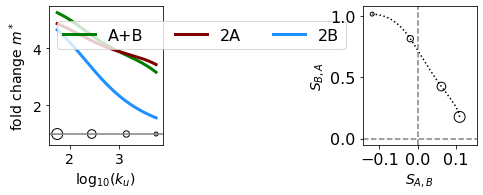

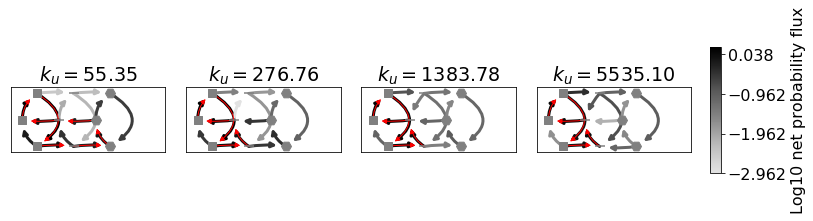

pndi 44-1 13794 3082


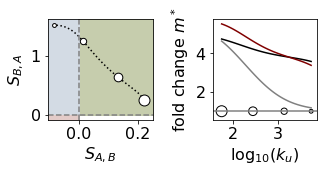

[60.11120726075199 1.3981207549974348 158.79121958532002
 1.8287308339817336]
[4615.884028677368 1.8826041664465447 16.20458688904234 1362.8046338289835]
[117.26782369609268 3.024953303859737 158.4311229352646 17.32100490945917]
72.68140493286859 553.5104711089572


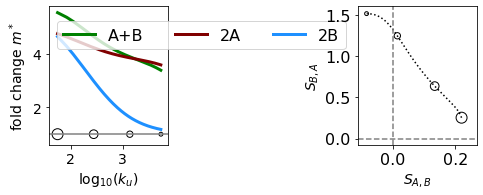

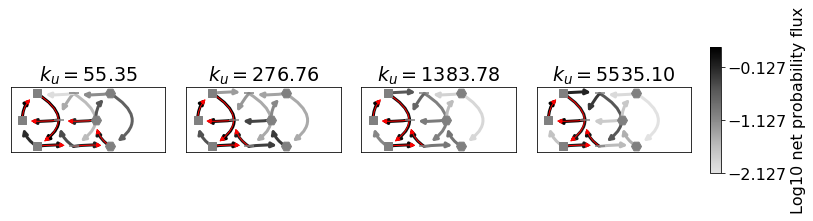

pndi 44-1 12735 2962


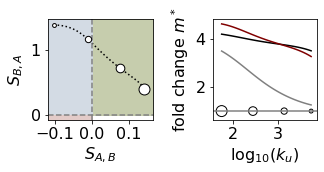

[60.11120726075199 1.3981207549974348 158.79121958532002
 1.8287308339817336]
[9264.00146107938 1.608000430060721 16.305715933394715 843.8324244767107]
[1286.1733720771088 2.2783081387410684 2.522031779149037
 4.5377870746511455]
72.68140493286859 553.5104711089572


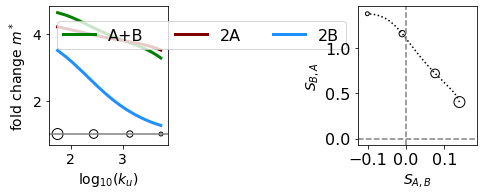

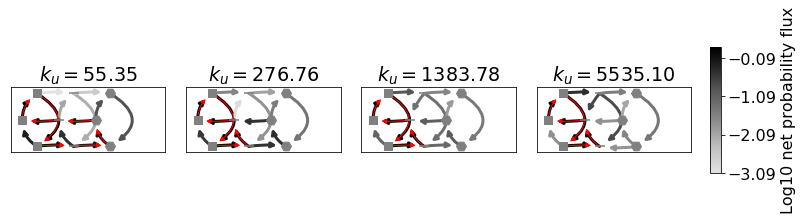

pndi 44-1 16674 3389


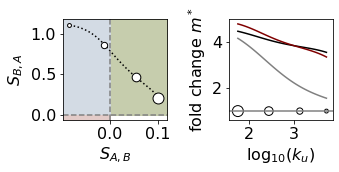

[60.11120726075199 1.3981207549974348 158.79121958532002
 1.8287308339817336]
[9035.77527895688 1.7449424897651362 62.01204335540293 1013.9984876146933]
[5672.412627659055 2.2811569170802697 32.03869437229045 8.184771792244225]
72.68140493286859 553.5104711089572


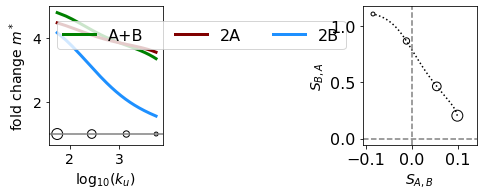

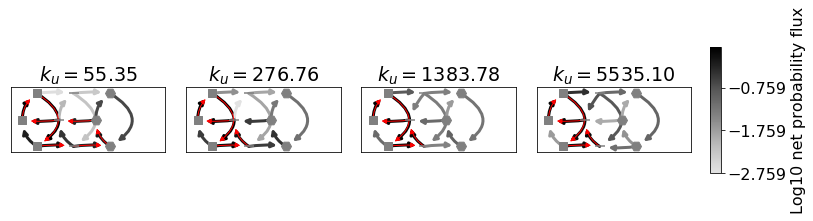

pndi 44-1 17882 3510


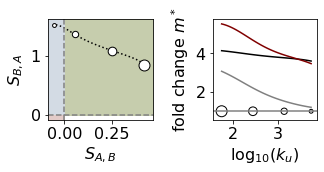

[60.11120726075199 1.3981207549974348 158.79121958532002
 1.8287308339817336]
[8020.881711450632 1.5769455334409566 8.816607524105136 1496.5186556834644]
[1082.0690744955157 3.4757599341646053 2.3596062536540425
 2.225148725175118]
72.68140493286859 553.5104711089572


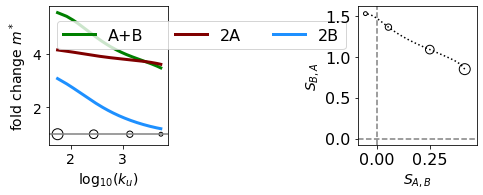

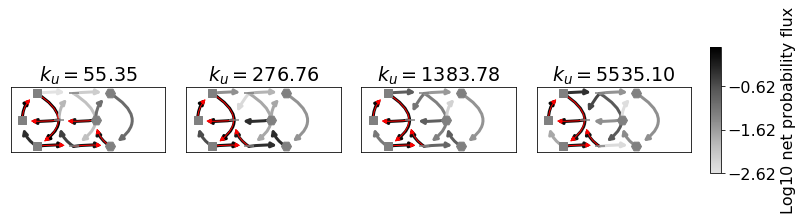

pndi 44-1 17413 3461


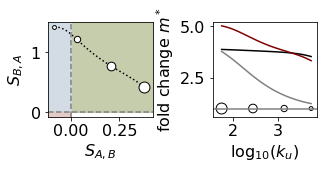

[60.11120726075199 1.3981207549974348 158.79121958532002
 1.8287308339817336]
[6228.320080733829 1.434884245654972 4.909080083613516 1031.981371243756]
[1173.2539896449198 2.955807583758192 3.1056533542195486 3.931012729125492]
72.68140493286859 553.5104711089572


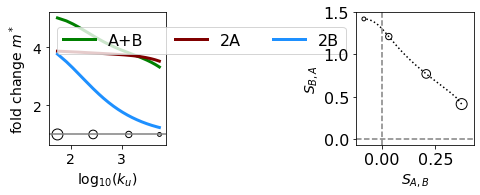

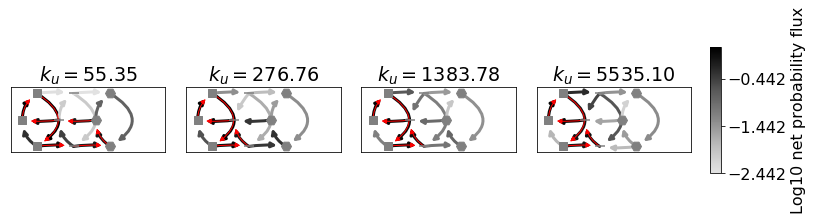

pndi 95-0 6298 699


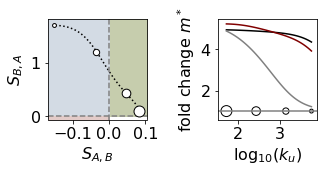

[8.226478182114565 5.79098012614909 3511.0634990184826 751.1100662452675]
[2824.177059690482 5.7925555613087045 106.22494518247996
 3447.4145200775047]
[32.05242484094212 7.975979244460226 89.07875376168442 1086.864752816592]
116.40369514343895 548.181279240817


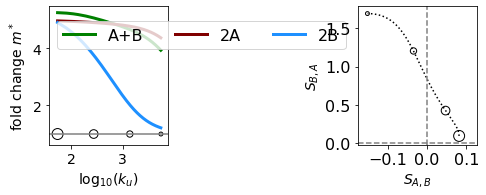

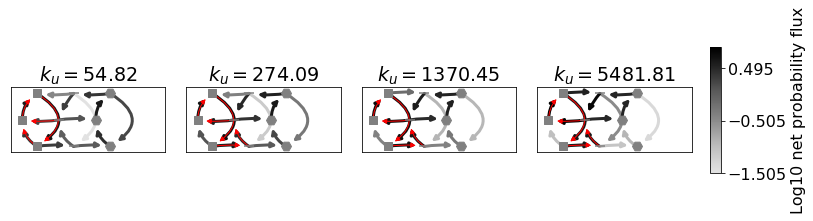

pndi 44-1 15378 3248


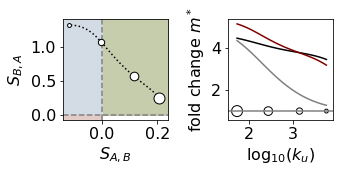

[60.11120726075199 1.3981207549974348 158.79121958532002
 1.8287308339817336]
[7868.6136720267705 1.7408929289118458 17.090584279021808
 680.0334284887319]
[1187.0769097417194 2.729889290794413 66.86202711799714 6.929585669252392]
72.68140493286859 553.5104711089572


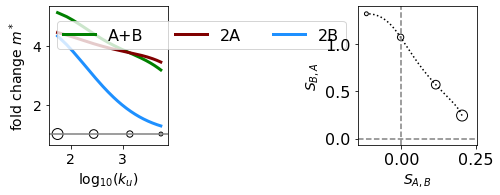

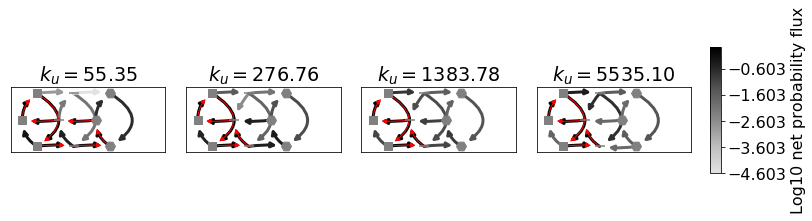

pndi 44-1 12443 2936


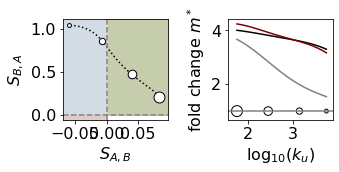

[60.11120726075199 1.3981207549974348 158.79121958532002
 1.8287308339817336]
[138.9090349220012 1.5332690712624832 3.237318756155766 1633.1720286548916]
[5959.782542702162 1.9554203722071597 157.69356291875573 7.232468502367594]
72.68140493286859 553.5104711089572


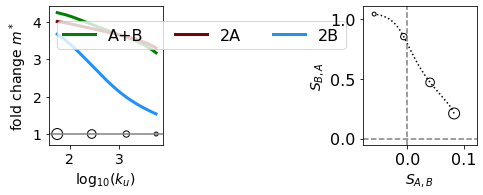

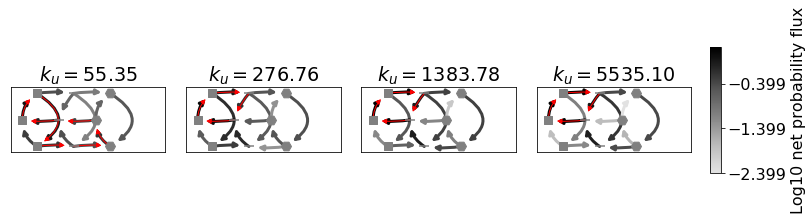

In [17]:
#Now select examples/ old code finally not shown in the paper
fontsize=16
np.random.seed(3)

classes_signs=[["ppii",[1,1]],["npii",[1,1]],["npid",[1,-1]],["pndi",[-1,1]]]
for cs in classes_signs:
    class_,signst=cs
    print("**starting class",class_)

    #class_="ppdi"

    subset=df[df["class"]==class_]
    #subset=subset[subset["id"]=="44-1"]
    #row=33714
    #if True:
    nplottedm=0
    nplottednm=0
    for row in np.random.choice(range(len(subset)),len(subset),replace=False):
        if nplottedm<20 or nplottednm<20:
            fullpars=subset.iloc[row].values[3:3+24]
            synergiesab=[]
            synergiesba=[]
            mlist=[]
            cont=True
            allkus=[]
            for i in range(len(allkufactors)):
                parset2=fullpars.copy()
                parset2[[13,15,17,19,21,23]]=parset2[[13,15,17,19,21,23]]*allkufactors[i]
                allkus.append(parset2[13])
                #print(parset2)
                out=compute_synergyb(parset2,PolAB_A_allpars.interface_GRF_PolAB_A_A,fcind=5,fcpair=5,returnm=True)
                if out[0]==None:
                    cont=False
                    break
                else:
                    synab,synba,m=out
                    synergiesab.append(synab)
                    synergiesba.append(synba)
                    mlist.append(m)
            if allkus[0]<10:
                cont=False
            if cont:
                executeplot=False
                synab=np.array(synergiesab)
                synba=np.array(synergiesba)
                difab=np.sign(np.diff(synab))
                difba=np.sign(np.diff(synba))
                if np.all(difab==signst[0]) and np.all(difba==signst[1]):
                    
                    if nplottedm<20:
                        nplottedm+=1
                        executeplot=True
                else:
                    if nplottednm<20:
                        nplottednm+=1
                        executeplot=True
                if executeplot:
                    print(class_,subset.iloc[row]["id"],subset.iloc[row].name,row)

                    fig,axes=plt.subplots(1,2,figsize=(5,2.5))
                    ax.set_title(subset.iloc[row].name)
                    ax=axes[0]

                    ax.plot(synab,synba,linestyle=":",color="k")
                    kus=[]
                    for i in range(len(kufactors)):
                        parset2=fullpars.copy()
                        #print(kufactors[i])
                        parset2[[13,15,17,19,21,23]]=parset2[[13,15,17,19,21,23]]*kufactors[i]
                        kus.append(parset2[13])
                        #print(parset2)
                        synabs,synbas,m=compute_synergyb(parset2,PolAB_A_allpars.interface_GRF_PolAB_A_A,fcind=5,fcpair=5,returnm=True)
                        ax.scatter(synabs,synbas,facecolor="white",edgecolor="k",s=msizes[i],zorder=3)


                    ax.axvline(x=0,color='grey',linestyle="--")
                    ax.axhline(y=0,color='grey',linestyle="--")
                    ax.set_xlabel("$S_{A,B}$")
                    ax.set_ylabel("$S_{B,A}$")
                    tint_ax(ax)
                    ax.tick_params(axis='both',labelsize=fontsize)

                    ax=axes[1]
                    m0=np.array([m[0] for m in mlist])
                    mA=np.array([m[1] for m in mlist])
                    mB=np.array([m[2] for m in mlist])
                    mAB=np.array([m[3] for m in mlist])
                    mA=mA/m0
                    mB=mB/m0
                    mAB=mAB/m0

                    ax.plot(np.log10(allkus),mA,color="k",label="2A")
                    ax.plot(np.log10(allkus),mB,color="gray",label="2B")
                    ax.plot(np.log10(allkus),mAB,color="maroon",label="AB")

                    ax.set_xlabel(r'log$_{10}$($k_u$)',fontsize=fontsize)
                    ax.set_ylabel(r"fold change $m^*$",fontsize=fontsize)
                    ax.tick_params(axis='both',labelsize=fontsize)
                    #ax.legend(loc='lower left',bbox_to_anchor=(0,1),ncol=3)
                    ax.axhline(y=1,color='grey')
                    ax.scatter(np.log10(kus),[1]*len(kufactors),s=msizes,edgecolors='k',facecolors='white')
                    plt.tight_layout()
                    plt.show()
                    
                    makeplot(fullpars)


In [43]:
df.loc[0]

,npt1,npt2,class,p0,p1,p2,p3,p4,p5,p6,...,synba_0.1,synba_1.51429,synba_2.92857,synba_4.34286,synba_5.75714,synba_7.17143,synba_8.58571,synba_10,name,id
0,0,1,npii,67.954746,17.115848,8.432341,12.873547,329.674124,33.125168,3.718963,...,0.105398,0.328018,0.512489,0.668720,0.803215,0.920479,1.023762,1.115490,35,35-0
0,0,1,zerod,1.426418,1319.477054,2.348632,340.071899,17.602698,5214.583277,1.082964,...,0.692473,0.107273,0.058132,0.039845,0.030300,0.024439,0.020476,0.017617,34,34-0
0,0,1,zerod,225.176573,3898.117373,3682.331795,1833.791305,346.885776,5660.641684,4.113560,...,0.183318,0.047331,0.028429,0.020808,0.016646,0.014000,0.012156,0.010789,20,20-0
0,0,1,zerod,6.820907,84.474231,48.100782,2733.556118,18.409193,1152.322278,21.624968,...,0.073640,0.050370,0.039254,0.032701,0.028350,0.025228,0.022863,0.020998,22,22-0
0,0,2,npii,9.863715,63.081452,44.031473,10.995089,42.468466,1862.007746,12.885062,...,0.132969,0.221926,0.263140,0.285547,0.298678,0.306592,0.311307,0.313938,33,33-0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,0,4,nnid,15.088984,132.540017,5.835568,1.868966,6791.808826,199.657632,1.385635,...,0.663628,0.547932,0.465808,0.405000,0.358205,0.321078,0.290900,0.265881,17,17-0
0,0,1,zerod,4.136675,912.428382,11.304727,136.444984,33.780568,9380.840881,9.002497,...,0.558937,0.079568,0.042955,0.029510,0.022525,0.018241,0.015341,0.013245,12,12-0
0,0,2,nnid,1290.653437,8.915894,1982.047831,7294.521223,9521.191127,20.579882,1799.919126,...,0.691546,0.658946,0.629327,0.602295,0.577519,0.554726,0.533685,0.514198,13,13-0
0,0,1,nnid,5.261127,1.196468,71.264642,793.845006,1907.195935,4.609021,7.358851,...,0.330280,0.266645,0.230677,0.208565,0.194244,0.184660,0.178118,0.173608,11,11-0
